# Protein Sequence Classification: BERT Models

In [ ]:
# Check GPU for LSTM and BERT models to run
import torch
use_cuda=torch.cuda.is_available()
if use_cuda:
  print("GPU acceleration enabled")
else:
  print("GPU acceleration NOT enabled.  If using Colab, have you changed the runtype type and selected GPU as the hardware accelerator?")
device=torch.device("cuda" if use_cuda else "cpu")

GPU acceleration enabled


### Check mps or gpu on mac m1

In [ ]:
import torch
device = "mps" if getattr(torch, 'has_mps', False)\
else 'gpu' if torch.cuda.is_available() else 'cpu'
print(device)

mps


In [ ]:
gpu = len(tf.config.list_physical_devices("GPU"))>0
print("GPU is", "available" if gpu else "NOT AVAILABLE")

GPU is available


In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

Physical devices cannot be modified after being initialized


In [ ]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
  try:
    tf.config.set_visible_devices(gpus, 'GPU')
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
  except RuntimeError as e:
    # Visible devices must be set before GPUs have been initialized
    print(e)

1Metal device set to: Apple M1
 Physical GPUs, 1 Logical GPU


## Import Libraries

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from collections import Counter
import re
from tqdm import tqdm
import random

import tensorflow as tf
# tf.config.run_functions_eagerly(True)
import torch


In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# To ensure reproducibility
# for keras operations that use random numbers internally
random_seed = 42
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed_all(random_seed)
np.random.seed(random_seed)
tf.random.set_seed(random_seed)

## Loading cleaned protein sequence data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/protein_seq_classification/pdb/pdb_protein_seq_clean.csv')
data = pd.read_csv('pdb_protein_seq_clean.csv')
# data.head()

# BERT

In [ ]:
from sklearn.metrics import f1_score, accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import multilabel_confusion_matrix

import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 35.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.8/294.8 kB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 44.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 13.2 MB/s eta 0:00:00


In [ ]:
# for reproductivity of results
from transformers import set_seed
set_seed(random_seed)

In [ ]:
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader

import transformers
from transformers import BertModel, BertTokenizer, BertTokenizerFast, BertForSequenceClassification, AdamW, get_linear_schedule_with_warmup

from collections import defaultdict

In [ ]:
sequence_lengths = list()
for seq in data["clean_sequence"]:
    sequence_lengths.append(len(seq))

avg_length = int(np.mean(sequence_lengths))
print(avg_length)

281


In [ ]:
max_length = int(np.max(sequence_lengths))
print(max_length)

5037


In [ ]:
data['sequences'] = data['clean_sequence'].str.replace('', ' ')
data.head()

,structureId,classification,macromoleculeType,sequence,seq_char_count,clean_sequence,sequences
0,101M,oxygen transport,Protein,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,154,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,M V L S E G E W Q L V L H V W A K V E A D V A...
1,102L,hydrolase,Protein,MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAAKSE...,165,MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAAKSE...,M N I F E M L R I D E G L R L K I Y K D T E G...
2,102M,oxygen transport,Protein,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,154,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,M V L S E G E W Q L V L H V W A K V E A D V A...
3,103L,hydrolase,Protein,MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNSLDAAK...,167,MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNSLDAAK...,M N I F E M L R I D E G L R L K I Y K D T E G...
4,103M,oxygen transport,Protein,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,154,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,M V L S E G E W Q L V L H V W A K V E A D V A...


In [ ]:
labellist = sorted(list(set(data['classification'].unique())))
labels_dict = {label:i for i, label in enumerate(labellist)}
labels_dict

{'allergen': 0,
 'antibiotic hydrolase': 1,
 'antibiotic transferase': 2,
 'antimicrobial protein': 3,
 'apoptosis': 4,
 'biosynthetic protein': 5,
 'biotin-binding protein': 6,
 'blood clotting': 7,
 'calcium-binding protein': 8,
 'cell adhesion': 9,
 'cell cycle': 10,
 'cell invasion': 11,
 'chaperone': 12,
 'contractile protein': 13,
 'cytokine': 14,
 'de novo protein': 15,
 'dna binding protein': 16,
 'electron transport': 17,
 'endocytosis': 18,
 'endocytosis/exocytosis': 19,
 'flavoprotein': 20,
 'fluorescent protein': 21,
 'gene regulation': 22,
 'growth factor hormone': 23,
 'hormone': 24,
 'hormone receptor': 25,
 'hydrolase': 26,
 'hydrolase inhibitor': 27,
 'immune system': 28,
 'immunoglobulin': 29,
 'isomerase': 30,
 'isomerase inhibitor': 31,
 'lectin': 32,
 'ligase': 33,
 'ligase inhibitor': 34,
 'lipid binding protein': 35,
 'lipid transport': 36,
 'luminescent protein': 37,
 'lyase': 38,
 'lyase inhibitor': 39,
 'membrane protein': 40,
 'metal binding protein': 41,
 'm

In [ ]:
labels_dict_reverse = {value:key for (key,value)in labels_dict.items()}

In [ ]:
data['classes'] = data['classification'].map(labels_dict)
data.head()

,structureId,classification,macromoleculeType,sequence,seq_char_count,clean_sequence,sequences,classes
0,101M,oxygen transport,Protein,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,154,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,M V L S E G E W Q L V L H V W A K V E A D V A...,48
1,102L,hydrolase,Protein,MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAAKSE...,165,MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNAAAKSE...,M N I F E M L R I D E G L R L K I Y K D T E G...,26
2,102M,oxygen transport,Protein,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,154,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,M V L S E G E W Q L V L H V W A K V E A D V A...,48
3,103L,hydrolase,Protein,MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNSLDAAK...,167,MNIFEMLRIDEGLRLKIYKDTEGYYTIGIGHLLTKSPSLNSLDAAK...,M N I F E M L R I D E G L R L K I Y K D T E G...,26
4,103M,oxygen transport,Protein,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,154,MVLSEGEWQLVLHVWAKVEADVAGHGQDILIRLFKSHPETLEKFDR...,M V L S E G E W Q L V L H V W A K V E A D V A...,48


### Using Uni-mers

In [ ]:
protein_df1 = data[['sequences', 'classes']]
protein_df1.head()

,sequences,classes
0,M V L S E G E W Q L V L H V W A K V E A D V A...,48
1,M N I F E M L R I D E G L R L K I Y K D T E G...,26
2,M V L S E G E W Q L V L H V W A K V E A D V A...,48
3,M N I F E M L R I D E G L R L K I Y K D T E G...,26
4,M V L S E G E W Q L V L H V W A K V E A D V A...,48


In [ ]:
# splitting the dataset
random_seed = 42
df_train_unimers, df_test_unimers = train_test_split(protein_df1, test_size = 0.1, shuffle = True, stratify = protein_df1['classes'], random_state = random_seed)
df_train_unimers, df_val_unimers = train_test_split(df_train_unimers, test_size = 0.1, shuffle = True, stratify = df_train_unimers['classes'], random_state = random_seed)

print(df_train_unimers.shape, df_val_unimers.shape, df_test_unimers.shape)

(111990, 2) (12444, 2) (13827, 2)


## BertForSequenceClassification

In [ ]:
MAX_LEN = avg_length

In [ ]:
tokenizer = BertTokenizer.from_pretrained('bert-base-cased', do_lower_case = False)

In [ ]:
from protein_data import ProteinDataset

In [ ]:
class ProteinDataset(Dataset):
    def __init__(self, sequences, targets, tokenizer, max_len):
        self.sequences = sequences
        self.targets = targets
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, item):
        sequence = self.sequences[item]
        target = self.targets[item]

        encoding = self.tokenizer.encode_plus(
          sequence,
          add_special_tokens = True,
          max_length = self.max_len,
          return_token_type_ids = False,
          padding = 'max_length',
          truncation = 'longest_first',
          return_attention_mask = True,
          return_tensors = 'pt',
        )

        return {
          'protein_sequence': sequence,
          'input_ids': encoding['input_ids'].flatten(),
          'attention_mask': encoding['attention_mask'].flatten(),
          'targets': torch.tensor(target, dtype=torch.long)
        }

In [ ]:
def create_data_loader(df, tokenizer, max_len, batch_size):
    ds = ProteinDataset(
        sequences = df.sequences.to_numpy(),
        targets = df.classes.to_numpy(),
        tokenizer = tokenizer,
        max_len = max_len
    )

    return DataLoader(
        ds,
        batch_size = batch_size,
        num_workers = 1
    )

In [ ]:
BATCH_SIZE = 4

train_data_loader = create_data_loader(df_train_unimers, tokenizer, MAX_LEN, BATCH_SIZE)
val_data_loader = create_data_loader(df_val_unimers, tokenizer, MAX_LEN, BATCH_SIZE)
test_data_loader = create_data_loader(df_test_unimers, tokenizer, MAX_LEN, BATCH_SIZE)

In [ ]:
data_unimers = next(iter(train_data_loader))
data_unimers.keys()

dict_keys(['protein_sequence', 'input_ids', 'attention_mask', 'targets'])

In [ ]:
data_unimers['protein_sequence'][0]

' M E P N P N R Q P V E L N R T S L Y L G L L L I L V L A L L F S S Y F F N '

In [ ]:
data_unimers['input_ids'][0]

tensor([101, 150, 142, 153, 151, 153, 151, 155, 154, 153, 159, 142, 149, 151,
        155, 157, 156, 149, 162, 149, 144, 149, 149, 149, 146, 149, 159, 149,
        138, 149, 149, 143, 156, 156, 162, 143, 143, 151, 102,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,  

In [ ]:
data_unimers['attention_mask'][0]

tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
# bert_model = BertModel.from_pretrained('bert-base-cased')
bert_model = BertForSequenceClassification.from_pretrained('bert-base-cased', num_labels = len(labels_dict),
                                                           output_attentions=False, output_hidden_states=False)
bert_model.to(device)

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertForSequenceClassification: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at b

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(28996, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12,

In [ ]:
EPOCHS = 10
optimizer = torch.optim.AdamW(bert_model.parameters(), lr = 2e-5, eps = 1e-8)
total_steps = len(train_data_loader) * EPOCHS
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps = 0,
    num_training_steps = total_steps
)

In [ ]:
from sklearn.metrics import f1_score, accuracy_score

# creating a function for computing performance metrics of interest
def my_metrics(labels, predictions):

    ## Use argmax to first work out which class has been predicted for each data sample.
    ## Second count how many of these are correctly predicted
    ## Finally return the accuracy, i.e. the percentage of samples correctly predicted

    predicted_classes = np.argmax(predictions, axis=1).flatten()
    labels = labels.flatten()


    avg_f1_score = f1_score(labels, predicted_classes, average='weighted')
    f1_score_per_class = f1_score(labels, predicted_classes, average=None)
    acc = accuracy_score(predicted_classes, labels)

    return avg_f1_score, f1_score_per_class, acc


In [ ]:
def model_train(model, dataloader_train):

    model.train()

    loss_train_total = 0
    predictions, true_vals = [], []


    progress_bar = tqdm(dataloader_train, desc='Epoch {:1d}'.format(epoch), leave=False, disable=False)
    for batch in progress_bar:

        model.zero_grad()

        inputs = {'input_ids': batch["input_ids"].to(device),
                  'attention_mask': batch["attention_mask"].to(device),
                  'labels': batch["targets"].to(device),
                 }

        outputs = model(**inputs)

        loss = outputs[0]
        loss_train_total += loss.item()
        loss.backward()

        logits = outputs[1]
        logits = logits.detach().cpu().numpy()
        label_ids = inputs['labels'].cpu().numpy()
        predictions.append(logits)
        true_vals.append(label_ids)

        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        optimizer.step()
        scheduler.step()

#         progress_bar.set_postfix({'training_loss': '{:.3f}'.format(loss.item()/len(batch))})

    avg_train_loss = loss_train_total/len(dataloader_train)
    predicted_vals = np.concatenate(predictions, axis=0)
    true_vals = np.concatenate(true_vals, axis=0)

    return avg_train_loss, predicted_vals, true_vals

def model_evaluate(model, dataloader_val):

    model.eval()

    loss_val_total = 0
    predictions, true_vals = [], []

    for batch in dataloader_val:

        inputs = {'input_ids': batch["input_ids"].to(device),
                  'attention_mask': batch["attention_mask"].to(device),
                  'labels': batch["targets"].to(device),
                 }

        with torch.no_grad():
          outputs = model(**inputs)

        loss = outputs[0]
        logits = outputs[1]
        loss_val_total += loss.item()

        logits = logits.detach().cpu().numpy()
        label_ids = inputs['labels'].cpu().numpy()
        predictions.append(logits)
        true_vals.append(label_ids)

    avg_val_loss = loss_val_total/len(dataloader_val)

    predicted_vals = np.concatenate(predictions, axis=0)
    true_vals = np.concatenate(true_vals, axis=0)

    return avg_val_loss, predicted_vals, true_vals

In [ ]:
history = defaultdict(list)
best_accuracy = 0
for epoch in range(1, EPOCHS+1):
    tqdm.write(f'\nEpoch {epoch}')

    train_loss, predicted_vals, true_vals = model_train(bert_model, train_data_loader)
    train_f1_score, train_f1_per_class, train_acc = my_metrics(true_vals, predicted_vals)
    tqdm.write(f'Training loss: {train_loss}')
    tqdm.write(f'Training Acc: {train_acc}')

    torch.save(bert_model, f'pdb/finetuned_BERT_pdb_epoch_{epoch}.pt')

    val_loss, val_predicted_vals, val_true_vals = model_evaluate(bert_model, val_data_loader)
    val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)

    tqdm.write(f'Validation loss: {val_loss}')
    tqdm.write(f'Validation Acc: {val_acc}')
    tqdm.write(f'F1 Score(Weighted): {val_f1_score}')
    tqdm.write(f'F1 Score per class: {val_f1_per_class}')

    history['train_acc'].append(train_acc)
    history['train_loss'].append(train_loss)
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)


Epoch 1


Training loss: 2.7630356157601574
Training Acc: 0.29625859451736763
Validation loss: 2.319499709394652
Validation Acc: 0.39521054323368693
F1 Score(Weighted): 0.3531104581119089
F1 Score per class: [0.         0.         0.         0.         0.         0.
 0.63157895 0.         0.         0.10062893 0.10218978 0.
 0.34355828 0.20689655 0.         0.19672131 0.28571429 0.39772727
 0.         0.         0.         0.         0.         0.57971014
 0.53763441 0.         0.         0.         0.51235431 0.
 0.         0.63793103 0.         0.         0.         0.
 0.         0.         0.         0.76502003 0.02439024 0.
 0.         0.         0.17021277 0.         0.         0.
 0.         0.         0.         0.17391304 0.3122807  0.
 0.22439024 0.         0.0591716  0.         0.         0.
 0.47946648 0.         0.43902439 0.         0.48387097 0.
 0.         0.43678161 0.29787234 0.02816901 0.01818182 0.
 0.         0.         0.         0.         0.12383901 0.
 0.         0.17252

Training loss: 2.190637592063407
Training Acc: 0.42659165996964016
Validation loss: 2.0162900569416133
Validation Acc: 0.4710703953712633
F1 Score(Weighted): 0.441336718861068
F1 Score per class: [0.         0.4        0.         0.10526316 0.39393939 0.
 0.72727273 0.         0.         0.16853933 0.21935484 0.
 0.42696629 0.36206897 0.0952381  0.4        0.28806584 0.54612546
 0.08163265 0.         0.         0.         0.         0.55172414
 0.53763441 0.         0.37037037 0.         0.60331754 0.
 0.         0.66774716 0.05555556 0.         0.         0.
 0.         0.         0.125      0.75191816 0.23762376 0.
 0.         0.         0.3989899  0.47058824 0.35714286 0.23668639
 0.         0.38596491 0.         0.54545455 0.45572917 0.
 0.34022989 0.         0.1734104  0.         0.06896552 0.
 0.61298333 0.2020202  0.47619048 0.1        0.50877193 0.
 0.         0.5907173  0.47457627 0.08264463 0.01526718 0.
 0.         0.         0.         0.06382979 0.22632226 0.
 0.         0

Training loss: 1.859421632429265
Training Acc: 0.5083400303598535
Validation loss: 1.7979380456471474
Validation Acc: 0.5342333654773385
F1 Score(Weighted): 0.5171004808706372
F1 Score per class: [0.13333333 0.4        0.         0.10526316 0.45238095 0.
 0.7826087  0.36363636 0.11111111 0.25136612 0.3255814  0.
 0.43654822 0.37647059 0.38297872 0.43243243 0.33823529 0.52595156
 0.31034483 0.         0.         0.         0.         0.63492063
 0.55319149 0.         0.38709677 0.15384615 0.67174822 0.
 0.06060606 0.70358306 0.06060606 0.         0.         0.
 0.         0.         0.75       0.78463649 0.23423423 0.
 0.         0.         0.51231527 0.47058824 0.45454545 0.36939314
 0.3125     0.53968254 0.31578947 0.51282051 0.55699177 0.
 0.39344262 0.         0.30833333 0.31578947 0.16666667 0.
 0.73195876 0.36065574 0.5        0.         0.53781513 0.37037037
 0.         0.64754098 0.45901639 0.12532637 0.14893617 0.30769231
 0.         0.         0.         0.19047619 0.26666667 

Training loss: 1.5880010015855381
Training Acc: 0.5787659612465399
Validation loss: 1.6574203390658035
Validation Acc: 0.5736097717775634
F1 Score(Weighted): 0.5592793090309506
F1 Score per class: [0.44444444 0.4        0.         0.34782609 0.35643564 0.
 0.7826087  0.42857143 0.14285714 0.35087719 0.34375    0.
 0.50810811 0.32967033 0.28571429 0.54794521 0.34083601 0.53383459
 0.43902439 0.         0.28571429 0.         0.2        0.7
 0.57731959 0.         0.44444444 0.14285714 0.70582617 0.
 0.33333333 0.69960784 0.11111111 0.11111111 0.         0.
 0.         0.         0.69230769 0.80053727 0.28571429 0.21052632
 0.         0.         0.60775862 0.66666667 0.53333333 0.41525424
 0.41176471 0.49275362 0.4        0.60869565 0.59850905 0.
 0.46222222 0.         0.3153527  0.37681159 0.20895522 0.
 0.76661743 0.33333333 0.5        0.1        0.55737705 0.4137931
 0.13333333 0.68032787 0.4516129  0.12807882 0.21459227 0.30769231
 0.         0.         0.         0.17346939 0.34076016

Epoch 5:  30%|██▉       | 8283/27998 [34:39<1:22:28,  3.98it/s, training_loss=0.344]

In [ ]:
from collections import defaultdict
history = defaultdict(list)

train_acc = [0.296, 0.426, 0.508, 0.578]
train_loss = [2.76, 2.19, 1.86, 1.59]
val_acc = [0.392, 0.471, 0.534, 0.574]
val_loss = [2.32, 2.02, 1.80, 1.66]
history['train_acc'] = train_acc
history['train_loss'] = train_loss
history['val_acc'] = val_acc
history['val_loss'] = val_loss

In [ ]:
plt.style.use('ggplot')

def plot_history_bert(history):
  acc = history['train_acc']
  val_acc = history['val_acc']
  loss = history['train_loss']
  val_loss = history['val_loss']
  x = range(1, len(acc) + 1)

  plt.figure(figsize=(12, 5))
  plt.subplot(1, 2, 1)
  plt.plot(x, acc, 'b', label='Train acc')
  plt.plot(x, val_acc, 'g', label='Val acc')
  plt.title('Training and validation accuracy')
  plt.xlabel('epochs')
  plt.ylabel('accuracy')
  plt.legend()
  plt.xticks(np.arange(1, len(acc) + 1, step=1))

  plt.subplot(1, 2, 2)
  plt.plot(x, loss, 'b', label='Train loss')
  plt.plot(x, val_loss, 'g', label='Val loss')
  plt.title('Training and validation crossentropy loss')
  plt.xlabel('epochs')
  plt.ylabel('loss')
  plt.legend()
  plt.xticks(np.arange(1, len(acc) + 1, step=1))

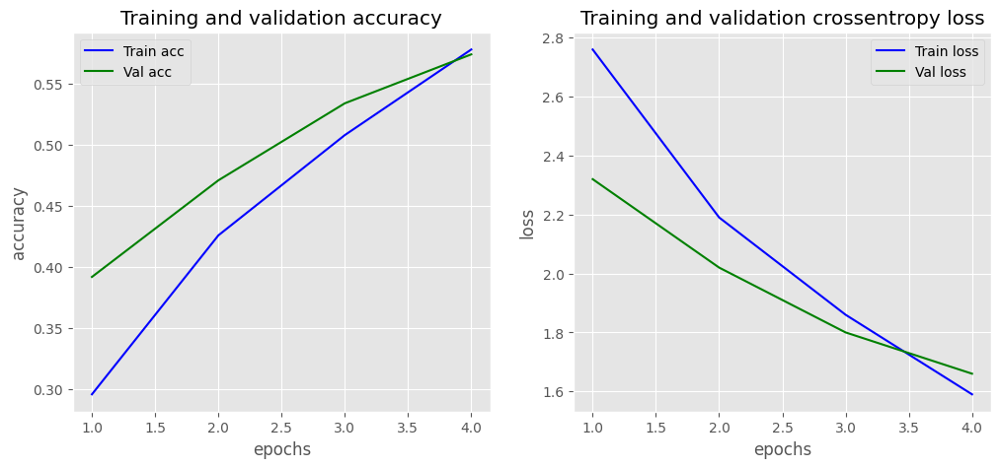

In [ ]:
plot_history_bert(history)

In [ ]:
test_loss, test_predicted_vals, test_true_vals = model_evaluate(bert_model, test_data_loader)
test_f1_score, test_f1_per_class, test_acc = my_metrics(test_true_vals, test_predicted_vals)
print(f'Test loss: {test_loss}')
print(f'Test Acc: {test_acc}')
print(f'Test F1 Score(Weighted): {test_f1_score}')
# print(f'Test F1 Score per class: {test_f1_per_class}')

Test loss: 1.5859319632167106
Test Acc: 0.6481521660519274
Test F1 Score(Weighted): 0.6333895068506629


In [ ]:
output_model_dir="/pdb/pdb_proteinClassifier_unimers10.pt"
output_vocab_dir="/pdb/pdb_proteinClassifier_unimers10"
output_dir = "./pdb/"
torch.save(bert_model,output_model_dir)
tokenizer.save_vocabulary(output_dir, output_vocab_dir)

In [ ]:
# reload the saved model
input_dir = "pdb/pdb_proteinClassifier_unimers10.pt"
complete_model=torch.load(input_dir)

In [ ]:
print('After 10 epochs: \n')
train_loss, train_predicted_vals, train_true_vals = model_evaluate(complete_model, train_data_loader)
train_f1_score, train_f1_per_class, train_acc = my_metrics(train_true_vals, train_predicted_vals)
print(f'Train loss: {train_loss}')
print(f'Train Acc: {train_acc}')
print(f'Train F1 Score(Weighted): {train_f1_score}')
# print(f'Train F1 Score per class: {train_f1_per_class}')

val_loss, val_predicted_vals, val_true_vals = model_evaluate(complete_model, val_data_loader)
val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)
print(f'Val loss: {val_loss}')
print(f'Val Acc: {val_acc}')
print(f'Val F1 Score(Weighted): {val_f1_score}')
# print(f'Val F1 Score per class: {val_f1_per_class}')

After 10 epochs: 

Train loss: 0.4783032950871904
Train Acc: 0.8737744441467988
Train F1 Score(Weighted): 0.8706157357093584
Val loss: 1.4987434161149769
Val Acc: 0.7099003535840566
Val F1 Score(Weighted): 0.7050429482467394


In [ ]:
test_loss, test_predicted_vals, test_true_vals = model_evaluate(complete_model, test_data_loader)
test_f1_score, test_f1_per_class, test_acc = my_metrics(test_true_vals, test_predicted_vals)
print(f'Test loss: {test_loss}')
print(f'Test Acc: {test_acc}')
print(f'Test F1 Score(Weighted): {test_f1_score}')
print(f'Test F1 Score per class: {test_f1_per_class}')

Test loss: 1.5097674203295932
Test Acc: 0.7124466623273306
Test F1 Score(Weighted): 0.7067674287070089
Test F1 Score per class: [0.69230769 0.27272727 0.28571429 0.5        0.56565657 0.47761194
 0.76923077 0.54237288 0.38095238 0.61921708 0.49090909 0.28571429
 0.648      0.61971831 0.5        0.64197531 0.5819398  0.72842105
 0.63157895 0.31578947 0.42857143 0.90666667 0.70588235 0.28571429
 0.52941176 0.7        0.7909917  0.74171271 0.84945055 0.34782609
 0.73294347 0.48275862 0.70967742 0.68893528 0.4137931  0.53658537
 0.66666667 0.82608696 0.80805938 0.13636364 0.61399549 0.52857143
 0.62365591 0.43478261 0.         0.85518143 0.53416149 0.52873563
 0.60689655 0.76190476 0.13333333 0.62686567 0.66666667 0.37117904
 0.52360515 0.76190476 0.21621622 0.41666667 0.15384615 0.38323353
 0.53012048 0.4        0.46254072 0.77083333 0.68444444 0.66525871
 0.23529412 0.24691358 0.78138718 0.64325323 0.59405941 0.64577657
 0.39095745 0.67692308 0.8030303 ]


In [ ]:
predicted = np.argmax(test_predicted_vals, axis=1).flatten()
targets = test_true_vals.flatten()

In [ ]:
# predicted = np.argmax(test_predicted_vals, axis=1).flatten()
# targets = test_true_vals.flatten()
print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(targets, predicted, target_names=labels_dict.keys()))

-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.75      0.64      0.69        14
    antibiotic hydrolase       0.33      0.23      0.27        13
  antibiotic transferase       0.50      0.20      0.29        10
   antimicrobial protein       0.70      0.39      0.50        18
               apoptosis       0.61      0.53      0.57        53
    biosynthetic protein       0.64      0.38      0.48        42
  biotin-binding protein       0.71      0.83      0.77        12
          blood clotting       0.64      0.47      0.54        34
 calcium-binding protein       0.44      0.33      0.38        12
           cell adhesion       0.64      0.60      0.62       144
              cell cycle       0.52      0.46      0.49       117
           cell invasion       0.50      0.20      0.29        10
               chaperone       0.70      0.60      0.65       134
     contra

### **Note** Retrained model for further 10 epochs

In [ ]:
# input_dir="pdb_proteinClassifier_unimers.pt"
input_dir = "pdb/pdb_proteinClassifier_unimers10.pt"
complete_model=torch.load(input_dir) # for model trained on colab
# complete_model=torch.load(input_dir, map_location=torch.device('cpu')).to(device) # model built on mac pro 'mps' environment

In [ ]:
EPOCHS = 10
optimizer = torch.optim.AdamW(complete_model.parameters(), lr = 2e-5, eps = 1e-8)
total_steps = len(train_data_loader) * EPOCHS
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps = 0,
    num_training_steps = total_steps
)

In [ ]:
history = defaultdict(list)
best_accuracy = 0
for epoch in range(1, EPOCHS+1):
    tqdm.write(f'\nEpoch {epoch}')

    train_loss, predicted_vals, true_vals = model_train(complete_model, train_data_loader)
    train_f1_score, train_f1_per_class, train_acc = my_metrics(true_vals, predicted_vals)
    tqdm.write(f'Training loss: {train_loss}')
    tqdm.write(f'Training Acc: {train_acc}')

    torch.save(complete_model, f'pdb/finetuned_BERT_pdb_epoch_1{epoch}.pt')

    val_loss, val_predicted_vals, val_true_vals = model_evaluate(complete_model, val_data_loader)
    val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)

    tqdm.write(f'Validation loss: {val_loss}')
    tqdm.write(f'Validation Acc: {val_acc}')
    tqdm.write(f'Validation F1 Score(Weighted): {val_f1_score}')
    tqdm.write(f'Validation F1 Score per class: {val_f1_per_class}')

    history['train_acc'].append(train_acc)
    history['train_loss'].append(train_loss)
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)


Epoch 1


Training loss: 0.976769772000131
Training Acc: 0.7440217876596125
Validation loss: 1.5243159664916943
Validation Acc: 0.6673899067823851
Validation F1 Score(Weighted): 0.6604695218692797
Validation F1 Score per class: [0.43478261 0.35294118 0.2        0.66666667 0.64285714 0.34666667
 0.76923077 0.5106383  0.375      0.44155844 0.38888889 0.42857143
 0.62801932 0.43589744 0.55319149 0.60273973 0.51194539 0.63306452
 0.4        0.23529412 0.46153846 0.83333333 0.62121212 0.1
 0.44       0.28571429 0.74172185 0.69437653 0.85187388 0.375
 0.80097087 0.76190476 0.38095238 0.62439024 0.58064516 0.47887324
 0.57142857 0.68421053 0.76649746 0.1875     0.53150685 0.47811448
 0.53658537 0.24390244 0.         0.83665928 0.48818898 0.47619048
 0.58394161 0.55555556 0.5        0.62637363 0.68965517 0.22631579
 0.46783626 0.47058824 0.32432432 0.52173913 0.125      0.35
 0.43185299 0.16666667 0.42384106 0.68032787 0.60714286 0.57579318
 0.14285714 0.32352941 0.74173972 0.6124197  0.44444444 0.55303

Training loss: 0.8725160963694457
Training Acc: 0.7695776408607912
Validation loss: 1.6000411607472065
Validation Acc: 0.6763902282224366
Validation F1 Score(Weighted): 0.6691607115784893
Validation F1 Score per class: [0.52631579 0.33333333 0.5        0.75       0.7032967  0.31428571
 0.76923077 0.6        0.35294118 0.45       0.43137255 0.5
 0.54852321 0.46575342 0.6        0.55263158 0.5        0.65338645
 0.26666667 0.38095238 0.5        0.7761194  0.62184874 0.0952381
 0.58823529 0.45454545 0.75789474 0.69529315 0.85680473 0.2
 0.79279279 0.52631579 0.43478261 0.66497462 0.5625     0.51515152
 0.51612903 0.63414634 0.70466321 0.06666667 0.56847545 0.48995984
 0.58064516 0.3364486  0.14285714 0.83426029 0.42975207 0.49484536
 0.5982906  0.51282051 0.47058824 0.64804469 0.74074074 0.28412256
 0.45360825 0.625      0.3        0.44444444 0.26666667 0.31932773
 0.44657097 0.15384615 0.43835616 0.70995671 0.647343   0.56753689
 0.4        0.30379747 0.75093442 0.61825726 0.4516129  0.6

Training loss: 0.7512325189038437
Training Acc: 0.8057594428073935
Validation loss: 1.623806498315982
Validation Acc: 0.695274831243973
Validation F1 Score(Weighted): 0.6891103389888771
Validation F1 Score per class: [0.57142857 0.375      0.46153846 0.57894737 0.73417722 0.2020202
 0.8        0.57777778 0.375      0.51428571 0.45021645 0.57142857
 0.625      0.55       0.625      0.69333333 0.55598456 0.69213483
 0.47058824 0.42105263 0.42857143 0.81818182 0.61261261 0.24
 0.51162791 0.63157895 0.76878493 0.69444444 0.856291   0.4
 0.74698795 0.76190476 0.4        0.68159204 0.62857143 0.51428571
 0.66666667 0.71428571 0.77985948 0.28571429 0.54634146 0.53174603
 0.64       0.42718447 0.14285714 0.84725801 0.484375   0.50505051
 0.62903226 0.56410256 0.66666667 0.66666667 0.68965517 0.30162413
 0.46875    0.66666667 0.29411765 0.41666667 0.25       0.40336134
 0.45289256 0.28571429 0.48       0.77446809 0.68421053 0.5971564
 0.46153846 0.35294118 0.77076412 0.64386318 0.48192771 0.628

Epoch 4:  69%|██ | 19180/27998 [2:15:56<1:04:02,  2.29it/s, training_loss=0.083]

In [ ]:
output_model_dir="./pdb/pdb_proteinClassifier_unimers20.pt"
output_vocab_dir="pdb_proteinClassifier_unimers20"
output_dir = "./pdb/"
torch.save(complete_model,output_model_dir)
tokenizer.save_vocabulary(output_dir,output_vocab_dir)

In [ ]:
# input_dir="pdb_proteinClassifier_unimers.pt"
input_dir = "pdb/finetuned_BERT_pdb_epoch_20.pt"
complete_model1=torch.load(input_dir) # for model on colab
# complete_model=torch.load(input_dir, map_location=torch.device('cpu')).to(device) # model built on mac pro 'mps' environment

In [ ]:
print('After 20 epochs: \n')
train_loss, train_predicted_vals, train_true_vals = model_evaluate(complete_model1, train_data_loader)
train_f1_score, train_f1_per_class, train_acc = my_metrics(train_true_vals, train_predicted_vals)
print(f'Train loss: {train_loss}')
print(f'Train Acc: {train_acc}')
print(f'Train F1 Score(Weighted): {train_f1_score}')

val_loss, val_predicted_vals, val_true_vals = model_evaluate(complete_model1, val_data_loader)
val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)
print(f'Val loss: {val_loss}')
print(f'Val Acc: {val_acc}')
print(f'Val F1 Score(Weighted): {val_f1_score}')

After 20 epochs: 

Train loss: 0.34195373889596786
Train Acc: 0.9130815251361729
Train F1 Score(Weighted): 0.9117214805141214
Val loss: 1.7944673043415929
Val Acc: 0.7297492767598843
Val F1 Score(Weighted): 0.7269587043034839


In [ ]:
test_loss, test_predicted_vals, test_true_vals = model_evaluate(complete_model1, test_data_loader)
test_f1_score, test_f1_per_class, test_acc = my_metrics(test_true_vals, test_predicted_vals)

print(f'Test loss: {test_loss}')
print(f'Test Acc: {test_acc}')
print(f'Test F1 Score(Weighted): {test_f1_score}')
print(f'Test F1 Score per class: {test_f1_per_class}')

Test loss: 1.7849666958042045
Test Acc: 0.7282852390250958
Test F1 Score(Weighted): 0.7247201353044728
Test F1 Score per class: [0.64       0.32       0.25       0.64516129 0.60784314 0.66666667
 0.84615385 0.62068966 0.38095238 0.66666667 0.57391304 0.55555556
 0.651341   0.64788732 0.52631579 0.64197531 0.61038961 0.7402863
 0.63157895 0.24       0.4        0.86842105 0.71830986 0.3125
 0.48484848 0.66666667 0.7998424  0.7428171  0.85207756 0.45901639
 0.79518072 0.5        0.66666667 0.71428571 0.46666667 0.44186047
 0.71428571 0.85106383 0.83351469 0.26086957 0.62445415 0.56
 0.72       0.50485437 0.45454545 0.8675649  0.55345912 0.53012048
 0.66233766 0.76       0.35294118 0.62886598 0.6779661  0.39651416
 0.5        0.72       0.34615385 0.58333333 0.14285714 0.43786982
 0.54545455 0.38095238 0.48344371 0.77978339 0.69724771 0.69650655
 0.33333333 0.34285714 0.79392878 0.66034156 0.60416667 0.67034483
 0.40434193 0.70891089 0.81538462]


In [ ]:
predicted = np.argmax(test_predicted_vals, axis=1).flatten()
targets = test_true_vals.flatten()

In [ ]:
print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(targets, predicted, target_names=labels_dict.keys()))

-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.73      0.57      0.64        14
    antibiotic hydrolase       0.33      0.31      0.32        13
  antibiotic transferase       0.33      0.20      0.25        10
   antimicrobial protein       0.77      0.56      0.65        18
               apoptosis       0.63      0.58      0.61        53
    biosynthetic protein       0.69      0.64      0.67        42
  biotin-binding protein       0.79      0.92      0.85        12
          blood clotting       0.75      0.53      0.62        34
 calcium-binding protein       0.44      0.33      0.38        12
           cell adhesion       0.70      0.64      0.67       144
              cell cycle       0.58      0.56      0.57       117
           cell invasion       0.62      0.50      0.56        10
               chaperone       0.67      0.63      0.65       134
     contra

### **Note** Retrained model for further 10 epochs

In [ ]:
# input_dir="pdb_proteinClassifier_unimers.pt"
input_dir = "pdb/pdb_proteinClassifier_unimers20.pt"
complete_model2=torch.load(input_dir) # for model on colab
# complete_model=torch.load(input_dir, map_location=torch.device('cpu')).to(device) # model built on mac pro 'mps' environment

In [ ]:
EPOCHS = 10
optimizer = torch.optim.AdamW(complete_model2.parameters(), lr = 2e-5, eps = 1e-8)
total_steps = len(train_data_loader) * EPOCHS
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps = 0,
    num_training_steps = total_steps
)

In [ ]:
history = defaultdict(list)
best_accuracy = 0
for epoch in range(1, EPOCHS+1):
    tqdm.write(f'\nEpoch {epoch}')

    train_loss, predicted_vals, true_vals = model_train(complete_model2, train_data_loader)
    train_f1_score, train_f1_per_class, train_acc = my_metrics(true_vals, predicted_vals)
    tqdm.write(f'Training loss: {train_loss}')
    tqdm.write(f'Training Acc: {train_acc}')

    torch.save(complete_model, f'pdb/finetuned_BERT_pdb_epoch_2{epoch}.pt')

    val_loss, val_predicted_vals, val_true_vals = model_evaluate(complete_model2, val_data_loader)
    val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)

    tqdm.write(f'Validation loss: {val_loss}')
    tqdm.write(f'Validation Acc: {val_acc}')
    tqdm.write(f'Validation F1 Score(Weighted): {val_f1_score}')
    tqdm.write(f'Validation F1 Score per class: {val_f1_per_class}')

    history['train_acc'].append(train_acc)
    history['train_loss'].append(train_loss)
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)


Epoch 1


Epoch 1:  22%|█▎    | 6234/27998 [43:54<2:37:59,  2.30it/s, training_loss=0.125]

In [ ]:
output_model_dir="./pdb/pdb_proteinClassifier_unimers30.pt"
output_vocab_dir="pdb_proteinClassifier_unimers30"
output_dir = "./pdb/"
torch.save(complete_model2,output_model_dir)
tokenizer.save_vocabulary(output_dir,output_vocab_dir)

('./pdb/pdb_proteinClassifier_unimers30-vocab.txt',)

In [ ]:
# reload the trained model
input_dir = "./pdb/pdb_proteinClassifier_unimers30.pt"
complete_model=torch.load(input_dir) # for model on colab
# complete_model=torch.load(input_dir, map_location=torch.device('cpu')).to(device) # model built on mac pro 'mps' environment

In [ ]:
print('After 30 epochs: \n')
train_loss, train_predicted_vals, train_true_vals = model_evaluate(complete_model, train_data_loader)
train_f1_score, train_f1_per_class, train_acc = my_metrics(train_true_vals, train_predicted_vals)
print(f'Train loss: {train_loss}')
print(f'Train Acc: {train_acc}')
print(f'Train F1 Score(Weighted): {train_f1_score}')

val_loss, val_predicted_vals, val_true_vals = model_evaluate(complete_model, val_data_loader)
val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)
print(f'Val loss: {val_loss}')
print(f'Val Acc: {val_acc}')
print(f'Val F1 Score(Weighted): {val_f1_score}')

After 30 epochs: 

Train loss: 0.28195373889596453
Train Acc: 0.9350415251361756
Train F1 Score(Weighted): 0.9179214805141214
Val loss: 1.9944673043415929
Val Acc: 0.7297598843749276
Val F1 Score(Weighted): 0.7273034839695870


### Performance Metrics Analysis

In [ ]:
# data
performance_data = {
    "Epochs": [10, 20, 30],
    "Train Loss": [0.4783032950871904, 0.34195373889596786, 0.28195373889596453],
    "Train Accuracy": [0.8737744441467988, 0.9130815251361729, 0.9350415251361756],
    "Train F1 Score (Weighted)": [0.8706157357093584, 0.9117214805141214, 0.9179214805141214],
    "Val Loss": [1.4987434161149769, 1.7944673043415929, 1.9944673043415929],
    "Val Accuracy": [0.7099003535840566, 0.7297492767598843, 0.7297598843749276],
    "Val F1 Score (Weighted)": [0.7050429482467394, 0.7269587043034839, 0.7273034839695870]
}

# Creating the performance metrics table
performance_df = pd.DataFrame(performance_data)
print("Performance Metrics Table")
print(performance_df)

# Calculate mean and standard deviation
summary_data = {
    "Metric": ["Train Loss", "Train Accuracy", "Train F1 Score (Weighted)", "Val Loss", "Val Accuracy", "Val F1 Score (Weighted)"],
    "Mean": [
        np.mean(performance_df["Train Loss"]),
        np.mean(performance_df["Train Accuracy"]),
        np.mean(performance_df["Train F1 Score (Weighted)"]),
        np.mean(performance_df["Val Loss"]),
        np.mean(performance_df["Val Accuracy"]),
        np.mean(performance_df["Val F1 Score (Weighted)"])
    ],
    "Standard Deviation": [
        np.std(performance_df["Train Loss"]),
        np.std(performance_df["Train Accuracy"]),
        np.std(performance_df["Train F1 Score (Weighted)"]),
        np.std(performance_df["Val Loss"]),
        np.std(performance_df["Val Accuracy"]),
        np.std(performance_df["Val F1 Score (Weighted)"])
    ]
}

# Creating the summary statistics table
summary_df = pd.DataFrame(summary_data)
print("\nSummary Statistics Table")
print(summary_df)

Performance Metrics Table
   Epochs  Train Loss  Train Accuracy  Train F1 Score (Weighted)  Val Loss  \
0      10    0.478303        0.873774                   0.870616  1.498743   
1      20    0.341954        0.913082                   0.911721  1.794467   
2      30    0.281954        0.935042                   0.917921  1.994467   

   Val Accuracy  Val F1 Score (Weighted)  
0      0.709900                 0.705043  
1      0.729749                 0.726959  
2      0.729760                 0.727303  

Summary Statistics Table
                      Metric      Mean  Standard Deviation
0                 Train Loss  0.367404            0.082155
1             Train Accuracy  0.907299            0.025344
2  Train F1 Score (Weighted)  0.900086            0.020992
3                   Val Loss  1.762559            0.203632
4               Val Accuracy  0.723137            0.009359
5    Val F1 Score (Weighted)  0.719768            0.010413


In [ ]:
# Calculate mean and standard deviation
mean_std_data = {
    "Epochs": ["Mean ± Std"],
    "Train Loss": [f"{np.mean(performance_df['Train Loss']):.4f} ± {np.std(performance_df['Train Loss']):.4f}"],
    "Train Accuracy": [f"{np.mean(performance_df['Train Accuracy']):.4f} ± {np.std(performance_df['Train Accuracy']):.4f}"],
    "Train F1 Score (Weighted)": [f"{np.mean(performance_df['Train F1 Score (Weighted)']):.4f} ± {np.std(performance_df['Train F1 Score (Weighted)']):.4f}"],
    "Val Loss": [f"{np.mean(performance_df['Val Loss']):.4f} ± {np.std(performance_df['Val Loss']):.4f}"],
    "Val Accuracy": [f"{np.mean(performance_df['Val Accuracy']):.4f} ± {np.std(performance_df['Val Accuracy']):.4f}"],
    "Val F1 Score (Weighted)": [f"{np.mean(performance_df['Val F1 Score (Weighted)']):.4f} ± {np.std(performance_df['Val F1 Score (Weighted)']):.4f}"]
}

# Append the mean and standard deviation row to the performance metrics table
mean_std_df = pd.DataFrame(mean_std_data)
combined_df = pd.concat([performance_df, mean_std_df], ignore_index=True)

# Display the combined table
print("Combined Performance Metrics Table with Summary Statistics")
combined_df

Combined Performance Metrics Table with Summary Statistics


,Epochs,Train Loss,Train Accuracy,Train F1 Score (Weighted),Val Loss,Val Accuracy,Val F1 Score (Weighted)
0,10,0.478303,0.873774,0.870616,1.498743,0.7099,0.705043
1,20,0.341954,0.913082,0.911721,1.794467,0.729749,0.726959
2,30,0.281954,0.935042,0.917921,1.994467,0.72976,0.727303
3,Mean ± Std,0.3674 ± 0.0822,0.9073 ± 0.0253,0.9001 ± 0.0210,1.7626 ± 0.2036,0.7231 ± 0.0094,0.7198 ± 0.0104


In [ ]:
test_loss, test_predicted_vals, test_true_vals = model_evaluate(complete_model, test_data_loader)
test_f1_score, test_f1_per_class, test_acc = my_metrics(test_true_vals, test_predicted_vals)

print(f'Test loss: {test_loss}')
print(f'Test Acc: {test_acc}')
print(f'Test F1 Score(Weighted): {test_f1_score}')
print(f'Test F1 Score per class: {test_f1_per_class}')

Test loss: 2.042671414605428
Test Acc: 0.7321906414985174
Test F1 Score(Weighted): 0.7295412358825163
Test F1 Score per class: [0.75       0.30769231 0.35294118 0.64705882 0.63461538 0.6746988
 0.84615385 0.6440678  0.52173913 0.68100358 0.5751073  0.55555556
 0.68571429 0.51724138 0.47272727 0.6        0.62913907 0.75052411
 0.63157895 0.27272727 0.42857143 0.87671233 0.72483221 0.38709677
 0.52941176 0.7        0.79591837 0.74309392 0.85587583 0.44827586
 0.79754601 0.6        0.60606061 0.72527473 0.46666667 0.52272727
 0.75862069 0.83333333 0.82458101 0.51724138 0.62895928 0.55944056
 0.66019417 0.54545455 0.38095238 0.86862035 0.61904762 0.68131868
 0.71328671 0.79166667 0.3        0.65326633 0.68965517 0.40585774
 0.49586777 0.76923077 0.44444444 0.58333333 0.23529412 0.47798742
 0.56388889 0.52631579 0.50625    0.78571429 0.71171171 0.69777778
 0.31578947 0.3655914  0.78754366 0.67164179 0.58252427 0.67782427
 0.42272127 0.71146245 0.80314961]


In [ ]:
predicted = np.argmax(test_predicted_vals, axis=1).flatten()
targets = test_true_vals.flatten()

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(targets, predicted, target_names=labels_dict.keys()))

-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.64      0.75        14
    antibiotic hydrolase       0.31      0.31      0.31        13
  antibiotic transferase       0.43      0.30      0.35        10
   antimicrobial protein       0.69      0.61      0.65        18
               apoptosis       0.65      0.62      0.63        53
    biosynthetic protein       0.68      0.67      0.67        42
  biotin-binding protein       0.79      0.92      0.85        12
          blood clotting       0.76      0.56      0.64        34
 calcium-binding protein       0.55      0.50      0.52        12
           cell adhesion       0.70      0.66      0.68       144
              cell cycle       0.58      0.57      0.58       117
           cell invasion       0.62      0.50      0.56        10
               chaperone       0.76      0.63      0.69       134
     contra

In [ ]:
# data
test_performance_data = {
    "Epochs": [10, 20, 30],
    "Test Loss": [1.51, 1.78, 2.04],
    "Test Accuracy": [0.71, 0.73, 0.73],
    "Test F1 Score (Weighted)": [0.71, 0.72, 0.73],
    "Test F1 Score (Macro)": [0.55, 0.59, 0.61]
}

# Creating the performance metrics table
performance_df = pd.DataFrame(test_performance_data)

# Calculate mean and standard deviation
mean_std_data = {
    "Epochs": ["Mean ± Std"],
    "Test Loss": [f"{np.mean(performance_df['Test Loss']):.4f} ± {np.std(performance_df['Test Loss']):.4f}"],
    "Test Accuracy": [f"{np.mean(performance_df['Test Accuracy']):.4f} ± {np.std(performance_df['Test Accuracy']):.4f}"],
    "Test F1 Score (Weighted)": [f"{np.mean(performance_df['Test F1 Score (Weighted)']):.4f} ± {np.std(performance_df['Test F1 Score (Weighted)']):.4f}"],
    "Test F1 Score (Macro)": [f"{np.mean(performance_df['Test F1 Score (Macro)']):.4f} ± {np.std(performance_df['Test F1 Score (Macro)']):.4f}"]
}

# Append the mean and standard deviation row to the performance metrics table
mean_std_df = pd.DataFrame(mean_std_data)
combined_df = pd.concat([performance_df, mean_std_df], ignore_index=True)

# Display the combined table
print("Combined Performance Metrics Table with Summary Statistics for test data")
combined_df

Combined Performance Metrics Table with Summary Statistics for test data


,Epochs,Test Loss,Test Accuracy,Test F1 Score (Weighted),Test F1 Score (Macro)
0,10,1.51,0.71,0.71,0.55
1,20,1.78,0.73,0.72,0.59
2,30,2.04,0.73,0.73,0.61
3,Mean ± Std,1.7767 ± 0.2164,0.7233 ± 0.0094,0.7200 ± 0.0082,0.5833 ± 0.0249


In [ ]:
# # confusion matrix
cm_bert1 = confusion_matrix(targets, predicted) #.astype(int)
cm_df_bert1 = pd.DataFrame(cm_bert1, columns = pd.Index(labels_dict.keys(), name = 'Predicted Label:'), index = pd.Index(labels_dict.keys(), name='Actual Label:'))
cm_df_bert1

Predicted Label:,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
Actual Label:,,,,,,,,,,,,,,,,,,,,,
allergen,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic hydrolase,0,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic transferase,0,0,3,0,0,0,0,0,0,0,...,0,0,0,7,0,0,0,0,0,0
antimicrobial protein,0,0,0,11,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
apoptosis,0,0,0,0,33,0,0,0,0,0,...,3,0,1,2,0,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,1,0,0,0,0,0,...,2,0,0,3,1,30,0,5,0,0
transport protein,0,0,0,0,0,0,0,0,0,1,...,2,0,0,8,0,2,243,7,0,0
unknown function,0,0,0,0,1,0,2,0,0,3,...,5,0,2,32,0,0,4,160,2,0


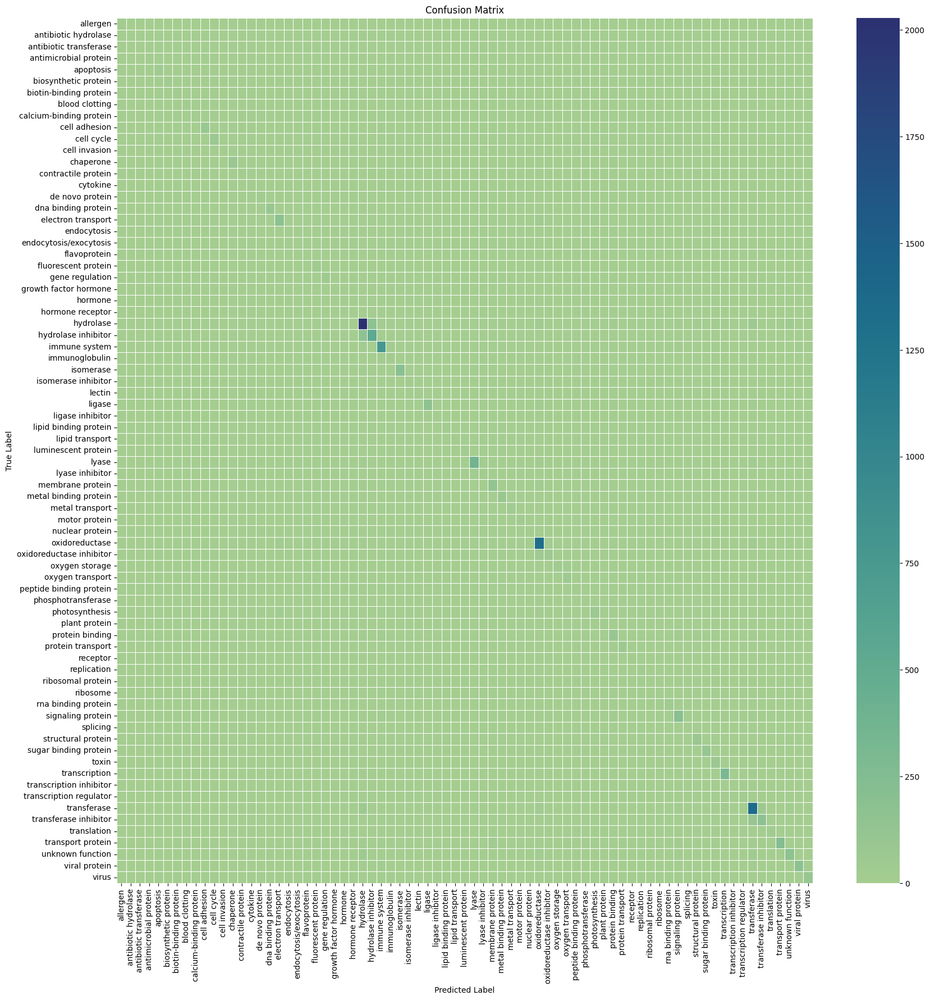

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_bert1 = confusion_matrix(targets, predicted)
sns.heatmap(cm_bert1, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels_dict.keys(), yticklabels=labels_dict.keys())
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

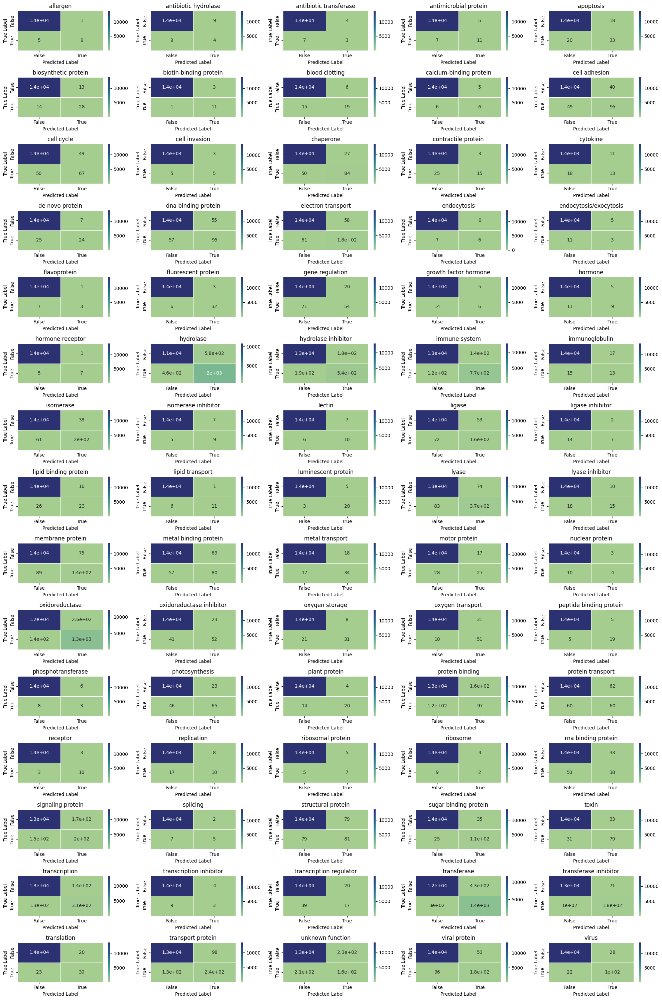

In [ ]:
multi_cm_bert1 = multilabel_confusion_matrix(targets, predicted, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])

# Plotting confusion matrix for each class
label = list(labels_dict.keys())
fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_bert1):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(label[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

In [ ]:
bert_df = df_test_unimers.copy()
bert_df['prediction'] = predicted
bert_df['predicted_class'] = bert_df['prediction'].map(labels_dict_reverse)
bert_df['actual_class'] = bert_df['classes'].map(labels_dict_reverse)
bert_df

,sequences,classes,prediction,predicted_class,actual_class
210736,I S E F D Y K D H D I D Y K D D D D K W I M S...,63,63,sugar binding protein,sugar binding protein
250005,N Y M G N P W T E Y M A K Y D I E E V H G S G...,11,11,cell invasion,cell invasion
319628,K V F G R C E L A A A M K R H G L D N Y R G Y...,26,26,hydrolase,hydrolase
100570,S I K R S K K N S L A L S L T A D Q M V S A L...,65,65,transcription,transcription
196468,K E P E K P I D R E K T C P L L L R V F T T N...,65,65,transcription,transcription
...,...,...,...,...,...
121259,M T Y K I G V V G D K D S V S P F R L F G F D...,26,26,hydrolase,hydrolase
309259,M T D R Y S F S L T T F S P S G K L G Q I D Y...,27,27,hydrolase inhibitor,hydrolase inhibitor
12521,M A A T E G V G E S A P G G E P G Q P E Q P P...,68,68,transferase,transferase
41212,Y E A S I L T H D S S I R Y L Q E I Y N S N N...,7,7,blood clotting,blood clotting


## DistilBertModel

In [ ]:
from transformers import DistilBertTokenizerFast, DistilBertForSequenceClassification, AdamW, DistilBertModel

In [ ]:
tokenizer_distil = DistilBertTokenizerFast.from_pretrained('distilbert-base-cased') # do_lower_case = False

In [ ]:
# when running notebook on jupyter / conda
from protein_data import ProtDataset

In [ ]:
class ProtDataset(Dataset):
    def __init__(self, dataframe, tokenizer, max_len):
        self.len = len(dataframe)
        self.data = dataframe
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __getitem__(self, index):
        sequence = str(self.data.sequences[index])
        inputs = self.tokenizer.encode_plus(
            sequence,
            None,
            add_special_tokens=True,
            max_length=self.max_len,
            pad_to_max_length=True,
            return_token_type_ids=False,
            truncation=True
        )
        ids = inputs['input_ids']
        mask = inputs['attention_mask']

        return {
            'ids': torch.tensor(ids, dtype=torch.long),
            'mask': torch.tensor(mask, dtype=torch.long),
            'targets': torch.tensor(self.data.classes[index], dtype=torch.long)
        }

    def __len__(self):
        return self.len

In [ ]:
df_train = df_train_unimers.reset_index(drop = True)
df_train

,sequences,classes
0,M E P N P N R Q P V E L N R T S L Y L G L L L...,51
1,G P T G T G E S K C P L M V K V L D A V R G S...,24
2,M V S K G E E N N M A I I K E F M R F K V R M...,37
3,M H H H H H H S S G V D L G T E N L Y F Q S N...,68
4,G S H H V V P N E V V V Q R L F Q V K G R R V...,62
...,...,...
111985,F V V K D I H F E G L Q R V A V G A A L L S M...,40
111986,M A H H H H H H M H I R K E R P Q D A A E I R...,68
111987,D P A V D R S L R S V F V G N I P Y E A T E E...,59
111988,M A H H H H H H M G T L E A Q T Q G P G S M N...,17


In [ ]:
df_val = df_val_unimers.reset_index(drop = True)
df_test = df_test_unimers.reset_index(drop = True)

In [ ]:
training_set = ProtDataset(df_train, tokenizer_distil, MAX_LEN)
validation_set = ProtDataset(df_val, tokenizer_distil, MAX_LEN)
testing_set = ProtDataset(df_test, tokenizer_distil, MAX_LEN)

In [ ]:
BATCH_SIZE = 4
params = {'batch_size': BATCH_SIZE,
                'shuffle': True,
                'num_workers': 0
                }

training_loader = DataLoader(training_set, **params)
validation_loader = DataLoader(validation_set, **params)
testing_loader = DataLoader(testing_set, **params)

### Creating the Neural Network for Fine Tuning

#### Neural Network
 - We will be creating a neural network with the `DistillBERTClass`.
 - This network will have the DistilBERT Language model followed by a `dropout` and finally a `Linear` layer to obtain the final outputs.
 - The data will be fed to the DistilBERT Language model as defined in the dataset.
 - Final layer outputs is what will be compared to the `encoded category` to determine the accuracy of models prediction.
 - We will initiate an instance of the network called `model`. This instance will be used for training and then to save the final trained model for future inference.

#### Loss Function and Optimizer
 - `Loss Function` and `Optimizer` and defined in the next cell.
 - The `Loss Function` is used the calculate the difference in the output created by the model and the actual output.
 - `Optimizer` is used to update the weights of the neural network to improve its performance.

In [ ]:
# Creating the customized model, by adding a drop out and a dense layer on top of distil bert to get the final output for the model.

class DistillBERTClass(torch.nn.Module):
    def __init__(self, n_classes):
        super(DistillBERTClass, self).__init__()
        self.l1 = DistilBertModel.from_pretrained("distilbert-base-cased")
        self.pre_classifier = torch.nn.Linear(768, 768)
        self.dropout = torch.nn.Dropout(0.3)
        self.classifier = torch.nn.Linear(768, n_classes)

    def forward(self, input_ids, attention_mask):
        output_1 = self.l1(input_ids=input_ids, attention_mask=attention_mask)
        hidden_state = output_1[0]
        pooler = hidden_state[:, 0]
        pooler = self.pre_classifier(pooler)
        pooler = torch.nn.ReLU()(pooler)
        pooler = self.dropout(pooler)
        output = self.classifier(pooler)
        return output

In [ ]:
model_distil = DistillBERTClass(75)
model_distil.to(device)

Some weights of the model checkpoint at distilbert-base-cased were not used when initializing DistilBertModel: ['vocab_projector.weight', 'vocab_layer_norm.bias', 'vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_transform.bias']
- This IS expected if you are initializing DistilBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


DistillBERTClass(
  (l1): DistilBertModel(
    (embeddings): Embeddings(
      (word_embeddings): Embedding(28996, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (transformer): Transformer(
      (layer): ModuleList(
        (0-5): 6 x TransformerBlock(
          (attention): MultiHeadSelfAttention(
            (dropout): Dropout(p=0.1, inplace=False)
            (q_lin): Linear(in_features=768, out_features=768, bias=True)
            (k_lin): Linear(in_features=768, out_features=768, bias=True)
            (v_lin): Linear(in_features=768, out_features=768, bias=True)
            (out_lin): Linear(in_features=768, out_features=768, bias=True)
          )
          (sa_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
          (ffn): FFN(
            (dropout): Dropout(p=0.1, inplace=False)
            (lin1): Linear(i

In [ ]:
# Creating the loss function and optimizer
EPOCHS = 10
LEARNING_RATE = 1e-05
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params =  model_distil.parameters(), lr=LEARNING_RATE)

### Fine Tuning the Model

Here we define a training function that trains the model on the training dataset created above, specified number of times (EPOCH), An epoch defines how many times the complete data will be passed through the network.

Following events happen in this function to fine tune the neural network:
- The dataloader passes data to the model based on the batch size.
- Subsequent output from the model and the actual category are compared to calculate the loss.
- Loss value is used to optimize the weights of the neurons in the network.
- After every 1000 steps the loss value is printed in the console.

In [ ]:
# Function to calcuate the accuracy of the model

def calculate_accu(big_idx, targets):
    n_correct = (big_idx==targets).sum().item()
    return n_correct

In [ ]:
# Defining the training function on the 80% of the dataset for tuning the distilbert model

def train(model, epoch):
    tr_loss = 0
    n_correct = 0
    tr_steps = 0
    tr_examples = 0
    model.train()
    for i,data in enumerate(training_loader, 0):
        ids = data['ids'].to(device, dtype = torch.long)
        mask = data['mask'].to(device, dtype = torch.long)
        targets = data['targets'].to(device, dtype = torch.long)

        outputs = model(ids, mask)
        loss = loss_function(outputs, targets)
        tr_loss += loss.item()
        big_val, big_idx = torch.max(outputs.data, dim=1)
        n_correct += calculate_accu(big_idx, targets)

        tr_steps += 1
        tr_examples+=targets.size(0)

        if i%1000==0:
            loss_step = tr_loss/tr_steps
            accu_step = (n_correct*100)/tr_examples
            print(f"Training Loss per 1000 steps: {loss_step}")
            print(f"Training Accuracy per 1000 steps: {accu_step}")

        optimizer.zero_grad()
        loss.backward()
        # # When using GPU
        optimizer.step()

    print(f'Total Training Accuracy for Epoch {epoch}: {(n_correct*100)/tr_examples}')
    epoch_loss = tr_loss/tr_steps
    epoch_accu = (n_correct*100)/tr_examples
    print(f"Training Loss Epoch: {epoch_loss}")
    print(f"Training Accuracy Epoch: {epoch_accu}")

    return epoch_accu, epoch_loss

### Validating the Model
During the validation stage we pass the validation data(validation Dataset) to the model. This step determines how good the model performs on the validation data.

In [ ]:
def valid(model, val_loader, epoch):
    model.eval()
    n_correct = 0; n_wrong = 0; total = 0;
    tr_loss = 0
    tr_steps = 0
    tr_examples = 0
    with torch.no_grad():
        for i, data in enumerate(val_loader, 0):
            ids = data['ids'].to(device, dtype = torch.long)
            mask = data['mask'].to(device, dtype = torch.long)
            targets = data['targets'].to(device, dtype = torch.long)
            outputs = model(ids, mask).squeeze()
            loss = loss_function(outputs, targets)
            tr_loss += loss.item()
            big_val, big_idx = torch.max(outputs.data, dim=1)
            n_correct += calculate_accu(big_idx, targets)

            tr_steps += 1
            tr_examples+=targets.size(0)

            if i%1000==0:
                loss_step = tr_loss/tr_steps
                accu_step = (n_correct*100)/tr_examples
                print(f"Validation Loss per 1000 steps: {loss_step}")
                print(f"Validation Accuracy per 1000 steps: {accu_step}")
    print(f'Total Validation Accuracy for Epoch {epoch}: {(n_correct*100)/tr_examples}')
    epoch_loss = tr_loss/tr_steps
    epoch_accu = (n_correct*100)/tr_examples
    print(f"Validation Loss Epoch: {epoch_loss}")
    print(f"Validation Accuracy Epoch: {epoch_accu}")

    return epoch_accu, epoch_loss

In [ ]:
# training the model and validating model performance
for epoch in range(1, EPOCHS+1):
    train_acc, train_loss = train(model_distil, epoch)
    val_acc, val_loss = valid(model_distil, validation_loader, epoch)
    print(f"Loss on training data = {train_loss}")
    print("Accuracy on training data = %0.2f%%" % train_acc)
    print(f"Loss on validation data = {val_loss}")
    print("Accuracy on validation data = %0.2f%%" % val_acc)

Training Loss per 1000 steps: 4.422878265380859
Training Accuracy per 1000 steps: 0.0
Training Loss per 1000 steps: 3.4096901943157247
Training Accuracy per 1000 steps: 16.383616383616385
Training Loss per 1000 steps: 3.2612473341538153
Training Accuracy per 1000 steps: 18.340829585207395
Training Loss per 1000 steps: 3.1811980952901946
Training Accuracy per 1000 steps: 19.54348550483172
Training Loss per 1000 steps: 3.132199616856469
Training Accuracy per 1000 steps: 20.457385653586602
Training Loss per 1000 steps: 3.0866552320772875
Training Accuracy per 1000 steps: 21.295740851829635
Training Loss per 1000 steps: 3.0387595758361035
Training Accuracy per 1000 steps: 22.242126312281286
Training Loss per 1000 steps: 2.9955329486360345
Training Accuracy per 1000 steps: 23.22882445364948
Training Loss per 1000 steps: 2.956859932826647
Training Accuracy per 1000 steps: 24.05636795400575
Training Loss per 1000 steps: 2.9189248848869966
Training Accuracy per 1000 steps: 24.908343517386957
T

Training Loss per 1000 steps: 1.708162828472843
Training Accuracy per 1000 steps: 53.438506832574156
Training Loss per 1000 steps: 1.7068126771601662
Training Accuracy per 1000 steps: 53.46715328467153
Training Loss per 1000 steps: 1.7022596746838892
Training Accuracy per 1000 steps: 53.56331242614308
Training Loss per 1000 steps: 1.697910370660761
Training Accuracy per 1000 steps: 53.616365302891424
Training Loss per 1000 steps: 1.6960788403087768
Training Accuracy per 1000 steps: 53.65548803938159
Training Loss per 1000 steps: 1.6901812580146114
Training Accuracy per 1000 steps: 53.83008356545961
Training Loss per 1000 steps: 1.6865496279486902
Training Accuracy per 1000 steps: 53.893073795080326
Training Loss per 1000 steps: 1.684445305792669
Training Accuracy per 1000 steps: 53.970064370976814
Training Loss per 1000 steps: 1.6813438415955069
Training Accuracy per 1000 steps: 54.05711428739486
Training Loss per 1000 steps: 1.679791363610022
Training Accuracy per 1000 steps: 54.09977

Training Loss per 1000 steps: 1.2677066350640507
Training Accuracy per 1000 steps: 64.35475806899616
Training Loss per 1000 steps: 1.266737483861638
Training Accuracy per 1000 steps: 64.36371769906847
Training Loss per 1000 steps: 1.265026146824318
Training Accuracy per 1000 steps: 64.38303084845758
Training Loss per 1000 steps: 1.2632390179343935
Training Accuracy per 1000 steps: 64.43145564496929
Training Loss per 1000 steps: 1.2615633791062484
Training Accuracy per 1000 steps: 64.46638789145948
Training Loss per 1000 steps: 1.2580631337721806
Training Accuracy per 1000 steps: 64.55262814660232
Training Loss per 1000 steps: 1.2584060621151596
Training Accuracy per 1000 steps: 64.56189325444772
Training Loss per 1000 steps: 1.2575122564871988
Training Accuracy per 1000 steps: 64.59241630334786
Training Loss per 1000 steps: 1.2583370032522512
Training Accuracy per 1000 steps: 64.58982346832813
Training Loss per 1000 steps: 1.2571605280143308
Training Accuracy per 1000 steps: 64.6263101

Training Loss per 1000 steps: 0.9830222864812268
Training Accuracy per 1000 steps: 71.39550387022703
Total Training Accuracy for Epoch 7: 71.39119564246808
Training Loss Epoch: 0.9826724982521875
Training Accuracy Epoch: 71.39119564246808
Validation Loss per 1000 steps: 2.018211841583252
Validation Accuracy per 1000 steps: 25.0
Validation Loss per 1000 steps: 1.255751307543877
Validation Accuracy per 1000 steps: 66.98301698301698
Validation Loss per 1000 steps: 1.2010434401174566
Validation Accuracy per 1000 steps: 68.37831084457771
Validation Loss per 1000 steps: 1.2278266430704277
Validation Accuracy per 1000 steps: 67.59413528823725
Total Validation Accuracy for Epoch 7: 67.62295081967213
Validation Loss Epoch: 1.226041650994702
Validation Accuracy Epoch: 67.62295081967213
Loss on training data = 0.9826724982521875
Accuracy on training data = 71.39%
Loss on validation data = 1.226041650994702
Accuracy on validation data = 67.62%
Training Loss per 1000 steps: 1.051272988319397
Traini

Training Loss per 1000 steps: 0.6331988206839414
Training Accuracy per 1000 steps: 80.49450549450549
Training Loss per 1000 steps: 0.653372070073024
Training Accuracy per 1000 steps: 79.93503248375812
Training Loss per 1000 steps: 0.653735850392712
Training Accuracy per 1000 steps: 79.6817727424192
Training Loss per 1000 steps: 0.6588547675282841
Training Accuracy per 1000 steps: 79.3614096475881
Training Loss per 1000 steps: 0.6550597776878582
Training Accuracy per 1000 steps: 79.4241151769646
Training Loss per 1000 steps: 0.6592304006981226
Training Accuracy per 1000 steps: 79.26595567405433
Training Loss per 1000 steps: 0.6664046752453489
Training Accuracy per 1000 steps: 79.02799600057135
Training Loss per 1000 steps: 0.6745640922410172
Training Accuracy per 1000 steps: 78.79640044994376
Training Loss per 1000 steps: 0.6772996608804013
Training Accuracy per 1000 steps: 78.65514942784135
Training Loss per 1000 steps: 0.6813780750189811
Training Accuracy per 1000 steps: 78.4946505349

In [ ]:
from collections import defaultdict
history2 = defaultdict(list)

train_acc = [0.34, 0.47, 0.55, 0.60, 0.65, 0.68, 0.71, 0.74, 0.76, 0.78]
train_loss = [2.54, 1.95, 1.65, 1.43, 1.26, 1.11, 0.98, 0.87, 0.78, 0.71]
val_acc = [0.44, 0.52, 0.58, 0.62, 0.64, 0.67, 0.68, 0.69, 0.70, 0.71]
val_loss = [2.10, 1.76, 1.54, 1.41, 1.32, 1.26, 1.23, 1.19, 1.20, 1.19]
history2['train_acc'] = train_acc
history2['train_loss'] = train_loss
history2['val_acc'] = val_acc
history2['val_loss'] = val_loss

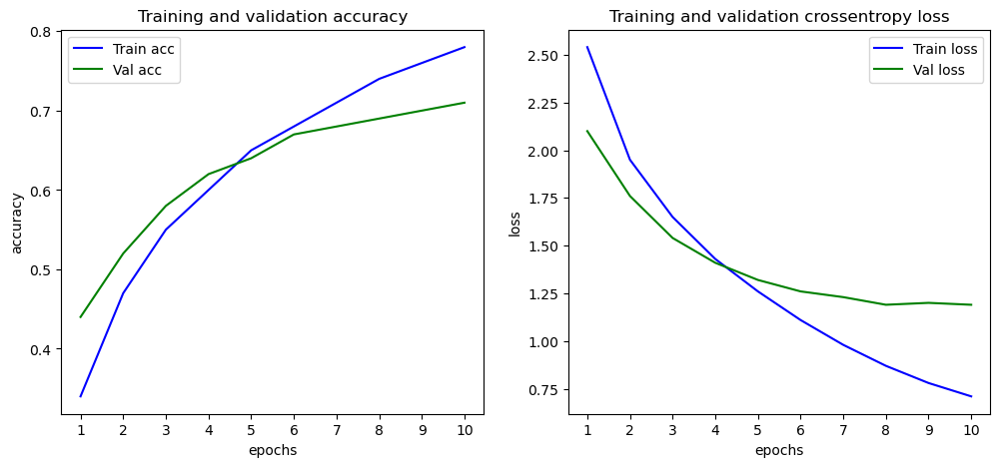

In [ ]:
plot_history_bert(history2)

### Evaluation of Model
During the evaluation stage we pass the unseen data(testing Dataset) to the model. This step determines how good the model performs on the unseen data.

In [ ]:
def evaluate1(model, test_loader):
    model.eval()
    n_correct = 0; n_wrong = 0; total = 0
    tr_loss = 0
    nb_tr_steps = 0
    nb_tr_examples = 0
    preds = []
    true_values = []
    with torch.no_grad():
        for i, data in enumerate(test_loader, 0):
            ids = data['ids'].to(device, dtype = torch.long)
            mask = data['mask'].to(device, dtype = torch.long)
            targets = data['targets'].to(device, dtype = torch.long)
            outputs = model(ids, mask).squeeze()
            loss = loss_function(outputs, targets)
            tr_loss += loss.item()
            big_val, big_idx = torch.max(outputs.data, dim=1)
            n_correct += calculate_accu(big_idx, targets)
            preds.append(big_idx)
            true_values.append(targets)

            nb_tr_steps += 1
            nb_tr_examples+=targets.size(0)

            if i%500==0:
                loss_step = tr_loss/nb_tr_steps
                accu_step = (n_correct*100)/nb_tr_examples
                print(f"Test Loss per 500 steps: {loss_step}")
                print(f"Test Accuracy per 500 steps: {accu_step}")

    epoch_loss = tr_loss/nb_tr_steps
    epoch_accu = (n_correct*100)/nb_tr_examples
    print(f"Test Loss: {epoch_loss}")
    print(f"Test Accuracy: {epoch_accu}")

    return epoch_accu, preds, true_values

In [ ]:
acc, preds, true_values = evaluate1(model_distil, testing_loader)
print("Accuracy on testing data = %0.2f%%" % acc)

Test Loss per 500 steps: 0.7143081426620483
Test Accuracy per 500 steps: 75.0
Test Loss per 500 steps: 1.211125246765921
Test Accuracy per 500 steps: 70.90818363273453
Test Loss per 500 steps: 1.1823069092824117
Test Accuracy per 500 steps: 70.17982017982018
Test Loss per 500 steps: 1.190601469282505
Test Accuracy per 500 steps: 70.00333111259161
Test Loss per 500 steps: 1.1797464540021598
Test Accuracy per 500 steps: 70.16491754122939
Test Loss per 500 steps: 1.1874876306118554
Test Accuracy per 500 steps: 70.03198720511796
Test Loss per 500 steps: 1.1870796429897978
Test Accuracy per 500 steps: 70.09330223258914
Test Loss: 1.1868535745980544
Test Accuracy: 70.09474217111449
Accuracy on testing data = 70.09%


In [ ]:
# Saving the files for re-use

output_model_file = './pdb/distilbert_proteinseq.pt'
output_vocab_file = 'distilbert_proteinseq'
output_dir = './pdb/'
model_to_save = model_distil
torch.save(model_to_save, output_model_file)
tokenizer_distil.save_vocabulary(output_dir, output_vocab_file)

# print('All files saved')

('./pdb/distilbert_proteinseq-vocab.txt',)

In [ ]:
# input_dir="/content/drive/MyDrive/Colab Notebooks/protein_seq_classification/pdb/models/distilbert_proteinseq.pt"
input_dir="./pdb/distilbert_proteinseq.pt"
complete_model=torch.load(input_dir).to(device) #, map_location=torch.device('cpu')).to(device)

In [ ]:
acc, preds, true_values = evaluate1(complete_model, testing_loader)
print("Accuracy on testing data = %0.2f%%" % acc)

Test Loss per 500 steps: 0.44323092699050903
Test Accuracy per 500 steps: 100.0
Test Loss per 500 steps: 1.1954732593279072
Test Accuracy per 500 steps: 69.26147704590818
Test Loss per 500 steps: 1.1569001971144828
Test Accuracy per 500 steps: 69.85514485514486
Test Loss per 500 steps: 1.1603608195946677
Test Accuracy per 500 steps: 70.10326449033977
Test Loss per 500 steps: 1.1654460581155892
Test Accuracy per 500 steps: 69.90254872563717
Test Loss per 500 steps: 1.1754783392619075
Test Accuracy per 500 steps: 70.18192722910835
Test Loss per 500 steps: 1.179035778399709
Test Accuracy per 500 steps: 70.05998000666445
Test Loss: 1.1869987892324392
Test Accuracy: 70.09474217111449
Accuracy on testing data = 70.09%


In [ ]:
predicted = []
for batch in preds:
    for pred in batch:
        pred = pred.detach().cpu().numpy()
        predicted.append(pred.tolist())

# print(predicted)

In [ ]:
true_labels = []
for batch in true_values:
    for value in batch:
        value = value.detach().cpu().numpy()
        true_labels.append(value.tolist())

# print(true_labels)

In [ ]:
acc = accuracy_score(predicted, true_labels)
test_f1_score = f1_score(true_labels, predicted, average = 'weighted')
# test_f1_per_class = f1_score(true_labels, predicted, average=None)

print(f'Test Acc: {acc}')
print(f'Test F1 Score(Weighted): {test_f1_score}')
# print(f'Test F1 Score per class: {test_f1_per_class}')

Test Acc: 0.7009474217111449
Test F1 Score(Weighted): 0.6965306997353965


In [ ]:
print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(true_labels, predicted, target_names=labels_dict.keys()))

-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.64      0.75        14
    antibiotic hydrolase       0.38      0.38      0.38        13
  antibiotic transferase       0.50      0.20      0.29        10
   antimicrobial protein       0.60      0.50      0.55        18
               apoptosis       0.67      0.58      0.63        53
    biosynthetic protein       0.65      0.36      0.46        42
  biotin-binding protein       0.67      1.00      0.80        12
          blood clotting       0.54      0.44      0.48        34
 calcium-binding protein       0.40      0.17      0.24        12
           cell adhesion       0.70      0.57      0.63       144
              cell cycle       0.53      0.42      0.47       117
           cell invasion       0.40      0.20      0.27        10
               chaperone       0.65      0.63      0.64       134
     contra

### **Note** Retrained model for further 10 epochs

In [ ]:
input_dir="./pdb/distilbert_proteinseq.pt"
complete_model=torch.load(input_dir).to(device) #, map_location=torch.device('cpu')).to(device)

In [ ]:
# Creating the loss function and optimizer
EPOCHS = 10
LEARNING_RATE = 1e-05
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params =  complete_model.parameters(), lr=LEARNING_RATE)

In [ ]:
# training the model and validating model performance
for epoch in range(1, EPOCHS+1):
    train_acc, train_loss = train(complete_model, epoch)
    torch.save(complete_model, f"./pdb/distilbert_proteinseq_1{epoch}.pt")
    val_acc, val_loss = valid(complete_model, validation_loader, epoch)
    print(f"Loss on training data = {train_loss}")
    print("Accuracy on training data = %0.2f%%" % train_acc)
    print(f"Loss on validation data = {val_loss}")
    print("Accuracy on validation data = %0.2f%%" % val_acc)

Training Loss per 1000 steps: 0.3453769385814667
Training Accuracy per 1000 steps: 75.0
Training Loss per 1000 steps: 0.41464671820028126
Training Accuracy per 1000 steps: 85.4895104895105
Training Loss per 1000 steps: 0.40600737329930353
Training Accuracy per 1000 steps: 85.91954022988506
Training Loss per 1000 steps: 0.4116079222947762
Training Accuracy per 1000 steps: 85.77140953015662
Training Loss per 1000 steps: 0.4188196991744844
Training Accuracy per 1000 steps: 85.616095976006
Training Loss per 1000 steps: 0.4194119611036851
Training Accuracy per 1000 steps: 85.53789242151569
Training Loss per 1000 steps: 0.42010535588374887
Training Accuracy per 1000 steps: 85.58573571071489
Training Loss per 1000 steps: 0.42056333902937965
Training Accuracy per 1000 steps: 85.57706041994001
Training Loss per 1000 steps: 0.42346023431626106
Training Accuracy per 1000 steps: 85.52993375828021
Training Loss per 1000 steps: 0.42558361609371725
Training Accuracy per 1000 steps: 85.46272636373736


Training Loss per 1000 steps: 0.3827451081998317
Training Accuracy per 1000 steps: 86.626485946006
Training Loss per 1000 steps: 0.38782828961595395
Training Accuracy per 1000 steps: 86.42885711428858
Training Loss per 1000 steps: 0.38676416814274983
Training Accuracy per 1000 steps: 86.47850195436779
Training Loss per 1000 steps: 0.3888461177696154
Training Accuracy per 1000 steps: 86.38030164152987
Training Loss per 1000 steps: 0.38748665191978426
Training Accuracy per 1000 steps: 86.41835243442812
Training Loss per 1000 steps: 0.3886381827686569
Training Accuracy per 1000 steps: 86.42418398685808
Training Loss per 1000 steps: 0.39083996858782205
Training Accuracy per 1000 steps: 86.3809079394707
Training Loss per 1000 steps: 0.391826156874784
Training Accuracy per 1000 steps: 86.38366352102993
Training Loss per 1000 steps: 0.3923324689151261
Training Accuracy per 1000 steps: 86.39785894947356
Training Loss per 1000 steps: 0.39377322898946715
Training Accuracy per 1000 steps: 86.3896

Training Loss per 1000 steps: 0.36753608930988657
Training Accuracy per 1000 steps: 86.95766901838786
Training Loss per 1000 steps: 0.3691941992950363
Training Accuracy per 1000 steps: 86.90068943739803
Training Loss per 1000 steps: 0.37128759505383013
Training Accuracy per 1000 steps: 86.8331583420829
Training Loss per 1000 steps: 0.3731347985397999
Training Accuracy per 1000 steps: 86.77205847340603
Training Loss per 1000 steps: 0.3733613875563273
Training Accuracy per 1000 steps: 86.81423571655834
Training Loss per 1000 steps: 0.37495165455085094
Training Accuracy per 1000 steps: 86.78209643058997
Training Loss per 1000 steps: 0.37687354963579456
Training Accuracy per 1000 steps: 86.73701095787675
Training Loss per 1000 steps: 0.37820339144906484
Training Accuracy per 1000 steps: 86.71953121875126
Training Loss per 1000 steps: 0.37888290839294103
Training Accuracy per 1000 steps: 86.70147302026845
Training Loss per 1000 steps: 0.379500356544712
Training Accuracy per 1000 steps: 86.6

Training Loss per 1000 steps: 0.3558504203194517
Training Accuracy per 1000 steps: 87.34213547646384
Total Training Accuracy for Epoch 7: 87.3086882757389
Training Loss Epoch: 0.35716802287005806
Training Accuracy Epoch: 87.3086882757389
Validation Loss per 1000 steps: 3.918743133544922
Validation Accuracy per 1000 steps: 50.0
Validation Loss per 1000 steps: 1.4591755445614656
Validation Accuracy per 1000 steps: 72.72727272727273
Validation Loss per 1000 steps: 1.468333220690722
Validation Accuracy per 1000 steps: 72.43878060969516
Validation Loss per 1000 steps: 1.4771471468148754
Validation Accuracy per 1000 steps: 72.47584138620459
Total Validation Accuracy for Epoch 7: 72.45258759241402
Validation Loss Epoch: 1.479985825721472
Validation Accuracy Epoch: 72.45258759241402
Loss on training data = 0.35716802287005806
Accuracy on training data = 87.31%
Loss on validation data = 1.479985825721472
Accuracy on validation data = 72.45%
Training Loss per 1000 steps: 0.1975664347410202
Train

Training Loss per 1000 steps: 0.03238583728671074
Training Accuracy per 1000 steps: 100.0
Training Loss per 1000 steps: 0.2933826896758121
Training Accuracy per 1000 steps: 89.1108891108891
Training Loss per 1000 steps: 0.29856733264842433
Training Accuracy per 1000 steps: 88.83058470764618
Training Loss per 1000 steps: 0.30572358351553924
Training Accuracy per 1000 steps: 88.57047650783072
Training Loss per 1000 steps: 0.3061492852176879
Training Accuracy per 1000 steps: 88.59660084978755
Training Loss per 1000 steps: 0.30446844364460884
Training Accuracy per 1000 steps: 88.58228354329134
Training Loss per 1000 steps: 0.31025089320794813
Training Accuracy per 1000 steps: 88.39776703882686
Training Loss per 1000 steps: 0.3148777271281203
Training Accuracy per 1000 steps: 88.3123839451507
Training Loss per 1000 steps: 0.3162680137190926
Training Accuracy per 1000 steps: 88.25459317585302
Training Loss per 1000 steps: 0.3179077091293201
Training Accuracy per 1000 steps: 88.19020108876792

In [ ]:
# Saving the files for re-use

output_model_file = './pdb/distilbert_proteinseq20.pt'
output_vocab_file = 'distilbert_proteinseq20'
output_dir = './pdb/'
model_to_save = complete_model
torch.save(model_to_save, output_model_file)
tokenizer_distil.save_vocabulary(output_dir, output_vocab_file)

In [ ]:
input_dir="./pdb/distilbert_proteinseq20.pt"
complete_model=torch.load(input_dir).to(device) #, map_location=torch.device('cpu')).to(device)

In [ ]:
acc, preds, true_values = evaluate1(complete_model, testing_loader)
print("Accuracy on testing data = %0.2f%%" % acc)

Test Loss per 500 steps: 0.06933073699474335
Test Accuracy per 500 steps: 100.0
Test Loss per 500 steps: 1.4984059131093381
Test Accuracy per 500 steps: 72.60479041916167
Test Loss per 500 steps: 1.450178379410791
Test Accuracy per 500 steps: 73.02697302697302
Test Loss per 500 steps: 1.482292857408508
Test Accuracy per 500 steps: 72.51832111925383
Test Loss per 500 steps: 1.4691785030005196
Test Accuracy per 500 steps: 72.75112443778112
Test Loss per 500 steps: 1.4571677873124038
Test Accuracy per 500 steps: 72.79088364654139
Test Loss per 500 steps: 1.4558545909239669
Test Accuracy per 500 steps: 72.65911362879041
Test Loss: 1.4660080134561158
Test Accuracy: 72.48860924278586
Accuracy on testing data = 72.49%


In [ ]:
predicted = []
for batch in preds:
    for pred in batch:
        pred = pred.detach().cpu().numpy()
        predicted.append(pred.tolist())

In [ ]:
true_labels = []
for batch in true_values:
    for value in batch:
        value = value.detach().cpu().numpy()
        true_labels.append(value.tolist())

In [ ]:
acc = accuracy_score(predicted, true_labels)
test_f1_score = f1_score(true_labels, predicted, average = 'weighted')
# test_f1_per_class = f1_score(true_labels, predicted, average=None)

print(f'Test Acc: {acc}')
print(f'Test F1 Score(Weighted): {test_f1_score}')
# print(f'Test F1 Score per class: {test_f1_per_class}')

Test Acc: 0.7248860924278585
Test F1 Score(Weighted): 0.7220622586881611


In [ ]:
print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(true_labels, predicted, target_names=labels_dict.keys()))

-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.91      0.71      0.80        14
    antibiotic hydrolase       0.27      0.31      0.29        13
  antibiotic transferase       0.27      0.30      0.29        10
   antimicrobial protein       0.75      0.50      0.60        18
               apoptosis       0.69      0.51      0.59        53
    biosynthetic protein       0.64      0.64      0.64        42
  biotin-binding protein       0.80      1.00      0.89        12
          blood clotting       0.61      0.50      0.55        34
 calcium-binding protein       0.36      0.33      0.35        12
           cell adhesion       0.72      0.62      0.67       144
              cell cycle       0.54      0.37      0.44       117
           cell invasion       0.67      0.40      0.50        10
               chaperone       0.85      0.61      0.71       134
     contra

### **Note** Retrained model for further 10 epochs

In [ ]:
input_dir="./pdb/distilbert_proteinseq20.pt"
complete_model=torch.load(input_dir).to(device) #, map_location=torch.device('cpu')).to(device)

In [ ]:
# Creating the loss function and optimizer
EPOCHS = 10
LEARNING_RATE = 1e-05
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(params =  complete_model.parameters(), lr=LEARNING_RATE)

In [ ]:
# training the model and validating model performance
for epoch in range(1, EPOCHS+1):
    train_acc, train_loss = train(complete_model, epoch)
    torch.save(complete_model, f"./pdb/distilbert_proteinseq_2{epoch}.pt")
    val_acc, val_loss = valid(complete_model, validation_loader, epoch)
    print(f"Loss on training data = {train_loss}")
    print("Accuracy on training data = %0.2f%%" % train_acc)
    print(f"Loss on validation data = {val_loss}")
    print("Accuracy on validation data = %0.2f%%" % val_acc)

Training Loss per 1000 steps: 0.2937451899051666
Training Accuracy per 1000 steps: 75.0
Training Loss per 1000 steps: 0.3048517390597227
Training Accuracy per 1000 steps: 88.31168831168831
Training Loss per 1000 steps: 0.29417584770303423
Training Accuracy per 1000 steps: 88.89305347326336
Training Loss per 1000 steps: 0.29985608467307934
Training Accuracy per 1000 steps: 88.72042652449184
Training Loss per 1000 steps: 0.2991218779365332
Training Accuracy per 1000 steps: 88.69032741814546
Training Loss per 1000 steps: 0.29768260038048305
Training Accuracy per 1000 steps: 88.72725454909018
Training Loss per 1000 steps: 0.30249861621792573
Training Accuracy per 1000 steps: 88.62689551741376
Training Loss per 1000 steps: 0.30359204026641584
Training Accuracy per 1000 steps: 88.60519925724897
Training Loss per 1000 steps: 0.30319689083258256
Training Accuracy per 1000 steps: 88.54518185226847
Training Loss per 1000 steps: 0.3039214190593805
Training Accuracy per 1000 steps: 88.601266525941

Training Loss per 1000 steps: 0.2949865944426432
Training Accuracy per 1000 steps: 88.81235418286857
Training Loss per 1000 steps: 0.29516073387060954
Training Accuracy per 1000 steps: 88.84611538846116
Training Loss per 1000 steps: 0.29668634519964976
Training Accuracy per 1000 steps: 88.79192800654486
Training Loss per 1000 steps: 0.2966802493878339
Training Accuracy per 1000 steps: 88.79676693608866
Training Loss per 1000 steps: 0.2984216464535673
Training Accuracy per 1000 steps: 88.76240289208522
Training Loss per 1000 steps: 0.2982151092545971
Training Accuracy per 1000 steps: 88.78294407542319
Training Loss per 1000 steps: 0.30001659726921553
Training Accuracy per 1000 steps: 88.77074861675888
Training Loss per 1000 steps: 0.3011070451436714
Training Accuracy per 1000 steps: 88.72570464345978
Training Loss per 1000 steps: 0.3012465463347273
Training Accuracy per 1000 steps: 88.71242868066584
Training Loss per 1000 steps: 0.3024812363223156
Training Accuracy per 1000 steps: 88.67

Training Loss per 1000 steps: 0.2958681852756173
Training Accuracy per 1000 steps: 88.70479417810121
Training Loss per 1000 steps: 0.2963068805062312
Training Accuracy per 1000 steps: 88.6927003841903
Training Loss per 1000 steps: 0.29786055191410915
Training Accuracy per 1000 steps: 88.67056647167642
Training Loss per 1000 steps: 0.2982070762582979
Training Accuracy per 1000 steps: 88.66125422598924
Training Loss per 1000 steps: 0.2993787106176501
Training Accuracy per 1000 steps: 88.65619744557065
Training Loss per 1000 steps: 0.30051612578583037
Training Accuracy per 1000 steps: 88.6265814529803
Training Loss per 1000 steps: 0.30094531192923013
Training Accuracy per 1000 steps: 88.63276530144577
Training Loss per 1000 steps: 0.3013786753015864
Training Accuracy per 1000 steps: 88.63145474181033
Training Loss per 1000 steps: 0.30211170487781486
Training Accuracy per 1000 steps: 88.59851544171379
Training Loss per 1000 steps: 0.30270026748659074
Training Accuracy per 1000 steps: 88.55

Training Loss per 1000 steps: 0.2960744892314453
Training Accuracy per 1000 steps: 88.83004333172846
Total Training Accuracy for Epoch 7: 88.79007054201269
Training Loss Epoch: 0.29722093559003293
Training Accuracy Epoch: 88.79007054201269
Validation Loss per 1000 steps: 0.8181043863296509
Validation Accuracy per 1000 steps: 75.0
Validation Loss per 1000 steps: 1.5602616710854893
Validation Accuracy per 1000 steps: 72.72727272727273
Validation Loss per 1000 steps: 1.5699371322378899
Validation Accuracy per 1000 steps: 72.57621189405297
Validation Loss per 1000 steps: 1.564911750180064
Validation Accuracy per 1000 steps: 72.7507497500833
Total Validation Accuracy for Epoch 7: 72.58919961427193
Validation Loss Epoch: 1.5725938326457223
Validation Accuracy Epoch: 72.58919961427193
Loss on training data = 0.29722093559003293
Accuracy on training data = 88.79%
Loss on validation data = 1.5725938326457223
Accuracy on validation data = 72.59%
Training Loss per 1000 steps: 0.037458762526512146

Training Loss per 1000 steps: 0.2776053249835968
Training Accuracy per 1000 steps: 75.0
Training Loss per 1000 steps: 0.2725589571417369
Training Accuracy per 1000 steps: 89.53546453546454
Training Loss per 1000 steps: 0.26523424213083524
Training Accuracy per 1000 steps: 89.7551224387806
Training Loss per 1000 steps: 0.2653680631597458
Training Accuracy per 1000 steps: 89.67844051982672
Training Loss per 1000 steps: 0.26970329226566864
Training Accuracy per 1000 steps: 89.59635091227193
Training Loss per 1000 steps: 0.26753914836973275
Training Accuracy per 1000 steps: 89.69206158768246
Training Loss per 1000 steps: 0.2698630957203395
Training Accuracy per 1000 steps: 89.59756707215465
Training Loss per 1000 steps: 0.27239626387354116
Training Accuracy per 1000 steps: 89.47293243822311
Training Loss per 1000 steps: 0.2708739429056286
Training Accuracy per 1000 steps: 89.48881389826272
Training Loss per 1000 steps: 0.2725854028840053
Training Accuracy per 1000 steps: 89.45950449950006


### Performance Metrics Analysis

In [ ]:
# data
performance_data = {
    "Epochs": [10, 20, 30],
    "Train Loss": [0.71, 0.33, 0.29],
    "Train Accuracy": [0.78, 0.88, 0.89],
    "Val Loss": [1.19, 1.49, 1.81],
    "Val Accuracy": [0.71, 0.724, 0.726]
}

# Creating the performance metrics table
performance_df = pd.DataFrame(performance_data)
print("Performance Metrics Table")
print(performance_df)

# Calculate mean and standard deviation
summary_data = {
    "Metric": ["Train Loss", "Train Accuracy", "Val Loss", "Val Accuracy"],
    "Mean": [
        np.mean(performance_df["Train Loss"]),
        np.mean(performance_df["Train Accuracy"]),
        np.mean(performance_df["Val Loss"]),
        np.mean(performance_df["Val Accuracy"])
    ],
    "Standard Deviation": [
        np.std(performance_df["Train Loss"]),
        np.std(performance_df["Train Accuracy"]),
        np.std(performance_df["Val Loss"]),
        np.std(performance_df["Val Accuracy"])
    ]
}

# Creating the summary statistics table
summary_df = pd.DataFrame(summary_data)
print("\nSummary Statistics Table")
print(summary_df)

Performance Metrics Table
   Epochs  Train Loss  Train Accuracy  Val Loss  Val Accuracy
0      10        0.71            0.78      1.19         0.710
1      20        0.33            0.88      1.49         0.724
2      30        0.29            0.89      1.81         0.726

Summary Statistics Table
           Metric      Mean  Standard Deviation
0      Train Loss  0.443333            0.189268
1  Train Accuracy  0.850000            0.049666
2        Val Loss  1.496667            0.253158
3    Val Accuracy  0.720000            0.007118


In [ ]:
# Calculate mean and standard deviation
mean_std_data = {
    "Epochs": ["Mean ± Std"],
    "Train Loss": [f"{np.mean(performance_df['Train Loss']):.4f} ± {np.std(performance_df['Train Loss']):.4f}"],
    "Train Accuracy": [f"{np.mean(performance_df['Train Accuracy']):.4f} ± {np.std(performance_df['Train Accuracy']):.4f}"],
    "Val Loss": [f"{np.mean(performance_df['Val Loss']):.4f} ± {np.std(performance_df['Val Loss']):.4f}"],
    "Val Accuracy": [f"{np.mean(performance_df['Val Accuracy']):.4f} ± {np.std(performance_df['Val Accuracy']):.4f}"]
}

# Append the mean and standard deviation row to the performance metrics table
mean_std_df = pd.DataFrame(mean_std_data)
combined_df = pd.concat([performance_df, mean_std_df], ignore_index=True)

# Display the combined table
print("Combined Performance Metrics Table with Summary Statistics")
combined_df

Combined Performance Metrics Table with Summary Statistics


,Epochs,Train Loss,Train Accuracy,Val Loss,Val Accuracy
0,10,0.71,0.78,1.19,0.71
1,20,0.33,0.88,1.49,0.724
2,30,0.29,0.89,1.81,0.726
3,Mean ± Std,0.4433 ± 0.1893,0.8500 ± 0.0497,1.4967 ± 0.2532,0.7200 ± 0.0071


In [ ]:
# Saving the files for re-use

output_model_file = './pdb/distilbert_proteinseq30.pt'
output_vocab_file = 'distilbert_proteinseq30'
output_dir = './pdb/'
model_to_save = complete_model
torch.save(model_to_save, output_model_file)
tokenizer_distil.save_vocabulary(output_dir, output_vocab_file)

('./pdb/distilbert_proteinseq30-vocab.txt',)

In [ ]:
input_dir="./pdb/distilbert_proteinseq30.pt"
complete_model=torch.load(input_dir).to(device) #, map_location=torch.device('cpu')).to(device)

In [ ]:
acc, preds, true_values = evaluate1(complete_model, testing_loader)
print("Accuracy on testing data = %0.2f%%" % acc)

Test Loss per 500 steps: 3.060802936553955
Test Accuracy per 500 steps: 50.0
Test Loss per 500 steps: 1.7277130469309034
Test Accuracy per 500 steps: 73.70259481037924
Test Loss per 500 steps: 1.7609321305438668
Test Accuracy per 500 steps: 73.67632367632368
Test Loss per 500 steps: 1.7734606590772863
Test Accuracy per 500 steps: 73.28447701532312
Test Loss per 500 steps: 1.7854108434781257
Test Accuracy per 500 steps: 73.07596201899051
Test Loss per 500 steps: 1.772888519508561
Test Accuracy per 500 steps: 72.88084766093563
Test Loss per 500 steps: 1.7864546588427366
Test Accuracy per 500 steps: 72.57580806397867
Test Loss: 1.7673617148147536
Test Accuracy: 72.78513054169379
Accuracy on testing data = 72.79%


In [ ]:
predicted = []
for batch in preds:
    for pred in batch:
        pred = pred.detach().cpu().numpy()
        predicted.append(pred.tolist())

In [ ]:
true_labels = []
for batch in true_values:
    for value in batch:
        value = value.detach().cpu().numpy()
        true_labels.append(value.tolist())

In [ ]:
acc = accuracy_score(predicted, true_labels)
test_f1_score = f1_score(true_labels, predicted, average = 'weighted')

print(f'Test Acc: {acc}')
print(f'Test F1 Score(Weighted): {test_f1_score}')

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(true_labels, predicted, target_names=labels_dict.keys()))

Test Acc: 0.7278513054169379
Test F1 Score(Weighted): 0.7243605480445306
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.82      0.64      0.72        14
    antibiotic hydrolase       0.36      0.31      0.33        13
  antibiotic transferase       0.33      0.30      0.32        10
   antimicrobial protein       0.67      0.56      0.61        18
               apoptosis       0.58      0.53      0.55        53
    biosynthetic protein       0.84      0.62      0.71        42
  biotin-binding protein       0.80      1.00      0.89        12
          blood clotting       0.64      0.47      0.54        34
 calcium-binding protein       0.36      0.33      0.35        12
           cell adhesion       0.67      0.62      0.65       144
              cell cycle       0.49      0.56      0.52       117
           cell invasion       0.80      0.40      0.53        10
    

In [ ]:
# data
test_performance_data = {
    "Epochs": [10, 20, 30],
    "Test Loss": [1.19, 1.47, 1.77],
    "Test Accuracy": [0.70, 0.72, 0.73],
    "Test F1 Score (Weighted)": [0.70, 0.72, 0.72],
    "Test F1 Score (Macro)": [0.54, 0.60, 0.61]
}

# Creating the performance metrics table
performance_df = pd.DataFrame(test_performance_data)

# Calculate mean and standard deviation
mean_std_data = {
    "Epochs": ["Mean ± Std"],
    "Test Loss": [f"{np.mean(performance_df['Test Loss']):.4f} ± {np.std(performance_df['Test Loss']):.4f}"],
    "Test Accuracy": [f"{np.mean(performance_df['Test Accuracy']):.4f} ± {np.std(performance_df['Test Accuracy']):.4f}"],
    "Test F1 Score (Weighted)": [f"{np.mean(performance_df['Test F1 Score (Weighted)']):.4f} ± {np.std(performance_df['Test F1 Score (Weighted)']):.4f}"],
    "Test F1 Score (Macro)": [f"{np.mean(performance_df['Test F1 Score (Macro)']):.4f} ± {np.std(performance_df['Test F1 Score (Macro)']):.4f}"]
}

# Append the mean and standard deviation row to the performance metrics table
mean_std_df = pd.DataFrame(mean_std_data)
combined_df = pd.concat([performance_df, mean_std_df], ignore_index=True)

# Display the combined table
print("Combined Performance Metrics Table with Summary Statistics for test data")
combined_df

Combined Performance Metrics Table with Summary Statistics for test data


,Epochs,Test Loss,Test Accuracy,Test F1 Score (Weighted),Test F1 Score (Macro)
0,10,1.19,0.7,0.7,0.54
1,20,1.47,0.72,0.72,0.6
2,30,1.77,0.73,0.72,0.61
3,Mean ± Std,1.4767 ± 0.2368,0.7167 ± 0.0125,0.7133 ± 0.0094,0.5833 ± 0.0309


In [ ]:
# # confusion matrix
cm_bert2 = confusion_matrix(true_labels, predicted) #.astype(int)
cm_df_bert2 = pd.DataFrame(cm_bert2, columns = pd.Index(labels_dict.keys(), name = 'Predicted Label:'), index = pd.Index(labels_dict.keys(), name='Actual Label:'))
cm_df_bert2

Predicted Label:,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
Actual Label:,,,,,,,,,,,,,,,,,,,,,
allergen,9,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
antibiotic hydrolase,0,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic transferase,0,0,3,0,0,0,0,0,0,0,...,1,0,0,4,2,0,0,0,0,0
antimicrobial protein,0,0,0,10,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,2,0
apoptosis,0,0,0,0,28,0,0,0,0,0,...,2,0,0,2,0,0,1,5,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,31,0,1,0,0
transport protein,0,0,0,0,1,0,0,0,0,2,...,3,0,0,6,0,0,251,7,0,1
unknown function,0,0,0,1,1,0,2,0,0,3,...,17,0,1,35,0,0,6,153,8,0


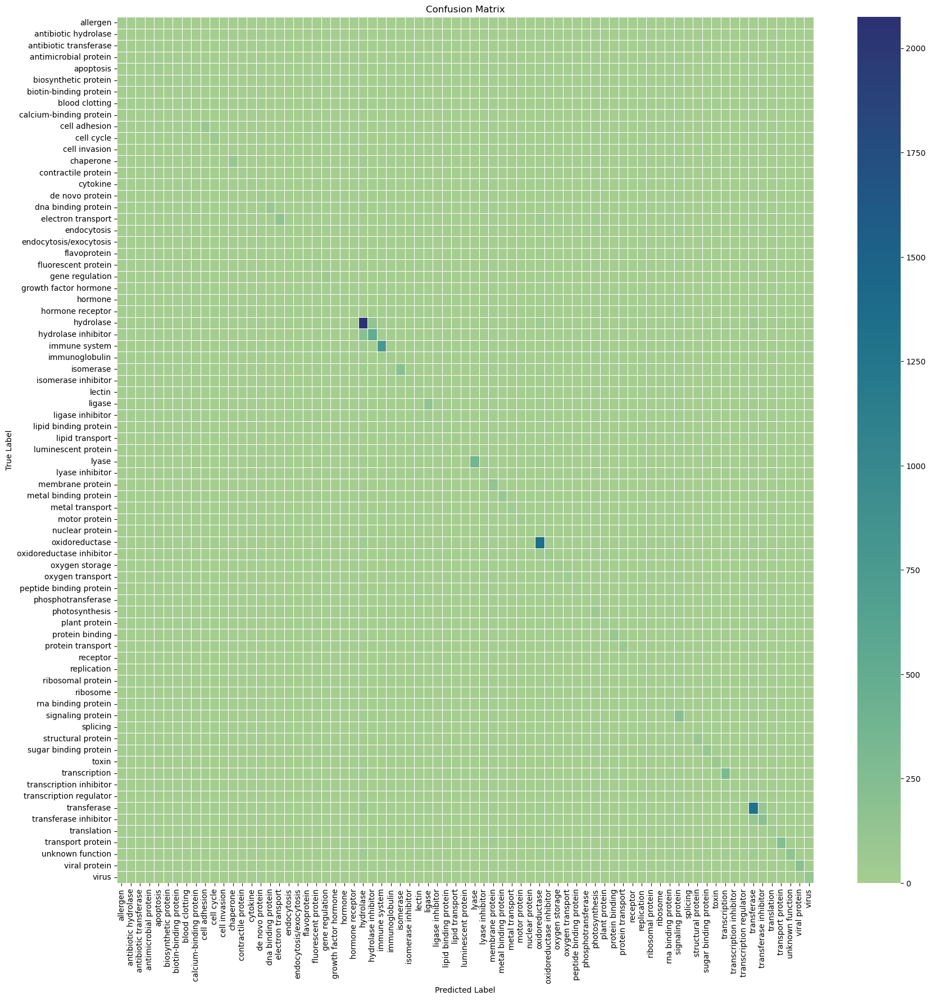

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_bert2 = confusion_matrix(true_labels, predicted)#.astype(int)
sns.heatmap(cm_bert2, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels_dict.keys(), yticklabels=labels_dict.keys())
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

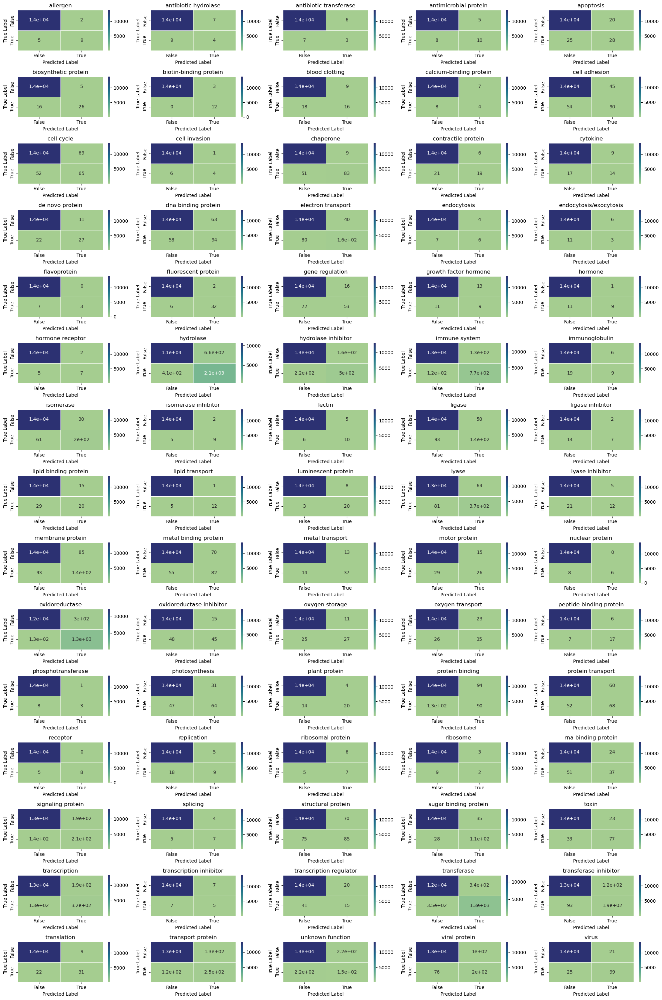

In [ ]:
multi_cm_bert2 = multilabel_confusion_matrix(true_labels, predicted, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])

# Plotting confusion matrix for each class
label = list(labels_dict.keys())
fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_bert2):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(label[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

In [ ]:
bert_df2 = pd.DataFrame()
bert_df2['classes'] = true_labels
bert_df2['prediction'] = predicted
bert_df2['predicted_class'] = bert_df2['prediction'].map(labels_dict_reverse)
bert_df2['actual_class'] = bert_df2['classes'].map(labels_dict_reverse)
bert_df2

,classes,prediction,predicted_class,actual_class
0,72,45,oxidoreductase,unknown function
1,16,16,dna binding protein,dna binding protein
2,45,45,oxidoreductase,oxidoreductase
3,13,62,structural protein,contractile protein
4,28,28,immune system,immune system
...,...,...,...,...
13822,47,47,oxygen storage,oxygen storage
13823,26,26,hydrolase,hydrolase
13824,27,27,hydrolase inhibitor,hydrolase inhibitor
13825,70,70,translation,translation


## Prot_Bert

In [ ]:
from transformers import AdamW, BertTokenizerFast, BertForSequenceClassification

In [ ]:
# from torch.utils.data import TensorDataset
# tokenizer_prot = BertTokenizer.from_pretrained('Rostlab/prot_bert', do_lower_case = False)

In [ ]:
# from torch.utils.data import TensorDataset
tokenizer_prot = BertTokenizerFast.from_pretrained('Rostlab/prot_bert', do_lower_case = False)

In [ ]:
def create_data_loader(df, tokenizer, max_len, batch_size):
    ds = ProteinDataset(
        sequences = df.sequences.to_numpy(),
        targets = df.classes.to_numpy(),
        tokenizer = tokenizer,
        max_len = max_len
    )

    return DataLoader(
        ds,
        batch_size = batch_size,
        num_workers = 1
    )

In [ ]:
BATCH_SIZE = 4
MAX_LEN = avg_length

train_data_loader_prot = create_data_loader(df_train_unimers, tokenizer_prot, MAX_LEN, BATCH_SIZE)
val_data_loader_prot = create_data_loader(df_val_unimers, tokenizer_prot, MAX_LEN, BATCH_SIZE)
test_data_loader_prot = create_data_loader(df_test_unimers, tokenizer_prot, MAX_LEN, BATCH_SIZE)

In [ ]:
import os
os.environ["TOKENIZERS_PARALLELISM"] = "false"

In [ ]:
data_prot = next(iter(train_data_loader_prot))
data_prot.keys()

dict_keys(['protein_sequence', 'input_ids', 'attention_mask', 'targets'])

In [ ]:
# bert_model_prot = BertModel.from_pretrained('Rostlab/prot_bert')
bert_model_prot = BertForSequenceClassification.from_pretrained('Rostlab/prot_bert', num_labels = len(labels_dict),
                                                           output_attentions=False, output_hidden_states=False)
bert_model_prot.to(device)

Some weights of the model checkpoint at Rostlab/prot_bert were not used when initializing BertForSequenceClassification: ['cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForSequenceClassification were not initiali

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30, 1024, padding_idx=0)
      (position_embeddings): Embedding(40000, 1024)
      (token_type_embeddings): Embedding(2, 1024)
      (LayerNorm): LayerNorm((1024,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-29): 30 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=1024, out_features=1024, bias=True)
              (key): Linear(in_features=1024, out_features=1024, bias=True)
              (value): Linear(in_features=1024, out_features=1024, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=1024, out_features=1024, bias=True)
              (LayerNorm): LayerNorm((1024,)

In [ ]:
EPOCHS = 10
optimizer = torch.optim.AdamW(bert_model_prot.parameters(), lr = 2e-5, eps = 1e-8)
total_steps = len(train_data_loader_prot) * EPOCHS
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps = 0,
    num_training_steps = total_steps
)

In [ ]:
from sklearn.metrics import f1_score, accuracy_score

# creating a function for computing performance metrics of interest
def my_metrics(labels, predictions):

    ## Use argmax to first work out which class has been predicted for each data sample.
    ## Second count how many of these are correctly predicted
    ## Finally return the accuracy, i.e. the percentage of samples correctly predicted

    predicted_classes = np.argmax(predictions, axis=1).flatten()
    labels = labels.flatten()


    avg_f1_score = f1_score(labels, predicted_classes, average='weighted')
    f1_score_per_class = f1_score(labels, predicted_classes, average=None)
    acc = accuracy_score(predicted_classes, labels)

    return avg_f1_score, f1_score_per_class, acc

In [ ]:
def model_evaluate(model, dataloader_val):

    model.eval()

    loss_val_total = 0
    predictions, true_vals = [], []

    for batch in dataloader_val:

        inputs = {'input_ids': batch["input_ids"].to(device),
                  'attention_mask': batch["attention_mask"].to(device),
                  'labels': batch["targets"].to(device),
                 }

        with torch.no_grad():
          outputs = model(**inputs)

        loss = outputs[0]
        logits = outputs[1]
        loss_val_total += loss.item()

        logits = logits.detach().cpu().numpy()
        label_ids = inputs['labels'].cpu().numpy()
        predictions.append(logits)
        true_vals.append(label_ids)

    avg_val_loss = loss_val_total/len(dataloader_val)

    predicted_vals = np.concatenate(predictions, axis=0)
    true_vals = np.concatenate(true_vals, axis=0)

    return avg_val_loss, predicted_vals, true_vals

def model_train(model, dataloader_train):

    model.train()

    loss_train_total = 0
    predictions, true_vals = [], []


    progress_bar = tqdm(dataloader_train, desc='Epoch {:1d}'.format(epoch), leave=False, disable=False)
    for batch in progress_bar:

        model.zero_grad()

        inputs = {'input_ids': batch["input_ids"].to(device),
                  'attention_mask': batch["attention_mask"].to(device),
                  'labels': batch["targets"].to(device),
                 }

        outputs = model(**inputs)

        loss = outputs[0]
        loss_train_total += loss.item()
        loss.backward()

        logits = outputs[1]
        logits = logits.detach().cpu().numpy()
        label_ids = inputs['labels'].cpu().numpy()
        predictions.append(logits)
        true_vals.append(label_ids)

        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        optimizer.step()
        scheduler.step()

        progress_bar.set_postfix({'training_loss': '{:.3f}'.format(loss.item()/len(batch))})

    avg_train_loss = loss_train_total/len(dataloader_train)
    predicted_vals = np.concatenate(predictions, axis=0)
    true_vals = np.concatenate(true_vals, axis=0)

    return avg_train_loss, predicted_vals, true_vals

In [ ]:
%%time
history = defaultdict(list)
best_accuracy = 0
for epoch in range(1, EPOCHS+1):
    tqdm.write(f'\nEpoch {epoch}')

    train_loss, predicted_vals, true_vals = model_train(bert_model_prot, train_data_loader_prot)
    train_f1_score, train_f1_per_class, train_acc = my_metrics(true_vals, predicted_vals)
    tqdm.write(f'Training loss: {train_loss}')
    tqdm.write(f'Training Acc: {train_acc}')

    torch.save(bert_model_prot, f'pdb/finetuned_ProtBERT_pdb_epoch_{epoch}.pt')

    val_loss, val_predicted_vals, val_true_vals = model_evaluate(bert_model_prot, val_data_loader_prot)
    val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)

    tqdm.write(f'Validation loss: {val_loss}')
    tqdm.write(f'Validation Acc: {val_acc}')
    tqdm.write(f'Validation F1 Score(Weighted): {val_f1_score}')
    tqdm.write(f'Validation F1 Score per class: {val_f1_per_class}')

    history['train_acc'].append(train_acc)
    history['train_loss'].append(train_loss)
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)


Epoch 1



Epoch 1:   0%|       | 96/27998 [03:24<15:58:01,  2.06s/it, training_loss=1.021]


Epoch 1:   1%|      | 193/27998 [07:05<18:26:50,  2.39s/it, training_loss=0.890]


Epoch 1:   1%|      | 290/27998 [10:59<18:38:01,  2.42s/it, training_loss=1.150]


Epoch 1:   1%|      | 387/27998 [14:49<17:47:02,  2.32s/it, training_loss=0.720]


Epoch 1:   2%|      | 484/27998 [18:36<17:43:51,  2.32s/it, training_loss=1.128]


Epoch 1:   2%|      | 581/27998 [22:25<17:45:43,  2.33s/it, training_loss=0.660]


Epoch 1:   2%|▏     | 678/27998 [26:14<18:03:45,  2.38s/it, training_loss=0.848]


Epoch 1:   3%|▏     | 775/27998 [30:05<18:14:46,  2.41s/it, training_loss=0.806]


Epoch 1:   3%|▏     | 872/27998 [33:56<18:25:30,  2.45s/it, training_loss=0.461]


Epoch 1:   3%|▏     | 969/27998 [37:48<17:53:42,  2.38s/it, training_loss=0.779]


Epoch 1:   4%|▏    | 1066/27998 [41:41<17:50:02,  2.38s/it, training_loss=1.147]


Epoch 1:   4%|▏    | 1163/27998 [45:35<17:57:01,  2.41s/it, training_loss=0.965]


Epoch 1:   5%|▏    | 1260/27998 [49:29<17:53:54,  2.41s/it, training_loss=0.904]


Epoch 1:   5%|▏    | 1357/27998 [53:23<17:47:40,  2.40s/it, training_loss=0.552]


Epoch 1:   5%|▎    | 1454/27998 [57:19<17:54:32,  2.43s/it, training_loss=0.474]


Epoch 1:   6%|▏  | 1551/27998 [1:01:14<17:40:48,  2.41s/it, training_loss=0.801]


Epoch 1:   6%|▏  | 1648/27998 [1:05:08<17:40:07,  2.41s/it, training_loss=0.982]


Epoch 1:   6%|▏  | 1745/27998 [1:09:03<17:34:37,  2.41s/it, training_loss=0.533]


Epoch 1:   7%|▏  | 1842/27998 [1:12:58<17:29:15,  2.41s/it, training_loss=0.499]


Epoch 1:   7%|▏  | 1939/27998 [1:16:53<17:22:55,  2.40s/it, training_loss=0.766]


Epoch 1:   7%|▏  | 2036/27998 [1:20:56<17:11:55,  2.38s/it, training_loss=0.629]


Epoch 1:   8%|▏  | 2133/27998 [1:24:51<17:19:02,  2.41s/it, training_loss=0.391]


Epoch 1:   8%|▏  | 2230/27998 [1:28:47<17:10:48,  2.40s/it, training_loss=0.869]


Epoch 1:   8%|▏  | 2327/27998 [1:32:44<17:13:11,  2.41s/it, training_loss=0.652]


Epoch 1:   9%|▎  | 2424/27998 [1:36:39<16:57:33,  2.39s/it, training_loss=0.568]


Epoch 1:   9%|▎  | 2521/27998 [1:40:34<16:58:23,  2.40s/it, training_loss=0.775]


Epoch 1:   9%|▎  | 2618/27998 [1:44:29<16:55:51,  2.40s/it, training_loss=0.266]


Epoch 1:  10%|▎  | 2715/27998 [1:48:25<16:55:25,  2.41s/it, training_loss=0.679]


Epoch 1:  10%|▎  | 2812/27998 [1:52:20<16:58:23,  2.43s/it, training_loss=0.560]


Epoch 1:  10%|▎  | 2909/27998 [1:56:28<18:53:12,  2.71s/it, training_loss=0.305]


Epoch 1:  11%|▎  | 3006/27998 [2:00:45<18:06:19,  2.61s/it, training_loss=0.955]


Epoch 1:  11%|▎  | 3103/27998 [2:04:58<17:51:28,  2.58s/it, training_loss=0.557]


Epoch 1:  11%|▎  | 3200/27998 [2:09:07<16:38:47,  2.42s/it, training_loss=0.797]


Epoch 1:  12%|▎  | 3297/27998 [2:13:03<16:47:37,  2.45s/it, training_loss=0.443]


Epoch 1:  12%|▎  | 3394/27998 [2:17:02<16:35:25,  2.43s/it, training_loss=0.547]


Epoch 1:  12%|▎  | 3491/27998 [2:20:57<16:26:11,  2.41s/it, training_loss=0.484]


Epoch 1:  13%|▍  | 3588/27998 [2:24:52<16:24:01,  2.42s/it, training_loss=0.546]


Epoch 1:  13%|▍  | 3685/27998 [2:28:47<16:11:07,  2.40s/it, training_loss=0.615]


Epoch 1:  14%|▍  | 3782/27998 [2:32:42<16:07:13,  2.40s/it, training_loss=0.502]


Epoch 1:  14%|▍  | 3879/27998 [2:36:37<15:56:23,  2.38s/it, training_loss=0.545]


Epoch 1:  14%|▍  | 3976/27998 [2:40:32<15:57:28,  2.39s/it, training_loss=0.624]


Epoch 1:  15%|▍  | 4073/27998 [2:44:26<15:56:32,  2.40s/it, training_loss=0.482]


Epoch 1:  15%|▍  | 4170/27998 [2:48:22<15:58:35,  2.41s/it, training_loss=0.367]


Epoch 1:  15%|▍  | 4267/27998 [2:52:16<15:57:29,  2.42s/it, training_loss=0.258]


Epoch 1:  16%|▍  | 4364/27998 [2:56:11<16:02:26,  2.44s/it, training_loss=0.630]


Epoch 1:  16%|▍  | 4461/27998 [3:00:06<15:56:25,  2.44s/it, training_loss=0.700]


Epoch 1:  16%|▍  | 4558/27998 [3:03:59<16:09:05,  2.48s/it, training_loss=0.661]


Epoch 1:  17%|▍  | 4655/27998 [3:07:53<15:43:21,  2.42s/it, training_loss=0.961]


Epoch 1:  17%|▌  | 4752/27998 [3:11:56<16:58:43,  2.63s/it, training_loss=0.413]


Epoch 1:  17%|▌  | 4849/27998 [3:16:08<16:36:45,  2.58s/it, training_loss=0.328]


Epoch 1:  18%|▌  | 4946/27998 [3:20:22<16:36:53,  2.59s/it, training_loss=0.324]


Epoch 1:  18%|▌  | 5043/27998 [3:24:25<15:16:02,  2.39s/it, training_loss=0.430]


Epoch 1:  18%|▌  | 5140/27998 [3:28:19<15:12:24,  2.39s/it, training_loss=0.717]


Epoch 1:  19%|▌  | 5237/27998 [3:32:13<15:19:27,  2.42s/it, training_loss=0.237]


Epoch 1:  19%|▌  | 5334/27998 [3:36:08<15:25:32,  2.45s/it, training_loss=0.416]


Epoch 1:  19%|▌  | 5431/27998 [3:40:02<15:34:39,  2.49s/it, training_loss=0.267]


Epoch 1:  20%|▌  | 5528/27998 [3:43:56<15:16:30,  2.45s/it, training_loss=0.304]


Epoch 1:  20%|▌  | 5625/27998 [3:47:51<15:02:04,  2.42s/it, training_loss=0.524]


Epoch 1:  20%|▌  | 5722/27998 [3:51:46<14:51:25,  2.40s/it, training_loss=0.307]


Epoch 1:  21%|▌  | 5819/27998 [3:55:39<14:52:35,  2.41s/it, training_loss=0.576]


Epoch 1:  21%|▋  | 5916/27998 [3:59:34<14:44:45,  2.40s/it, training_loss=0.379]


Epoch 1:  21%|▋  | 6013/27998 [4:03:28<14:41:36,  2.41s/it, training_loss=0.377]


Epoch 1:  22%|▋  | 6110/27998 [4:07:23<14:41:17,  2.42s/it, training_loss=1.153]


Epoch 1:  22%|▋  | 6207/27998 [4:11:21<14:56:08,  2.47s/it, training_loss=0.656]


Epoch 1:  23%|▋  | 6304/27998 [4:15:16<14:26:56,  2.40s/it, training_loss=0.115]


Epoch 1:  23%|▋  | 6401/27998 [4:19:10<14:28:31,  2.41s/it, training_loss=0.229]


Epoch 1:  23%|▋  | 6498/27998 [4:23:04<14:21:41,  2.40s/it, training_loss=0.265]


Epoch 1:  24%|▋  | 6595/27998 [4:26:59<14:16:45,  2.40s/it, training_loss=0.203]


Epoch 1:  24%|▋  | 6692/27998 [4:30:54<14:16:21,  2.41s/it, training_loss=0.535]


Epoch 1:  24%|▋  | 6789/27998 [4:34:47<14:03:40,  2.39s/it, training_loss=0.570]


Epoch 1:  25%|▋  | 6886/27998 [4:38:41<14:00:35,  2.39s/it, training_loss=0.071]


Epoch 1:  25%|▋  | 6983/27998 [4:42:35<13:56:05,  2.39s/it, training_loss=0.782]


Epoch 1:  25%|▊  | 7080/27998 [4:46:30<13:54:43,  2.39s/it, training_loss=0.666]


Epoch 1:  26%|▊  | 7177/27998 [4:50:24<13:45:59,  2.38s/it, training_loss=0.087]


Epoch 1:  26%|▊  | 7274/27998 [4:54:18<13:52:10,  2.41s/it, training_loss=0.406]


Epoch 1:  26%|▊  | 7371/27998 [4:58:13<13:50:36,  2.42s/it, training_loss=0.494]


Epoch 1:  27%|▊  | 7468/27998 [5:02:07<13:56:07,  2.44s/it, training_loss=0.313]


Epoch 1:  27%|▊  | 7565/27998 [5:06:01<14:00:05,  2.47s/it, training_loss=0.574]


Epoch 1:  27%|▊  | 7662/27998 [5:09:54<13:36:59,  2.41s/it, training_loss=0.569]


Epoch 1:  28%|▊  | 7759/27998 [5:13:47<13:33:56,  2.41s/it, training_loss=0.540]


Epoch 1:  28%|▊  | 7856/27998 [5:17:41<13:18:19,  2.38s/it, training_loss=0.299]


Epoch 1:  28%|▊  | 7953/27998 [5:21:35<13:28:17,  2.42s/it, training_loss=0.453]


Epoch 1:  29%|▊  | 8050/27998 [5:25:29<13:22:20,  2.41s/it, training_loss=0.468]


Epoch 1:  29%|▊  | 8147/27998 [5:29:23<13:19:40,  2.42s/it, training_loss=0.351]


Epoch 1:  29%|▉  | 8244/27998 [5:33:18<13:16:32,  2.42s/it, training_loss=0.514]


Epoch 1:  30%|▉  | 8341/27998 [5:37:12<13:07:14,  2.40s/it, training_loss=0.295]


Epoch 1:  30%|▉  | 8438/27998 [5:41:06<13:02:18,  2.40s/it, training_loss=0.267]


Epoch 1:  30%|▉  | 8535/27998 [5:44:59<12:58:17,  2.40s/it, training_loss=0.360]


Epoch 1:  31%|▉  | 8632/27998 [5:48:54<13:06:18,  2.44s/it, training_loss=0.371]


Epoch 1:  31%|▉  | 8729/27998 [5:52:48<12:52:17,  2.40s/it, training_loss=0.420]


Epoch 1:  32%|▉  | 8826/27998 [5:56:42<12:44:51,  2.39s/it, training_loss=0.266]


Epoch 1:  32%|▉  | 8923/27998 [6:00:36<12:40:34,  2.39s/it, training_loss=0.352]


Epoch 1:  32%|▉  | 9020/27998 [6:04:29<12:37:39,  2.40s/it, training_loss=0.806]


Epoch 1:  33%|▉  | 9117/27998 [6:08:23<12:35:56,  2.40s/it, training_loss=0.568]


Epoch 1:  33%|▉  | 9214/27998 [6:12:17<12:33:11,  2.41s/it, training_loss=0.346]


Epoch 1:  33%|▉  | 9311/27998 [6:16:11<12:36:12,  2.43s/it, training_loss=0.551]


Epoch 1:  34%|█  | 9408/27998 [6:20:05<12:45:00,  2.47s/it, training_loss=0.451]


Epoch 1:  34%|█  | 9505/27998 [6:23:59<12:44:26,  2.48s/it, training_loss=0.445]


Epoch 1:  34%|█  | 9602/27998 [6:27:53<12:39:49,  2.48s/it, training_loss=0.091]


Epoch 1:  35%|█  | 9699/27998 [6:31:48<12:07:09,  2.38s/it, training_loss=0.685]


Epoch 1:  35%|█  | 9796/27998 [6:35:41<12:05:17,  2.39s/it, training_loss=0.321]


Epoch 1:  35%|█  | 9893/27998 [6:39:35<12:07:50,  2.41s/it, training_loss=0.710]


Epoch 1:  36%|█  | 9990/27998 [6:43:29<12:02:01,  2.41s/it, training_loss=0.730]


Epoch 1:  36%|▋ | 10087/27998 [6:47:23<11:55:38,  2.40s/it, training_loss=0.449]


Epoch 1:  36%|▋ | 10184/27998 [6:51:17<11:54:54,  2.41s/it, training_loss=0.277]


Epoch 1:  37%|▋ | 10281/27998 [6:55:11<11:48:24,  2.40s/it, training_loss=0.493]


Epoch 1:  37%|▋ | 10378/27998 [6:59:04<11:43:33,  2.40s/it, training_loss=0.334]


Epoch 1:  37%|▋ | 10475/27998 [7:02:58<11:39:07,  2.39s/it, training_loss=0.255]


Epoch 1:  38%|▊ | 10572/27998 [7:06:52<11:37:35,  2.40s/it, training_loss=0.437]


Epoch 1:  38%|▊ | 10669/27998 [7:10:45<11:32:09,  2.40s/it, training_loss=0.208]


Epoch 1:  38%|▊ | 10766/27998 [7:14:39<11:29:04,  2.40s/it, training_loss=0.508]


Epoch 1:  39%|▊ | 10863/27998 [7:18:33<11:23:10,  2.39s/it, training_loss=1.023]


Epoch 1:  39%|▊ | 10960/27998 [7:22:27<11:26:19,  2.42s/it, training_loss=0.442]


Epoch 1:  39%|▊ | 11057/27998 [7:26:20<11:20:24,  2.41s/it, training_loss=0.740]


Epoch 1:  40%|▊ | 11154/27998 [7:30:14<11:18:24,  2.42s/it, training_loss=0.588]


Epoch 1:  40%|▊ | 11251/27998 [7:34:08<11:21:14,  2.44s/it, training_loss=0.694]


Epoch 1:  41%|▊ | 11348/27998 [7:38:01<11:26:59,  2.48s/it, training_loss=0.385]


Epoch 1:  41%|▊ | 11445/27998 [7:41:54<11:08:20,  2.42s/it, training_loss=0.301]


Epoch 1:  41%|▊ | 11542/27998 [7:45:47<10:59:36,  2.41s/it, training_loss=0.493]


Epoch 1:  42%|▊ | 11639/27998 [7:49:41<10:51:23,  2.39s/it, training_loss=0.112]


Epoch 1:  42%|▊ | 11736/27998 [7:53:35<11:10:22,  2.47s/it, training_loss=0.739]


Epoch 1:  42%|▊ | 11833/27998 [7:57:29<10:45:30,  2.40s/it, training_loss=0.216]


Epoch 1:  43%|▊ | 11930/27998 [8:01:23<10:39:26,  2.39s/it, training_loss=0.319]


Epoch 1:  43%|▊ | 12027/27998 [8:05:16<10:37:01,  2.39s/it, training_loss=0.639]


Epoch 1:  43%|▊ | 12124/27998 [8:09:09<10:26:07,  2.37s/it, training_loss=0.294]


Epoch 1:  44%|▊ | 12221/27998 [8:13:03<10:31:31,  2.40s/it, training_loss=0.598]


Epoch 1:  44%|▉ | 12318/27998 [8:16:56<10:26:25,  2.40s/it, training_loss=0.086]


Epoch 1:  44%|▉ | 12415/27998 [8:20:49<10:18:42,  2.38s/it, training_loss=0.205]


Epoch 1:  45%|▉ | 12512/27998 [8:24:42<10:11:44,  2.37s/it, training_loss=0.289]


Epoch 1:  45%|▉ | 12609/27998 [8:28:37<10:15:24,  2.40s/it, training_loss=0.468]


Epoch 1:  45%|▉ | 12706/27998 [8:32:29<10:05:31,  2.38s/it, training_loss=0.139]


Epoch 1:  46%|▉ | 12803/27998 [8:36:23<10:11:22,  2.41s/it, training_loss=0.356]


Epoch 1:  46%|▉ | 12900/27998 [8:40:15<10:04:54,  2.40s/it, training_loss=0.471]


Epoch 1:  46%|▉ | 12997/27998 [8:44:08<10:06:58,  2.43s/it, training_loss=0.167]


Epoch 1:  47%|▉ | 13094/27998 [8:48:02<10:13:00,  2.47s/it, training_loss=0.655]


Epoch 1:  47%|▉ | 13191/27998 [8:51:56<10:03:08,  2.44s/it, training_loss=0.601]


Epoch 1:  47%|█▍ | 13288/27998 [8:55:48<9:46:44,  2.39s/it, training_loss=0.043]


Epoch 1:  48%|█▍ | 13385/27998 [8:59:41<9:39:50,  2.38s/it, training_loss=0.225]


Epoch 1:  48%|█▍ | 13482/27998 [9:03:34<9:40:05,  2.40s/it, training_loss=0.239]


Epoch 1:  48%|█▍ | 13579/27998 [9:07:27<9:35:28,  2.39s/it, training_loss=0.718]


Epoch 1:  49%|█▍ | 13676/27998 [9:11:20<9:36:44,  2.42s/it, training_loss=0.825]


Epoch 1:  49%|█▍ | 13773/27998 [9:15:13<9:26:21,  2.39s/it, training_loss=0.338]


Epoch 1:  50%|█▍ | 13870/27998 [9:19:07<9:27:03,  2.41s/it, training_loss=0.062]


Epoch 1:  50%|█▍ | 13967/27998 [9:23:00<9:18:08,  2.39s/it, training_loss=0.318]


Epoch 1:  50%|█▌ | 14064/27998 [9:26:53<9:09:14,  2.37s/it, training_loss=0.095]


Epoch 1:  51%|█▌ | 14161/27998 [9:30:46<9:08:05,  2.38s/it, training_loss=0.319]


Epoch 1:  51%|█▌ | 14258/27998 [9:34:39<9:04:30,  2.38s/it, training_loss=0.401]


Epoch 1:  51%|█▌ | 14355/27998 [9:38:32<8:59:24,  2.37s/it, training_loss=0.069]


Epoch 1:  52%|█▌ | 14452/27998 [9:42:24<8:57:53,  2.38s/it, training_loss=0.545]


Epoch 1:  52%|█▌ | 14549/27998 [9:46:17<8:56:08,  2.39s/it, training_loss=0.145]


Epoch 1:  52%|█▌ | 14646/27998 [9:50:11<8:58:44,  2.42s/it, training_loss=0.382]


Epoch 1:  53%|█▌ | 14743/27998 [9:54:04<9:03:00,  2.46s/it, training_loss=0.358]


Epoch 1:  53%|█▌ | 14840/27998 [9:57:56<8:55:18,  2.44s/it, training_loss=0.241]


Epoch 1:  53%|█ | 14937/27998 [10:01:49<8:42:29,  2.40s/it, training_loss=0.826]


Epoch 1:  54%|█ | 15034/27998 [10:05:41<8:36:59,  2.39s/it, training_loss=0.218]


Epoch 1:  54%|█ | 15131/27998 [10:09:34<8:32:20,  2.39s/it, training_loss=0.732]


Epoch 1:  54%|█ | 15228/27998 [10:13:27<8:29:34,  2.39s/it, training_loss=0.497]


Epoch 1:  55%|█ | 15325/27998 [10:17:20<8:22:40,  2.38s/it, training_loss=0.285]


Epoch 1:  55%|█ | 15422/27998 [10:21:13<8:23:31,  2.40s/it, training_loss=0.061]


Epoch 1:  55%|█ | 15519/27998 [10:25:05<8:16:09,  2.39s/it, training_loss=0.707]


Epoch 1:  56%|█ | 15616/27998 [10:28:59<8:18:45,  2.42s/it, training_loss=0.178]


Epoch 1:  56%|█ | 15713/27998 [10:32:51<8:05:17,  2.37s/it, training_loss=0.252]


Epoch 1:  56%|█▏| 15810/27998 [10:36:44<8:03:23,  2.38s/it, training_loss=0.034]


Epoch 1:  57%|█▏| 15907/27998 [10:40:36<7:59:00,  2.38s/it, training_loss=0.533]


Epoch 1:  57%|█▏| 16004/27998 [10:44:29<7:56:07,  2.38s/it, training_loss=0.282]


Epoch 1:  58%|█▏| 16101/27998 [10:48:23<7:58:35,  2.41s/it, training_loss=0.425]


Epoch 1:  58%|█▏| 16198/27998 [10:52:17<7:49:58,  2.39s/it, training_loss=0.245]


Epoch 1:  58%|█▏| 16295/27998 [10:56:10<7:52:35,  2.42s/it, training_loss=0.086]


Epoch 1:  59%|█▏| 16392/27998 [11:00:03<7:53:24,  2.45s/it, training_loss=0.151]


Epoch 1:  59%|█▏| 16489/27998 [11:03:55<7:55:55,  2.48s/it, training_loss=0.297]


Epoch 1:  59%|█▏| 16586/27998 [11:07:48<7:33:26,  2.38s/it, training_loss=0.308]


Epoch 1:  60%|█▏| 16683/27998 [11:11:41<7:34:00,  2.41s/it, training_loss=0.261]


Epoch 1:  60%|█▏| 16780/27998 [11:15:34<7:30:04,  2.41s/it, training_loss=0.158]


Epoch 1:  60%|█▏| 16877/27998 [11:19:27<7:22:38,  2.39s/it, training_loss=0.140]


Epoch 1:  61%|█▏| 16974/27998 [11:23:20<7:20:18,  2.40s/it, training_loss=0.157]


Epoch 1:  61%|█▏| 17071/27998 [11:27:12<7:14:05,  2.38s/it, training_loss=0.516]


Epoch 1:  61%|█▏| 17168/27998 [11:31:05<7:12:51,  2.40s/it, training_loss=0.468]


Epoch 1:  62%|█▏| 17265/27998 [11:34:59<7:09:44,  2.40s/it, training_loss=0.560]


Epoch 1:  62%|█▏| 17362/27998 [11:38:51<7:01:15,  2.38s/it, training_loss=0.393]


Epoch 1:  62%|█▏| 17459/27998 [11:42:44<6:57:11,  2.38s/it, training_loss=0.165]


Epoch 1:  63%|█▎| 17556/27998 [11:46:37<6:55:25,  2.39s/it, training_loss=0.393]


Epoch 1:  63%|█▎| 17653/27998 [11:50:30<6:51:18,  2.39s/it, training_loss=0.388]


Epoch 1:  63%|█▎| 17750/27998 [11:54:22<6:48:11,  2.39s/it, training_loss=0.364]


Epoch 1:  64%|█▎| 17847/27998 [11:58:16<6:45:54,  2.40s/it, training_loss=0.595]


Epoch 1:  64%|█▎| 17944/27998 [12:02:08<6:46:24,  2.43s/it, training_loss=0.397]


Epoch 1:  64%|█▎| 18041/27998 [12:06:01<6:48:54,  2.46s/it, training_loss=0.163]


Epoch 1:  65%|█▎| 18138/27998 [12:09:53<6:45:06,  2.47s/it, training_loss=0.439]


Epoch 1:  65%|█▎| 18235/27998 [12:13:45<6:26:59,  2.38s/it, training_loss=0.946]


Epoch 1:  65%|█▎| 18332/27998 [12:17:39<6:27:25,  2.40s/it, training_loss=0.649]


Epoch 1:  66%|█▎| 18429/27998 [12:21:35<6:41:12,  2.52s/it, training_loss=0.593]


Epoch 1:  66%|█▎| 18526/27998 [12:25:34<6:22:48,  2.42s/it, training_loss=0.482]


Epoch 1:  67%|█▎| 18623/27998 [12:29:27<6:14:15,  2.40s/it, training_loss=0.096]


Epoch 1:  67%|█▎| 18720/27998 [12:33:20<6:11:24,  2.40s/it, training_loss=0.273]


Epoch 1:  67%|█▎| 18817/27998 [12:37:13<6:05:19,  2.39s/it, training_loss=0.433]


Epoch 1:  68%|█▎| 18914/27998 [12:41:05<6:01:13,  2.39s/it, training_loss=0.562]


Epoch 1:  68%|█▎| 19011/27998 [12:44:59<6:05:09,  2.44s/it, training_loss=0.906]


Epoch 1:  68%|█▎| 19108/27998 [12:48:52<5:52:37,  2.38s/it, training_loss=0.252]


Epoch 1:  69%|█▎| 19205/27998 [12:52:45<5:47:57,  2.37s/it, training_loss=0.596]


Epoch 1:  69%|█▍| 19302/27998 [12:56:39<5:47:16,  2.40s/it, training_loss=0.127]


Epoch 1:  69%|█▍| 19399/27998 [13:00:32<5:39:49,  2.37s/it, training_loss=0.383]


Epoch 1:  70%|█▍| 19496/27998 [13:04:24<5:37:48,  2.38s/it, training_loss=0.455]


Epoch 1:  70%|█▍| 19593/27998 [13:08:17<5:36:38,  2.40s/it, training_loss=0.299]


Epoch 1:  70%|█▍| 19690/27998 [13:12:10<5:34:48,  2.42s/it, training_loss=0.134]


Epoch 1:  71%|█▍| 19787/27998 [13:16:03<5:38:47,  2.48s/it, training_loss=0.467]


Epoch 1:  71%|█▍| 19884/27998 [13:19:55<5:39:41,  2.51s/it, training_loss=0.550]


Epoch 1:  71%|█▍| 19981/27998 [13:23:47<5:21:52,  2.41s/it, training_loss=0.329]


Epoch 1:  72%|█▍| 20078/27998 [13:27:41<5:13:41,  2.38s/it, training_loss=0.668]


Epoch 1:  72%|█▍| 20175/27998 [13:31:34<5:12:51,  2.40s/it, training_loss=0.825]


Epoch 1:  72%|█▍| 20272/27998 [13:35:27<5:07:37,  2.39s/it, training_loss=0.594]


Epoch 1:  73%|█▍| 20369/27998 [13:39:19<5:05:12,  2.40s/it, training_loss=0.361]


Epoch 1:  73%|█▍| 20466/27998 [13:43:12<4:58:15,  2.38s/it, training_loss=0.497]


Epoch 1:  73%|█▍| 20563/27998 [13:47:05<4:55:40,  2.39s/it, training_loss=0.499]


Epoch 1:  74%|█▍| 20660/27998 [13:50:59<4:52:22,  2.39s/it, training_loss=0.246]


Epoch 1:  74%|█▍| 20757/27998 [13:54:52<4:47:56,  2.39s/it, training_loss=0.531]


Epoch 1:  74%|█▍| 20854/27998 [13:58:44<4:42:27,  2.37s/it, training_loss=0.016]


Epoch 1:  75%|█▍| 20951/27998 [14:02:36<4:39:27,  2.38s/it, training_loss=0.208]


Epoch 1:  75%|█▌| 21048/27998 [14:06:31<4:32:13,  2.35s/it, training_loss=0.205]


Epoch 1:  76%|█▌| 21145/27998 [14:10:24<4:32:53,  2.39s/it, training_loss=0.151]


Epoch 1:  76%|█▌| 21242/27998 [14:14:17<4:28:16,  2.38s/it, training_loss=0.532]


Epoch 1:  76%|█▌| 21339/27998 [14:18:11<4:31:22,  2.45s/it, training_loss=0.444]


Epoch 1:  77%|█▌| 21436/27998 [14:22:04<4:29:26,  2.46s/it, training_loss=0.167]


Epoch 1:  77%|█▌| 21533/27998 [14:25:57<4:29:20,  2.50s/it, training_loss=0.224]


Epoch 1:  77%|█▌| 21630/27998 [14:29:51<4:14:50,  2.40s/it, training_loss=0.264]


Epoch 1:  78%|█▌| 21727/27998 [14:33:43<4:10:45,  2.40s/it, training_loss=0.792]


Epoch 1:  78%|█▌| 21824/27998 [14:37:36<4:06:09,  2.39s/it, training_loss=0.281]


Epoch 1:  78%|█▌| 21921/27998 [14:41:29<4:01:00,  2.38s/it, training_loss=0.292]


Epoch 1:  79%|█▌| 22018/27998 [14:45:22<3:59:03,  2.40s/it, training_loss=0.163]


Epoch 1:  79%|█▌| 22115/27998 [14:49:16<3:54:52,  2.40s/it, training_loss=0.685]


Epoch 1:  79%|█▌| 22212/27998 [14:53:10<3:50:51,  2.39s/it, training_loss=0.616]


Epoch 1:  80%|█▌| 22309/27998 [14:57:03<3:48:17,  2.41s/it, training_loss=0.476]


Epoch 1:  80%|█▌| 22406/27998 [15:01:10<3:59:04,  2.57s/it, training_loss=0.171]


Epoch 1:  80%|█▌| 22503/27998 [15:05:22<4:07:07,  2.70s/it, training_loss=0.567]


Epoch 1:  81%|█▌| 22600/27998 [15:09:30<3:39:29,  2.44s/it, training_loss=0.084]


Epoch 1:  81%|█▌| 22697/27998 [15:13:22<3:30:49,  2.39s/it, training_loss=0.081]


Epoch 1:  81%|█▋| 22794/27998 [15:17:15<3:27:44,  2.40s/it, training_loss=0.592]


Epoch 1:  82%|█▋| 22891/27998 [15:21:08<3:24:40,  2.40s/it, training_loss=0.343]


Epoch 1:  82%|█▋| 22988/27998 [15:25:01<3:18:35,  2.38s/it, training_loss=0.338]


Epoch 1:  82%|█▋| 23085/27998 [15:28:53<3:14:55,  2.38s/it, training_loss=0.544]


Epoch 1:  83%|█▋| 23182/27998 [15:32:46<3:10:31,  2.37s/it, training_loss=0.290]


Epoch 1:  83%|█▋| 23279/27998 [15:36:39<3:07:02,  2.38s/it, training_loss=0.555]


Epoch 1:  83%|█▋| 23376/27998 [15:40:32<3:02:55,  2.37s/it, training_loss=1.042]


Epoch 1:  84%|█▋| 23473/27998 [15:44:25<2:59:50,  2.38s/it, training_loss=0.704]


Epoch 1:  84%|█▋| 23570/27998 [15:48:19<2:57:09,  2.40s/it, training_loss=0.029]


Epoch 1:  85%|█▋| 23667/27998 [15:52:12<2:54:14,  2.41s/it, training_loss=0.041]


Epoch 1:  85%|█▋| 23764/27998 [15:56:06<2:54:24,  2.47s/it, training_loss=0.327]


Epoch 1:  85%|█▋| 23861/27998 [15:59:59<2:52:36,  2.50s/it, training_loss=0.279]


Epoch 1:  86%|█▋| 23958/27998 [16:03:51<2:42:01,  2.41s/it, training_loss=0.376]


Epoch 1:  86%|█▋| 24055/27998 [16:07:43<2:36:38,  2.38s/it, training_loss=0.321]


Epoch 1:  86%|█▋| 24152/27998 [16:11:37<2:34:26,  2.41s/it, training_loss=0.311]


Epoch 1:  87%|█▋| 24249/27998 [16:15:29<2:28:51,  2.38s/it, training_loss=0.568]


Epoch 1:  87%|█▋| 24346/27998 [16:19:22<2:25:04,  2.38s/it, training_loss=0.079]


Epoch 1:  87%|█▋| 24443/27998 [16:23:16<2:20:56,  2.38s/it, training_loss=0.272]


Epoch 1:  88%|█▊| 24540/27998 [16:27:09<2:17:21,  2.38s/it, training_loss=0.306]


Epoch 1:  88%|█▊| 24637/27998 [16:31:01<2:13:33,  2.38s/it, training_loss=0.663]


Epoch 1:  88%|█▊| 24734/27998 [16:34:54<2:08:58,  2.37s/it, training_loss=0.644]


Epoch 1:  89%|█▊| 24831/27998 [16:38:48<2:05:46,  2.38s/it, training_loss=0.746]


Epoch 1:  89%|█▊| 24928/27998 [16:42:41<2:01:36,  2.38s/it, training_loss=0.383]


Epoch 1:  89%|█▊| 25025/27998 [16:46:34<1:57:24,  2.37s/it, training_loss=0.775]


Epoch 1:  90%|█▊| 25122/27998 [16:50:28<1:54:13,  2.38s/it, training_loss=0.522]


Epoch 1:  90%|█▊| 25219/27998 [16:54:21<1:50:41,  2.39s/it, training_loss=0.243]


Epoch 1:  90%|█▊| 25316/27998 [16:58:14<1:47:05,  2.40s/it, training_loss=0.553]


Epoch 1:  91%|█▊| 25413/27998 [17:02:08<1:45:22,  2.45s/it, training_loss=0.534]


Epoch 1:  91%|█▊| 25510/27998 [17:06:01<1:43:39,  2.50s/it, training_loss=0.410]


Epoch 1:  91%|█▊| 25607/27998 [17:09:53<1:40:16,  2.52s/it, training_loss=0.613]


Epoch 1:  92%|█▊| 25704/27998 [17:13:46<1:31:31,  2.39s/it, training_loss=0.484]


Epoch 1:  92%|█▊| 25801/27998 [17:17:38<1:27:36,  2.39s/it, training_loss=0.498]


Epoch 1:  92%|█▊| 25898/27998 [17:21:32<1:24:02,  2.40s/it, training_loss=0.234]


Epoch 1:  93%|█▊| 25995/27998 [17:25:25<1:20:21,  2.41s/it, training_loss=0.123]


Epoch 1:  93%|█▊| 26092/27998 [17:29:17<1:16:12,  2.40s/it, training_loss=0.145]


Epoch 1:  94%|█▊| 26189/27998 [17:33:11<1:12:05,  2.39s/it, training_loss=0.523]


Epoch 1:  94%|█▉| 26286/27998 [17:37:03<1:08:24,  2.40s/it, training_loss=0.253]


Epoch 1:  94%|█▉| 26383/27998 [17:40:56<1:04:17,  2.39s/it, training_loss=0.244]


Epoch 1:  95%|███▊| 26480/27998 [17:44:49<59:53,  2.37s/it, training_loss=0.093]


Epoch 1:  95%|███▊| 26577/27998 [17:48:42<56:04,  2.37s/it, training_loss=0.084]


Epoch 1:  95%|███▊| 26674/27998 [17:52:35<52:28,  2.38s/it, training_loss=0.523]


Epoch 1:  96%|███▊| 26771/27998 [17:56:28<49:27,  2.42s/it, training_loss=0.269]


Epoch 1:  96%|███▊| 26868/27998 [18:00:21<44:53,  2.38s/it, training_loss=0.653]


Epoch 1:  96%|███▊| 26965/27998 [18:04:13<41:10,  2.39s/it, training_loss=0.128]


Epoch 1:  97%|███▊| 27062/27998 [18:08:06<38:07,  2.44s/it, training_loss=0.210]


Epoch 1:  97%|███▉| 27159/27998 [18:11:59<34:43,  2.48s/it, training_loss=0.674]


Epoch 1:  97%|███▉| 27256/27998 [18:15:53<31:20,  2.53s/it, training_loss=0.339]


Epoch 1:  98%|███▉| 27353/27998 [18:19:46<25:41,  2.39s/it, training_loss=0.630]


Epoch 1:  98%|███▉| 27450/27998 [18:23:40<21:56,  2.40s/it, training_loss=0.131]


Epoch 1:  98%|███▉| 27547/27998 [18:27:33<18:01,  2.40s/it, training_loss=0.611]


Epoch 1:  99%|███▉| 27644/27998 [18:31:27<14:04,  2.39s/it, training_loss=0.715]


Epoch 1:  99%|███▉| 27741/27998 [18:35:20<10:17,  2.40s/it, training_loss=0.192]


Epoch 1:  99%|███▉| 27838/27998 [18:39:13<06:21,  2.39s/it, training_loss=0.461]


Epoch 1: 100%|███▉| 27935/27998 [18:43:06<02:29,  2.38s/it, training_loss=0.137]


Epoch 1: 100%|████| 27998/27998 [18:45:35<00:00,  2.18s/it, training_loss=0.027]

Training loss: 1.894651892452424
Training Acc: 0.5238235556746138


Validation loss: 1.6356219841967832
Validation Acc: 0.5728865316618451
Validation F1 Score(Weighted): 0.5417900492896035
Validation F1 Score per class: [0.         0.         0.         0.         0.4        0.
 0.         0.         0.         0.46280992 0.2459893  0.
 0.57798165 0.32098765 0.13333333 0.         0.28947368 0.50363196
 0.         0.         0.         0.7816092  0.50485437 0.
 0.         0.         0.62042265 0.38375635 0.81003584 0.
 0.65858586 0.         0.         0.63829787 0.         0.
 0.         0.         0.66666667 0.         0.43956044 0.27131783
 0.         0.07272727 0.         0.8134142  0.         0.39655172
 0.         0.         0.         0.49655172 0.07407407 0.00921659
 0.14814815 0.         0.         0.         0.         0.359375
 0.42010309 0.         0.25910931 0.52713178 0.32743363 0.55964326
 0.         0.         0.69647594 0.45814978 0.3956044  0.55835962
 0.32278481 0.546875   0.74876847]

Epoch 2



Epoch 2:   0%|       | 96/27998 [04:29<20:36:22,  2.66s/it, training_loss=0.540]


Epoch 2:   1%|      | 193/27998 [08:47<20:47:01,  2.69s/it, training_loss=0.408]


Epoch 2:   1%|      | 290/27998 [13:07<21:47:28,  2.83s/it, training_loss=0.487]


Epoch 2:   1%|      | 387/27998 [17:30<20:28:31,  2.67s/it, training_loss=0.384]


Epoch 2:   2%|      | 484/27998 [21:50<20:15:03,  2.65s/it, training_loss=0.666]


Epoch 2:   2%|      | 581/27998 [26:10<20:21:29,  2.67s/it, training_loss=0.178]


Epoch 2:   2%|▏     | 678/27998 [30:18<18:27:54,  2.43s/it, training_loss=0.230]


Epoch 2:   3%|▏     | 775/27998 [34:14<18:03:08,  2.39s/it, training_loss=0.495]


Epoch 2:   3%|▏     | 872/27998 [38:09<18:08:36,  2.41s/it, training_loss=0.233]


Epoch 2:   3%|▏     | 969/27998 [42:04<18:00:30,  2.40s/it, training_loss=0.311]


Epoch 2:   4%|▏    | 1066/27998 [45:59<18:02:22,  2.41s/it, training_loss=0.885]


Epoch 2:   4%|▏    | 1163/27998 [49:55<17:59:09,  2.41s/it, training_loss=0.618]


Epoch 2:   5%|▏    | 1260/27998 [53:49<18:18:02,  2.46s/it, training_loss=1.478]


Epoch 2:   5%|▏    | 1357/27998 [57:45<18:27:16,  2.49s/it, training_loss=0.296]


Epoch 2:   5%|▏  | 1454/27998 [1:01:41<18:34:36,  2.52s/it, training_loss=0.311]


Epoch 2:   6%|▏  | 1551/27998 [1:05:36<18:27:36,  2.51s/it, training_loss=0.254]


Epoch 2:   6%|▏  | 1648/27998 [1:09:31<17:46:16,  2.43s/it, training_loss=0.625]


Epoch 2:   6%|▏  | 1745/27998 [1:13:25<17:36:08,  2.41s/it, training_loss=0.120]


Epoch 2:   7%|▏  | 1842/27998 [1:17:20<17:31:34,  2.41s/it, training_loss=0.422]


Epoch 2:   7%|▏  | 1939/27998 [1:21:15<17:34:17,  2.43s/it, training_loss=0.354]


Epoch 2:   7%|▏  | 2036/27998 [1:25:10<17:45:41,  2.46s/it, training_loss=0.350]


Epoch 2:   8%|▏  | 2133/27998 [1:29:04<17:26:59,  2.43s/it, training_loss=0.103]


Epoch 2:   8%|▏  | 2230/27998 [1:32:58<17:04:05,  2.38s/it, training_loss=0.779]


Epoch 2:   8%|▏  | 2327/27998 [1:36:53<17:10:10,  2.41s/it, training_loss=0.515]


Epoch 2:   9%|▎  | 2424/27998 [1:40:47<17:03:24,  2.40s/it, training_loss=0.624]


Epoch 2:   9%|▎  | 2521/27998 [1:44:41<16:58:30,  2.40s/it, training_loss=0.784]


Epoch 2:   9%|▎  | 2618/27998 [1:48:35<16:51:10,  2.39s/it, training_loss=0.061]


Epoch 2:  10%|▎  | 2715/27998 [1:52:29<16:42:44,  2.38s/it, training_loss=0.250]


Epoch 2:  10%|▎  | 2812/27998 [1:56:23<16:40:17,  2.38s/it, training_loss=0.649]


Epoch 2:  10%|▎  | 2909/27998 [2:00:17<16:36:51,  2.38s/it, training_loss=0.020]


Epoch 2:  11%|▎  | 3006/27998 [2:04:11<16:33:15,  2.38s/it, training_loss=0.539]


Epoch 2:  11%|▎  | 3103/27998 [2:08:06<16:35:27,  2.40s/it, training_loss=0.564]


Epoch 2:  11%|▎  | 3200/27998 [2:12:00<16:32:15,  2.40s/it, training_loss=0.649]


Epoch 2:  12%|▎  | 3297/27998 [2:15:56<16:46:04,  2.44s/it, training_loss=0.493]


Epoch 2:  12%|▎  | 3394/27998 [2:19:50<16:36:25,  2.43s/it, training_loss=0.632]


Epoch 2:  12%|▎  | 3491/27998 [2:23:43<16:49:58,  2.47s/it, training_loss=0.357]


Epoch 2:  13%|▍  | 3588/27998 [2:27:37<16:57:59,  2.50s/it, training_loss=0.377]


Epoch 2:  13%|▍  | 3685/27998 [2:31:30<16:11:27,  2.40s/it, training_loss=0.470]


Epoch 2:  14%|▍  | 3782/27998 [2:35:23<16:04:57,  2.39s/it, training_loss=0.413]


Epoch 2:  14%|▍  | 3879/27998 [2:39:17<16:30:12,  2.46s/it, training_loss=0.338]


Epoch 2:  14%|▍  | 3976/27998 [2:43:10<15:54:46,  2.38s/it, training_loss=0.748]


Epoch 2:  15%|▍  | 4073/27998 [2:47:03<15:53:54,  2.39s/it, training_loss=0.329]


Epoch 2:  15%|▍  | 4170/27998 [2:50:56<15:50:42,  2.39s/it, training_loss=0.320]


Epoch 2:  15%|▍  | 4267/27998 [2:54:49<15:41:29,  2.38s/it, training_loss=0.241]


Epoch 2:  16%|▍  | 4364/27998 [2:58:41<15:31:36,  2.37s/it, training_loss=0.524]


Epoch 2:  16%|▍  | 4461/27998 [3:02:33<15:31:01,  2.37s/it, training_loss=0.493]


Epoch 2:  16%|▍  | 4558/27998 [3:06:26<15:20:35,  2.36s/it, training_loss=0.387]


Epoch 2:  17%|▍  | 4655/27998 [3:10:18<15:16:39,  2.36s/it, training_loss=0.799]


Epoch 2:  17%|▌  | 4752/27998 [3:14:11<15:20:57,  2.38s/it, training_loss=0.136]


Epoch 2:  17%|▌  | 4849/27998 [3:18:04<15:13:51,  2.37s/it, training_loss=0.096]


Epoch 2:  18%|▌  | 4946/27998 [3:21:57<15:14:09,  2.38s/it, training_loss=0.092]


Epoch 2:  18%|▌  | 5043/27998 [3:25:50<15:23:39,  2.41s/it, training_loss=0.405]


Epoch 2:  18%|▌  | 5140/27998 [3:29:44<15:34:12,  2.45s/it, training_loss=0.429]


Epoch 2:  19%|▌  | 5237/27998 [3:33:36<15:42:04,  2.48s/it, training_loss=0.053]


Epoch 2:  19%|▌  | 5334/27998 [3:37:28<14:58:59,  2.38s/it, training_loss=0.350]


Epoch 2:  19%|▌  | 5431/27998 [3:41:32<16:17:23,  2.60s/it, training_loss=0.257]


Epoch 2:  20%|▌  | 5528/27998 [3:45:44<16:04:36,  2.58s/it, training_loss=0.329]


Epoch 2:  20%|▌  | 5625/27998 [3:49:56<15:58:30,  2.57s/it, training_loss=0.342]


Epoch 2:  20%|▌  | 5722/27998 [3:53:52<15:07:28,  2.44s/it, training_loss=0.344]


Epoch 2:  21%|▌  | 5819/27998 [3:57:46<15:17:36,  2.48s/it, training_loss=0.390]


Epoch 2:  21%|▋  | 5916/27998 [4:01:41<15:17:15,  2.49s/it, training_loss=0.173]


Epoch 2:  21%|▋  | 6013/27998 [4:05:36<15:09:59,  2.48s/it, training_loss=0.267]


Epoch 2:  22%|▋  | 6110/27998 [4:09:29<14:28:56,  2.38s/it, training_loss=0.844]


Epoch 2:  22%|▋  | 6207/27998 [4:13:22<14:29:11,  2.39s/it, training_loss=0.611]


Epoch 2:  23%|▋  | 6304/27998 [4:17:16<14:34:38,  2.42s/it, training_loss=0.220]


Epoch 2:  23%|▋  | 6401/27998 [4:21:11<14:22:17,  2.40s/it, training_loss=0.055]


Epoch 2:  23%|▋  | 6498/27998 [4:25:06<14:25:41,  2.42s/it, training_loss=0.126]


Epoch 2:  24%|▋  | 6595/27998 [4:29:01<14:16:20,  2.40s/it, training_loss=0.234]


Epoch 2:  24%|▋  | 6692/27998 [4:32:54<14:26:18,  2.44s/it, training_loss=0.487]


Epoch 2:  24%|▋  | 6789/27998 [4:36:48<13:54:00,  2.36s/it, training_loss=0.589]


Epoch 2:  25%|▋  | 6886/27998 [4:40:41<13:56:51,  2.38s/it, training_loss=0.016]


Epoch 2:  25%|▋  | 6983/27998 [4:44:33<13:57:05,  2.39s/it, training_loss=0.492]


Epoch 2:  25%|▊  | 7080/27998 [4:48:26<13:50:56,  2.38s/it, training_loss=0.508]


Epoch 2:  26%|▊  | 7177/27998 [4:52:19<13:43:45,  2.37s/it, training_loss=0.022]


Epoch 2:  26%|▊  | 7274/27998 [4:56:13<13:40:10,  2.37s/it, training_loss=0.368]


Epoch 2:  26%|▊  | 7371/27998 [5:00:06<13:42:49,  2.39s/it, training_loss=0.352]


Epoch 2:  27%|▊  | 7468/27998 [5:04:00<13:27:06,  2.36s/it, training_loss=0.297]


Epoch 2:  27%|▊  | 7565/27998 [5:07:53<13:35:22,  2.39s/it, training_loss=0.393]


Epoch 2:  27%|▊  | 7662/27998 [5:11:45<13:48:37,  2.44s/it, training_loss=0.348]


Epoch 2:  28%|▊  | 7759/27998 [5:15:38<14:17:31,  2.54s/it, training_loss=0.384]


Epoch 2:  28%|▊  | 7856/27998 [5:19:30<13:24:02,  2.40s/it, training_loss=0.363]


Epoch 2:  28%|▊  | 7953/27998 [5:23:23<13:17:28,  2.39s/it, training_loss=0.384]


Epoch 2:  29%|▊  | 8050/27998 [5:27:16<13:20:41,  2.41s/it, training_loss=0.094]


Epoch 2:  29%|▊  | 8147/27998 [5:31:09<13:16:07,  2.41s/it, training_loss=0.300]


Epoch 2:  29%|▉  | 8244/27998 [5:35:02<13:14:29,  2.41s/it, training_loss=0.203]


Epoch 2:  30%|▉  | 8341/27998 [5:38:54<12:58:38,  2.38s/it, training_loss=0.368]


Epoch 2:  30%|▉  | 8438/27998 [5:42:46<12:50:45,  2.36s/it, training_loss=0.222]


Epoch 2:  30%|▉  | 8535/27998 [5:46:39<12:52:09,  2.38s/it, training_loss=0.323]


Epoch 2:  31%|▉  | 8632/27998 [5:50:31<12:47:22,  2.38s/it, training_loss=0.369]


Epoch 2:  31%|▉  | 8729/27998 [5:54:23<12:39:23,  2.36s/it, training_loss=0.345]


Epoch 2:  32%|▉  | 8826/27998 [5:58:23<12:35:37,  2.36s/it, training_loss=0.152]


Epoch 2:  32%|▉  | 8923/27998 [6:02:16<12:32:19,  2.37s/it, training_loss=0.227]


Epoch 2:  32%|▉  | 9020/27998 [6:06:09<12:36:27,  2.39s/it, training_loss=0.894]


Epoch 2:  33%|▉  | 9117/27998 [6:10:03<12:28:10,  2.38s/it, training_loss=0.377]


Epoch 2:  33%|▉  | 9214/27998 [6:13:55<12:33:23,  2.41s/it, training_loss=0.117]


Epoch 2:  33%|▉  | 9311/27998 [6:17:48<12:32:48,  2.42s/it, training_loss=0.344]


Epoch 2:  34%|█  | 9408/27998 [6:21:40<12:58:22,  2.51s/it, training_loss=0.270]


Epoch 2:  34%|█  | 9505/27998 [6:25:31<12:16:36,  2.39s/it, training_loss=0.392]


Epoch 2:  34%|█  | 9602/27998 [6:29:25<12:12:23,  2.39s/it, training_loss=0.151]


Epoch 2:  35%|█  | 9699/27998 [6:33:16<12:05:37,  2.38s/it, training_loss=0.671]


Epoch 2:  35%|█  | 9796/27998 [6:37:08<11:57:30,  2.37s/it, training_loss=0.192]


Epoch 2:  35%|█  | 9893/27998 [6:41:01<12:01:08,  2.39s/it, training_loss=0.417]


Epoch 2:  36%|█  | 9990/27998 [6:44:53<11:50:00,  2.37s/it, training_loss=0.367]


Epoch 2:  36%|▋ | 10087/27998 [6:48:45<11:51:00,  2.38s/it, training_loss=0.302]


Epoch 2:  36%|▋ | 10184/27998 [6:52:38<11:46:46,  2.38s/it, training_loss=0.111]


Epoch 2:  37%|▋ | 10281/27998 [6:56:31<11:37:31,  2.36s/it, training_loss=0.380]


Epoch 2:  37%|▋ | 10378/27998 [7:00:23<11:38:59,  2.38s/it, training_loss=0.434]


Epoch 2:  37%|▋ | 10475/27998 [7:04:16<11:48:06,  2.42s/it, training_loss=0.200]


Epoch 2:  38%|▊ | 10572/27998 [7:08:08<11:28:43,  2.37s/it, training_loss=0.194]


Epoch 2:  38%|▊ | 10669/27998 [7:12:01<11:24:59,  2.37s/it, training_loss=0.142]


Epoch 2:  38%|▊ | 10766/27998 [7:15:53<11:29:03,  2.40s/it, training_loss=0.623]


Epoch 2:  39%|▊ | 10863/27998 [7:19:47<11:39:42,  2.45s/it, training_loss=0.889]


Epoch 2:  39%|▊ | 10960/27998 [7:23:38<11:49:55,  2.50s/it, training_loss=0.251]


Epoch 2:  39%|▊ | 11057/27998 [7:27:31<11:08:11,  2.37s/it, training_loss=0.515]


Epoch 2:  40%|▊ | 11154/27998 [7:31:24<12:17:10,  2.63s/it, training_loss=0.449]


Epoch 2:  40%|▊ | 11251/27998 [7:35:37<11:54:13,  2.56s/it, training_loss=0.710]


Epoch 2:  41%|▊ | 11348/27998 [7:39:47<11:43:07,  2.53s/it, training_loss=0.159]


Epoch 2:  41%|▊ | 11445/27998 [7:43:53<10:51:42,  2.36s/it, training_loss=0.211]


Epoch 2:  41%|▊ | 11542/27998 [7:47:46<11:15:49,  2.46s/it, training_loss=0.428]


Epoch 2:  42%|▊ | 11639/27998 [7:51:38<11:27:55,  2.52s/it, training_loss=0.107]


Epoch 2:  42%|▊ | 11736/27998 [7:55:30<10:47:57,  2.39s/it, training_loss=0.615]


Epoch 2:  42%|▊ | 11833/27998 [7:59:22<10:45:11,  2.39s/it, training_loss=0.306]


Epoch 2:  43%|▊ | 11930/27998 [8:03:15<10:40:27,  2.39s/it, training_loss=0.162]


Epoch 2:  43%|▊ | 12027/27998 [8:07:07<10:34:25,  2.38s/it, training_loss=0.677]


Epoch 2:  43%|▊ | 12124/27998 [8:11:17<11:19:54,  2.57s/it, training_loss=0.148]


Epoch 2:  44%|▊ | 12221/27998 [8:15:28<11:12:31,  2.56s/it, training_loss=0.673]


Epoch 2:  44%|▉ | 12318/27998 [8:19:37<11:08:47,  2.56s/it, training_loss=0.033]


Epoch 2:  44%|▉ | 12415/27998 [8:23:47<10:55:11,  2.52s/it, training_loss=0.091]


Epoch 2:  45%|▉ | 12512/27998 [8:27:58<10:51:08,  2.52s/it, training_loss=0.159]


Epoch 2:  45%|▉ | 12609/27998 [8:32:08<10:52:23,  2.54s/it, training_loss=0.321]


Epoch 2:  45%|▉ | 12706/27998 [8:36:13<10:02:52,  2.37s/it, training_loss=0.016]


Epoch 2:  46%|▉ | 12803/27998 [8:40:06<10:02:58,  2.38s/it, training_loss=0.375]


Epoch 2:  46%|▉ | 12900/27998 [8:43:58<10:07:47,  2.42s/it, training_loss=0.299]


Epoch 2:  46%|▉ | 12997/27998 [8:47:50<10:04:57,  2.42s/it, training_loss=0.190]


Epoch 2:  47%|▉ | 13094/27998 [8:52:01<10:32:41,  2.55s/it, training_loss=0.605]


Epoch 2:  47%|▉ | 13191/27998 [8:56:11<10:35:07,  2.57s/it, training_loss=0.185]


Epoch 2:  47%|█▍ | 13288/27998 [9:00:16<9:45:19,  2.39s/it, training_loss=0.050]


Epoch 2:  48%|█▍ | 13385/27998 [9:04:09<9:39:59,  2.38s/it, training_loss=0.152]


Epoch 2:  48%|█▍ | 13482/27998 [9:08:01<9:37:10,  2.39s/it, training_loss=0.157]


Epoch 2:  48%|█▍ | 13579/27998 [9:11:54<9:47:37,  2.45s/it, training_loss=0.566]


Epoch 2:  49%|█▍ | 13676/27998 [9:15:45<9:48:44,  2.47s/it, training_loss=0.777]


Epoch 2:  49%|█▍ | 13773/27998 [9:19:38<9:57:05,  2.52s/it, training_loss=0.549]


Epoch 2:  50%|█▍ | 13870/27998 [9:23:29<9:20:19,  2.38s/it, training_loss=0.170]


Epoch 2:  50%|█▍ | 13967/27998 [9:27:20<9:16:15,  2.38s/it, training_loss=0.083]


Epoch 2:  50%|█▌ | 14064/27998 [9:31:13<9:11:49,  2.38s/it, training_loss=0.123]


Epoch 2:  51%|█▌ | 14161/27998 [9:35:05<9:09:56,  2.38s/it, training_loss=0.245]


Epoch 2:  51%|█▌ | 14258/27998 [9:38:57<9:09:33,  2.40s/it, training_loss=0.439]


Epoch 2:  51%|█▌ | 14355/27998 [9:42:49<8:58:14,  2.37s/it, training_loss=0.067]


Epoch 2:  52%|█▌ | 14452/27998 [9:46:41<8:57:38,  2.38s/it, training_loss=0.159]


Epoch 2:  52%|█▌ | 14549/27998 [9:50:32<8:49:01,  2.36s/it, training_loss=0.069]


Epoch 2:  52%|█▌ | 14646/27998 [9:54:25<8:48:39,  2.38s/it, training_loss=0.323]


Epoch 2:  53%|█▌ | 14743/27998 [9:58:16<8:42:40,  2.37s/it, training_loss=0.483]


Epoch 2:  53%|█ | 14840/27998 [10:02:08<8:39:32,  2.37s/it, training_loss=0.154]


Epoch 2:  53%|█ | 14937/27998 [10:05:59<8:35:59,  2.37s/it, training_loss=0.600]


Epoch 2:  54%|█ | 15034/27998 [10:09:52<8:41:24,  2.41s/it, training_loss=0.127]


Epoch 2:  54%|█ | 15131/27998 [10:13:43<8:40:13,  2.43s/it, training_loss=0.463]


Epoch 2:  54%|█ | 15228/27998 [10:17:35<8:52:21,  2.50s/it, training_loss=0.545]


Epoch 2:  55%|█ | 15325/27998 [10:21:26<8:20:49,  2.37s/it, training_loss=0.334]


Epoch 2:  55%|█ | 15422/27998 [10:25:18<8:19:45,  2.38s/it, training_loss=0.030]


Epoch 2:  55%|█ | 15519/27998 [10:29:11<8:15:05,  2.38s/it, training_loss=0.994]


Epoch 2:  56%|█ | 15616/27998 [10:33:02<8:07:37,  2.36s/it, training_loss=0.233]


Epoch 2:  56%|█ | 15713/27998 [10:36:54<8:04:47,  2.37s/it, training_loss=0.254]


Epoch 2:  56%|█▏| 15810/27998 [10:40:46<8:05:09,  2.39s/it, training_loss=0.029]


Epoch 2:  57%|█▏| 15907/27998 [10:44:38<8:00:31,  2.38s/it, training_loss=0.312]


Epoch 2:  57%|█▏| 16004/27998 [10:48:30<7:53:47,  2.37s/it, training_loss=0.288]


Epoch 2:  58%|█▏| 16101/27998 [10:52:22<7:50:06,  2.37s/it, training_loss=0.434]


Epoch 2:  58%|█▏| 16198/27998 [10:56:14<7:44:37,  2.36s/it, training_loss=0.106]


Epoch 2:  58%|█▏| 16295/27998 [11:00:07<7:38:49,  2.35s/it, training_loss=0.120]


Epoch 2:  59%|█▏| 16392/27998 [11:04:00<7:43:31,  2.40s/it, training_loss=0.168]


Epoch 2:  59%|█▏| 16489/27998 [11:07:51<7:41:10,  2.40s/it, training_loss=0.166]


Epoch 2:  59%|█▏| 16586/27998 [11:11:43<7:47:45,  2.46s/it, training_loss=0.247]


Epoch 2:  60%|█▏| 16683/27998 [11:15:34<7:34:33,  2.41s/it, training_loss=0.290]


Epoch 2:  60%|█▏| 16780/27998 [11:19:25<7:23:14,  2.37s/it, training_loss=0.079]


Epoch 2:  60%|█▏| 16877/27998 [11:23:16<7:25:10,  2.40s/it, training_loss=0.046]


Epoch 2:  61%|█▏| 16974/27998 [11:27:09<7:30:29,  2.45s/it, training_loss=0.040]


Epoch 2:  61%|█▏| 17071/27998 [11:31:01<7:11:17,  2.37s/it, training_loss=0.147]


Epoch 2:  61%|█▏| 17168/27998 [11:34:52<7:07:35,  2.37s/it, training_loss=0.247]


Epoch 2:  62%|█▏| 17265/27998 [11:38:43<7:03:47,  2.37s/it, training_loss=0.555]


Epoch 2:  62%|█▏| 17362/27998 [11:42:35<7:00:41,  2.37s/it, training_loss=0.425]


Epoch 2:  62%|█▏| 17459/27998 [11:46:27<6:56:00,  2.37s/it, training_loss=0.533]


Epoch 2:  63%|█▎| 17556/27998 [11:50:18<6:47:34,  2.34s/it, training_loss=0.214]


Epoch 2:  63%|█▎| 17653/27998 [11:54:10<6:49:00,  2.37s/it, training_loss=0.113]


Epoch 2:  63%|█▎| 17750/27998 [11:58:01<6:43:40,  2.36s/it, training_loss=0.264]


Epoch 2:  64%|█▎| 17847/27998 [12:01:52<6:44:57,  2.39s/it, training_loss=0.492]


Epoch 2:  64%|█▎| 17944/27998 [12:05:44<6:49:36,  2.44s/it, training_loss=0.454]


Epoch 2:  64%|█▎| 18041/27998 [12:09:36<6:55:33,  2.50s/it, training_loss=0.067]


Epoch 2:  65%|█▎| 18138/27998 [12:13:26<6:31:23,  2.38s/it, training_loss=0.576]


Epoch 2:  65%|█▎| 18235/27998 [12:17:17<6:26:20,  2.37s/it, training_loss=0.957]


Epoch 2:  65%|█▎| 18332/27998 [12:21:10<6:24:32,  2.39s/it, training_loss=0.650]


Epoch 2:  66%|█▎| 18429/27998 [12:25:01<6:20:33,  2.39s/it, training_loss=0.619]


Epoch 2:  66%|█▎| 18526/27998 [12:28:53<6:13:45,  2.37s/it, training_loss=0.398]


Epoch 2:  67%|█▎| 18623/27998 [12:32:45<6:16:49,  2.41s/it, training_loss=0.106]


Epoch 2:  67%|█▎| 18720/27998 [12:36:37<6:06:46,  2.37s/it, training_loss=0.234]


Epoch 2:  67%|█▎| 18817/27998 [12:40:28<6:00:06,  2.35s/it, training_loss=0.327]


Epoch 2:  68%|█▎| 18914/27998 [12:44:20<5:58:36,  2.37s/it, training_loss=0.774]


Epoch 2:  68%|█▎| 19011/27998 [12:48:11<5:50:34,  2.34s/it, training_loss=0.803]


Epoch 2:  68%|█▎| 19108/27998 [12:52:03<5:50:49,  2.37s/it, training_loss=0.216]


Epoch 2:  69%|█▎| 19205/27998 [12:55:54<5:47:53,  2.37s/it, training_loss=0.335]


Epoch 2:  69%|█▍| 19302/27998 [12:59:45<5:53:24,  2.44s/it, training_loss=0.028]


Epoch 2:  69%|█▍| 19399/27998 [13:03:36<5:56:06,  2.48s/it, training_loss=0.574]


Epoch 2:  70%|█▍| 19496/27998 [13:07:26<5:39:54,  2.40s/it, training_loss=0.433]


Epoch 2:  70%|█▍| 19568/27998 [13:10:16<5:31:25,  2.36s/it, training_loss=0.043]

Epoch 2:  70%|█▍| 19594/27998 [13:11:18<5:30:46,  2.36s/it, training_loss=0.167]


Epoch 2:  70%|█▍| 19691/27998 [13:15:09<5:28:34,  2.37s/it, training_loss=0.211]


Epoch 2:  71%|█▍| 19788/27998 [13:19:00<5:24:48,  2.37s/it, training_loss=0.422]


Epoch 2:  71%|█▍| 19885/27998 [13:22:52<5:19:33,  2.36s/it, training_loss=0.514]


Epoch 2:  71%|█▍| 19982/27998 [13:26:44<5:19:25,  2.39s/it, training_loss=0.345]


Epoch 2:  72%|█▍| 20079/27998 [13:30:35<5:11:15,  2.36s/it, training_loss=0.483]


Epoch 2:  72%|█▍| 20176/27998 [13:34:27<5:08:12,  2.36s/it, training_loss=0.746]


Epoch 2:  72%|█▍| 20273/27998 [13:38:18<5:04:23,  2.36s/it, training_loss=0.549]


Epoch 2:  73%|█▍| 20370/27998 [13:42:09<5:01:19,  2.37s/it, training_loss=0.237]


Epoch 2:  73%|█▍| 20467/27998 [13:46:01<4:57:28,  2.37s/it, training_loss=0.640]


Epoch 2:  73%|█▍| 20564/27998 [13:49:52<4:56:21,  2.39s/it, training_loss=0.551]


Epoch 2:  74%|█▍| 20661/27998 [13:53:43<4:57:43,  2.43s/it, training_loss=0.220]


Epoch 2:  74%|█▍| 20758/27998 [13:57:34<4:57:14,  2.46s/it, training_loss=0.940]


Epoch 2:  74%|█▍| 20855/27998 [14:01:25<4:42:20,  2.37s/it, training_loss=0.007]


Epoch 2:  75%|█▍| 20952/27998 [14:05:17<4:38:47,  2.37s/it, training_loss=0.138]


Epoch 2:  75%|█▌| 21049/27998 [14:09:08<4:36:01,  2.38s/it, training_loss=0.191]


Epoch 2:  76%|█▌| 21146/27998 [14:12:59<4:31:15,  2.38s/it, training_loss=0.162]


Epoch 2:  76%|█▌| 21243/27998 [14:16:50<4:26:51,  2.37s/it, training_loss=0.221]


Epoch 2:  76%|█▌| 21340/27998 [14:20:42<4:23:16,  2.37s/it, training_loss=0.458]


Epoch 2:  77%|█▌| 21437/27998 [14:24:32<4:18:18,  2.36s/it, training_loss=0.400]


Epoch 2:  77%|█▌| 21534/27998 [14:28:24<4:14:26,  2.36s/it, training_loss=0.232]


Epoch 2:  77%|█▌| 21631/27998 [14:32:16<4:10:24,  2.36s/it, training_loss=0.223]


Epoch 2:  78%|█▌| 21728/27998 [14:36:07<4:07:19,  2.37s/it, training_loss=0.745]


Epoch 2:  78%|█▌| 21825/27998 [14:39:59<4:05:00,  2.38s/it, training_loss=0.346]


Epoch 2:  78%|█▌| 21922/27998 [14:43:50<4:00:41,  2.38s/it, training_loss=0.174]


Epoch 2:  79%|█▌| 22019/27998 [14:47:41<4:03:51,  2.45s/it, training_loss=0.152]


Epoch 2:  79%|█▌| 22116/27998 [14:51:31<3:56:39,  2.41s/it, training_loss=0.613]


Epoch 2:  79%|█▌| 22213/27998 [14:55:22<3:46:42,  2.35s/it, training_loss=0.734]


Epoch 2:  80%|█▌| 22310/27998 [14:59:12<3:44:21,  2.37s/it, training_loss=0.397]


Epoch 2:  80%|█▌| 22407/27998 [15:03:03<3:41:40,  2.38s/it, training_loss=0.114]


Epoch 2:  80%|█▌| 22504/27998 [15:06:54<3:40:06,  2.40s/it, training_loss=0.453]


Epoch 2:  81%|█▌| 22601/27998 [15:10:45<3:33:46,  2.38s/it, training_loss=0.180]


Epoch 2:  81%|█▌| 22698/27998 [15:14:36<3:28:18,  2.36s/it, training_loss=0.075]


Epoch 2:  81%|█▋| 22795/27998 [15:18:27<3:25:06,  2.37s/it, training_loss=0.415]


Epoch 2:  82%|█▋| 22892/27998 [15:22:18<3:21:03,  2.36s/it, training_loss=0.528]


Epoch 2:  82%|█▋| 22989/27998 [15:26:09<3:16:32,  2.35s/it, training_loss=0.353]


Epoch 2:  82%|█▋| 23086/27998 [15:30:01<3:13:22,  2.36s/it, training_loss=0.456]


Epoch 2:  83%|█▋| 23183/27998 [15:33:52<3:10:22,  2.37s/it, training_loss=0.463]


Epoch 2:  83%|█▋| 23280/27998 [15:37:43<3:10:56,  2.43s/it, training_loss=0.443]


Epoch 2:  83%|█▋| 23377/27998 [15:41:34<3:09:35,  2.46s/it, training_loss=1.117]


Epoch 2:  84%|█▋| 23474/27998 [15:45:24<2:59:28,  2.38s/it, training_loss=0.757]


Epoch 2:  84%|█▋| 23571/27998 [15:49:15<2:55:30,  2.38s/it, training_loss=0.018]


Epoch 2:  85%|█▋| 23668/27998 [15:53:06<2:51:20,  2.37s/it, training_loss=0.033]


Epoch 2:  85%|█▋| 23765/27998 [15:56:57<2:46:53,  2.37s/it, training_loss=0.294]


Epoch 2:  85%|█▋| 23862/27998 [16:00:48<2:44:19,  2.38s/it, training_loss=0.335]


Epoch 2:  86%|█▋| 23959/27998 [16:04:38<2:39:26,  2.37s/it, training_loss=0.408]


Epoch 2:  86%|█▋| 24056/27998 [16:08:29<2:34:35,  2.35s/it, training_loss=0.396]


Epoch 2:  86%|█▋| 24153/27998 [16:12:20<2:31:27,  2.36s/it, training_loss=0.043]


Epoch 2:  87%|█▋| 24250/27998 [16:16:11<2:27:11,  2.36s/it, training_loss=0.414]


Epoch 2:  87%|█▋| 24347/27998 [16:20:02<2:24:27,  2.37s/it, training_loss=0.031]


Epoch 2:  87%|█▋| 24444/27998 [16:23:53<2:20:55,  2.38s/it, training_loss=0.216]


Epoch 2:  88%|█▊| 24541/27998 [16:27:43<2:20:09,  2.43s/it, training_loss=0.581]


Epoch 2:  88%|█▊| 24638/27998 [16:31:34<2:16:43,  2.44s/it, training_loss=0.454]


Epoch 2:  88%|█▊| 24735/27998 [16:35:25<2:10:10,  2.39s/it, training_loss=0.577]


Epoch 2:  89%|█▊| 24832/27998 [16:39:15<2:05:12,  2.37s/it, training_loss=0.617]


Epoch 2:  89%|█▊| 24929/27998 [16:43:05<2:00:58,  2.37s/it, training_loss=0.352]


Epoch 2:  89%|█▊| 25026/27998 [16:46:56<1:58:12,  2.39s/it, training_loss=0.651]


Epoch 2:  90%|█▊| 25123/27998 [16:50:46<1:53:01,  2.36s/it, training_loss=0.362]


Epoch 2:  90%|█▊| 25220/27998 [16:54:36<1:48:27,  2.34s/it, training_loss=0.294]


Epoch 2:  90%|█▊| 25317/27998 [16:58:33<1:49:28,  2.45s/it, training_loss=0.589]


Epoch 2:  91%|█▊| 25410/27998 [17:02:20<1:40:59,  2.34s/it, training_loss=0.427]


In [ ]:
input_dir="pdb/finetuned_ProtBERT_pdb_epoch_10.pt"
complete_model=torch.load(input_dir) # for model on colab

In [ ]:
train_loss, train_predicted_vals, train_true_vals = model_evaluate(complete_model, train_data_loader_prot)
train_f1_score, train_f1_per_class, train_acc = my_metrics(train_true_vals, train_predicted_vals)
print(f'Train loss: {train_loss}')
print(f'Train Acc: {train_acc}')
print(f'Train F1 Score(Weighted): {train_f1_score}')

val_loss, val_predicted_vals, val_true_vals = model_evaluate(complete_model, val_data_loader_prot)
val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)
print(f'Val loss: {val_loss}')
print(f'Val Acc: {val_acc}')
print(f'Val F1 Score(Weighted): {val_f1_score}')

Train loss: 1.18144450754472
Train Acc: 0.7068756138940977
Train F1 Score(Weighted): 0.6834892305682845
Val loss: 1.3482499750998926
Val Acc: 0.6730151076824172
Val F1 Score(Weighted): 0.6532206158114165


In [ ]:
test_loss, test_predicted_vals, test_true_vals = model_evaluate(complete_model, test_data_loader_prot)
test_f1_score, test_f1_per_class, test_acc = my_metrics(test_true_vals, test_predicted_vals)
print(f'Test loss: {test_loss}')
print(f'Test Acc: {test_acc}')
print(f'Test F1 Score(Weighted): {test_f1_score}')
print(f'Test F1 Score per class: {test_f1_per_class}')

Test loss: 1.252550837366382
Test Acc: 0.750994431185362
Test F1 Score(Weighted): 0.7441634529186264
Test F1 Score per class: [0.66666667 0.27272727 0.25       0.62857143 0.64761905 0.65882353
 0.8        0.48148148 0.         0.7114094  0.56637168 0.25
 0.72580645 0.40625    0.5625     0.66666667 0.63398693 0.7219917
 0.57142857 0.28571429 0.82352941 0.81012658 0.71317829 0.12903226
 0.29411765 0.375      0.83784845 0.70912951 0.86       0.16216216
 0.86614173 0.52941176 0.69230769 0.77393075 0.4516129  0.56179775
 0.625      0.58536585 0.87645195 0.         0.62389381 0.59589041
 0.64814815 0.39583333 0.13333333 0.90582363 0.55483871 0.58333333
 0.6        0.65217391 0.28571429 0.69902913 0.74576271 0.36129032
 0.60869565 0.76190476 0.52       0.42857143 0.23529412 0.52459016
 0.56547619 0.15384615 0.51333333 0.76325088 0.73394495 0.69989396
 0.25       0.4        0.84447005 0.55345912 0.63265306 0.64524766
 0.52249637 0.70194004 0.82129278]


In [ ]:
predicted = np.argmax(test_predicted_vals, axis=1).flatten()
targets = test_true_vals.flatten()
print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(targets, predicted, target_names=labels_dict.keys()))

-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.80      0.57      0.67        14
    antibiotic hydrolase       0.33      0.23      0.27        13
  antibiotic transferase       0.33      0.20      0.25        10
   antimicrobial protein       0.65      0.61      0.63        18
               apoptosis       0.65      0.64      0.65        53
    biosynthetic protein       0.65      0.67      0.66        42
  biotin-binding protein       0.67      1.00      0.80        12
          blood clotting       0.65      0.38      0.48        34
 calcium-binding protein       0.00      0.00      0.00        12
           cell adhesion       0.69      0.74      0.71       144
              cell cycle       0.59      0.55      0.57       117
           cell invasion       0.33      0.20      0.25        10
               chaperone       0.79      0.67      0.73       134
     contra

### **Note** Retrained model for further 10 epochs

In [ ]:
input_dir="pdb/finetuned_ProtBERT_pdb_epoch_10.pt"
complete_model=torch.load(input_dir) # for model on colab

In [ ]:
EPOCHS = 10
optimizer = torch.optim.AdamW(complete_model.parameters(), lr = 2e-5, eps = 1e-8)
total_steps = len(train_data_loader_prot) * EPOCHS
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps = 0,
    num_training_steps = total_steps
)

In [ ]:
%%time
history = defaultdict(list)
best_accuracy = 0
for epoch in range(1, EPOCHS+1):
    tqdm.write(f'\nEpoch {epoch}')

    train_loss, predicted_vals, true_vals = model_train(complete_model, train_data_loader_prot)
    train_f1_score, train_f1_per_class, train_acc = my_metrics(true_vals, predicted_vals)
    tqdm.write(f'Training loss: {train_loss}')
    tqdm.write(f'Training Acc: {train_acc}')

    torch.save(complete_model, f'pdb/finetuned_ProtBERT_pdb_epoch_1{epoch}.pt')

    val_loss, val_predicted_vals, val_true_vals = model_evaluate(complete_model, val_data_loader_prot)
    val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)

    tqdm.write(f'Validation loss: {val_loss}')
    tqdm.write(f'Validation Acc: {val_acc}')
    tqdm.write(f'Validation F1 Score(Weighted): {val_f1_score}')
    tqdm.write(f'Validation F1 Score per class: {val_f1_per_class}')

    history['train_acc'].append(train_acc)
    history['train_loss'].append(train_loss)
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)


Epoch 1


Training loss: 1.18144450754472
Training Acc: 0.7068756138940977
Validation loss: 1.3482499750998926
Validation Acc: 0.6730151076824172
Validation F1 Score(Weighted): 0.6532206158114165
Validation F1 Score per class: [0.25       0.         0.         0.72727273 0.50746269 0.15
 0.78571429 0.37209302 0.         0.47843137 0.36666667 0.4
 0.65217391 0.62295082 0.53846154 0.63291139 0.51121076 0.56048387
 0.4        0.         0.42857143 0.73913043 0.55319149 0.
 0.47058824 0.         0.75580242 0.63369656 0.84881603 0.
 0.79913607 0.         0.         0.73232323 0.         0.47761194
 0.52941176 0.         0.78341014 0.         0.51256281 0.43373494
 0.41176471 0.15625    0.         0.86141503 0.23300971 0.
 0.59627329 0.16       0.         0.60714286 0.74576271 0.18435754
 0.36199095 0.         0.32653061 0.48275862 0.         0.45454545
 0.45897079 0.         0.5467128  0.65486726 0.6952381  0.64563617
 0.         0.19047619 0.79267495 0.32676056 0.57831325 0.59027778
 0.38728324 0.60

Training loss: 1.1518675820214492
Training Acc: 0.7107241718010536
Validation loss: 1.3280514569804
Validation Acc: 0.6747026679524268
Validation F1 Score(Weighted): 0.6630795442704905
Validation F1 Score per class: [0.23529412 0.         0.         0.52173913 0.54794521 0.2
 0.75862069 0.54545455 0.         0.53125    0.38135593 0.52631579
 0.62857143 0.55555556 0.61818182 0.50505051 0.53061224 0.58823529
 0.4        0.13333333 0.13333333 0.74418605 0.55319149 0.
 0.48484848 0.         0.7590981  0.60595131 0.85072816 0.
 0.8436019  0.44444444 0.11764706 0.76169265 0.51851852 0.4
 0.47058824 0.         0.81400966 0.         0.49019608 0.3880597
 0.19047619 0.26804124 0.         0.85599415 0.3537415  0.
 0.63905325 0.51428571 0.         0.65060241 0.6        0.25831703
 0.48305085 0.30769231 0.34146341 0.5        0.         0.28
 0.46153846 0.         0.46376812 0.65800866 0.68717949 0.64566929
 0.         0.25714286 0.79763971 0.46721311 0.54761905 0.56260163
 0.40414508 0.65127021 0.

Training loss: 1.0778705435503568
Training Acc: 0.7323153853022591
Validation loss: 1.3302785241931476
Validation Acc: 0.6805689488910318
Validation F1 Score(Weighted): 0.6713165935121969
Validation F1 Score per class: [0.25       0.         0.         0.64705882 0.51948052 0.18018018
 0.75862069 0.5        0.         0.59836066 0.40277778 0.5
 0.61971831 0.57142857 0.67857143 0.61176471 0.54545455 0.5974026
 0.25       0.11111111 0.4        0.74666667 0.53061224 0.
 0.42553191 0.         0.78543984 0.61607949 0.82375479 0.
 0.78278689 0.38095238 0.2        0.73791349 0.6        0.49230769
 0.51428571 0.29411765 0.75913978 0.         0.5359116  0.44884488
 0.42253521 0.32608696 0.         0.862332   0.27722772 0.35616438
 0.58646617 0.18604651 0.         0.64670659 0.67857143 0.24680851
 0.45418327 0.30769231 0.2        0.44444444 0.         0.52238806
 0.4495114  0.15384615 0.48398577 0.65354331 0.69430052 0.66117647
 0.33333333 0.39130435 0.7918956  0.46153846 0.52631579 0.56393443
 

Training loss: 0.9948365798815412
Training Acc: 0.7536833645861237
Validation loss: 1.2803816266827301
Validation Acc: 0.7042751526840244
Validation F1 Score(Weighted): 0.6944129707139065
Validation F1 Score per class: [0.31578947 0.         0.         0.56410256 0.58666667 0.16949153
 0.78571429 0.57777778 0.         0.6124031  0.40816327 0.44444444
 0.69333333 0.57575758 0.64615385 0.63414634 0.54867257 0.63636364
 0.58823529 0.1        0.28571429 0.47058824 0.56565657 0.10526316
 0.41509434 0.         0.80738227 0.67865904 0.86658507 0.
 0.84120172 0.42105263 0.2        0.75311721 0.51851852 0.48484848
 0.55172414 0.45833333 0.82568807 0.         0.55440415 0.49819495
 0.47368421 0.34234234 0.         0.87855114 0.36893204 0.50340136
 0.21212121 0.54545455 0.         0.64864865 0.66666667 0.28266667
 0.50505051 0.30769231 0.21052632 0.48       0.18181818 0.46268657
 0.48257373 0.         0.48611111 0.63967611 0.76243094 0.66741321
 0.33333333 0.42857143 0.80481283 0.41396509 0.60975

Training loss: 0.9116002077725951
Training Acc: 0.7760157156889008
Validation loss: 1.2700620827574027
Validation Acc: 0.7157666345226615
Validation F1 Score(Weighted): 0.7058298309456659
Validation F1 Score per class: [0.25       0.         0.5        0.66666667 0.57894737 0.43076923
 0.78571429 0.5106383  0.16666667 0.62307692 0.41007194 0.52631579
 0.65777778 0.60273973 0.66666667 0.61538462 0.60728745 0.61876248
 0.47058824 0.0952381  0.375      0.7        0.55102041 0.
 0.55555556 0.         0.81140444 0.61091549 0.86283988 0.07692308
 0.85653105 0.42105263 0.26086957 0.71255061 0.5625     0.48484848
 0.59259259 0.44897959 0.86714976 0.         0.58031088 0.50694444
 0.49350649 0.35416667 0.         0.88774384 0.3963964  0.4691358
 0.58015267 0.46511628 0.28571429 0.69005848 0.74193548 0.27792916
 0.48484848 0.30769231 0.22222222 0.         0.18181818 0.56551724
 0.51681957 0.22222222 0.51245552 0.72173913 0.77248677 0.64625132
 0.27586207 0.42718447 0.83529412 0.44665012 0.658536

Training loss: 0.8180487810701178
Training Acc: 0.797856951513528
Validation loss: 1.2714622810193568
Validation Acc: 0.7344101575056252
Validation F1 Score(Weighted): 0.725184724851597
Validation F1 Score per class: [0.28571429 0.13333333 0.33333333 0.64705882 0.64102564 0.42622951
 0.78571429 0.5        0.         0.6484375  0.44274809 0.625
 0.68807339 0.625      0.64285714 0.66666667 0.62650602 0.65924276
 0.47619048 0.4        0.30769231 0.58181818 0.59047619 0.
 0.55555556 0.         0.82368194 0.7045986  0.87126297 0.12903226
 0.88552916 0.5        0.27272727 0.79625293 0.64705882 0.53521127
 0.57142857 0.44897959 0.86746988 0.         0.59007833 0.52142857
 0.53164557 0.4        0.         0.88468404 0.45762712 0.48780488
 0.57777778 0.52173913 0.30769231 0.68208092 0.74193548 0.33507853
 0.55140187 0.30769231 0.28571429 0.125      0.4        0.59119497
 0.51923077 0.23529412 0.51090343 0.76150628 0.76041667 0.66982249
 0.         0.39694656 0.84010316 0.49009901 0.61728395 0.6

Training loss: 0.7254007241398075
Training Acc: 0.8180016072863648
Validation loss: 1.2925818780756608
Validation Acc: 0.7427675988428158
Validation F1 Score(Weighted): 0.7362504366437888
Validation F1 Score per class: [0.33333333 0.25       0.42857143 0.66666667 0.51923077 0.47222222
 0.78571429 0.57142857 0.21052632 0.64777328 0.46332046 0.625
 0.66945607 0.58333333 0.6        0.69230769 0.6090535  0.68348624
 0.54545455 0.21052632 0.30769231 0.69047619 0.57657658 0.
 0.57142857 0.28571429 0.83362369 0.6875502  0.86606607 0.24390244
 0.89380531 0.45454545 0.27272727 0.80637813 0.55555556 0.53521127
 0.6        0.17391304 0.88333333 0.12903226 0.60589812 0.52329749
 0.64102564 0.42       0.         0.89091572 0.51162791 0.5
 0.63703704 0.51282051 0.30769231 0.70391061 0.77192982 0.30882353
 0.56730769 0.30769231 0.29090909 0.44444444 0.66666667 0.66666667
 0.53799392 0.28571429 0.58666667 0.73517787 0.77720207 0.69421488
 0.14285714 0.41818182 0.84347543 0.55066079 0.58823529 0.685015

Epoch 8:  66%|█▎| 18429/27998 [12:58:06<6:32:10,  2.46s/it, training_loss=0.766]

In [ ]:
input_dir="pdb/finetuned_ProtBERT_pdb_epoch_20.pt"
complete_model=torch.load(input_dir) # for model on colab

In [ ]:
print('After 20 epochs: \n')
train_loss, train_predicted_vals, train_true_vals = model_evaluate(complete_model, train_data_loader_prot)
train_f1_score, train_f1_per_class, train_acc = my_metrics(train_true_vals, train_predicted_vals)
print(f'Train loss: {train_loss}')
print(f'Train Acc: {train_acc}')
print(f'Train F1 Score(Weighted): {train_f1_score}')

val_loss, val_predicted_vals, val_true_vals = model_evaluate(complete_model, val_data_loader_prot)
val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)
print(f'Val loss: {val_loss}')
print(f'Val Acc: {val_acc}')
print(f'Val F1 Score(Weighted): {val_f1_score}')



# print(f'Train loss: 0.6263361434439898')
# print(f'Train Acc: 0.8539896419323154')
# print(f'Train F1 Score(Weighted): 0.8284534856829230')
# print(f'Val loss: 1.4035219049112788')
# print(f'Val Acc: 0.7730151076824172')
# print(f'Val F1 Score(Weighted): 0.7532206158114165')

After 20 epochs: 

Train loss: 0.6263361434439898
Train Acc: 0.8539896419323154
Train F1 Score(Weighted): 0.8284534856829230
Val loss: 1.4035219049112788
Val Acc: 0.7730151076824172
Val F1 Score(Weighted): 0.7532206158114165


In [ ]:
test_loss, test_predicted_vals, test_true_vals = model_evaluate(complete_model, test_data_loader_prot)
test_f1_score, test_f1_per_class, test_acc = my_metrics(test_true_vals, test_predicted_vals)
print(f'Test loss: {test_loss}')
print(f'Test Acc: {test_acc}')
print(f'Test F1 Score(Weighted): {test_f1_score}')
print(f'Test F1 Score per class: {test_f1_per_class}')

Test loss: 1.3613736006738282
Test Acc: 0.7612641932451002
Test F1 Score(Weighted): 0.7572089783185026
Test F1 Score per class: [0.64285714 0.26086957 0.35294118 0.64705882 0.5982906  0.65934066
 0.8        0.45283019 0.26086957 0.72463768 0.58119658 0.25
 0.72941176 0.5625     0.5483871  0.70731707 0.65762712 0.70995671
 0.6        0.33333333 0.42105263 0.71232877 0.71428571 0.14634146
 0.26666667 0.47619048 0.84726912 0.72379603 0.87130919 0.41666667
 0.868      0.52941176 0.74074074 0.77959184 0.48275862 0.54945055
 0.77419355 0.65384615 0.87459807 0.19512195 0.62360802 0.58585859
 0.66666667 0.44444444 0.38095238 0.90842734 0.55844156 0.60606061
 0.58108108 0.73469388 0.28571429 0.71361502 0.6779661  0.36492891
 0.64957265 0.76190476 0.53061224 0.56       0.4        0.53714286
 0.60485021 0.4        0.5125     0.7544484  0.760181   0.71459227
 0.25       0.40816327 0.85839672 0.61867704 0.59813084 0.65703022
 0.53116531 0.75655431 0.81954887]


In [ ]:
predicted = np.argmax(test_predicted_vals, axis=1).flatten()
targets = test_true_vals.flatten()
print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(targets, predicted, target_names=labels_dict.keys()))

-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.64      0.64      0.64        14
    antibiotic hydrolase       0.30      0.23      0.26        13
  antibiotic transferase       0.43      0.30      0.35        10
   antimicrobial protein       0.69      0.61      0.65        18
               apoptosis       0.55      0.66      0.60        53
    biosynthetic protein       0.61      0.71      0.66        42
  biotin-binding protein       0.67      1.00      0.80        12
          blood clotting       0.63      0.35      0.45        34
 calcium-binding protein       0.27      0.25      0.26        12
           cell adhesion       0.76      0.69      0.72       144
              cell cycle       0.58      0.58      0.58       117
           cell invasion       0.33      0.20      0.25        10
               chaperone       0.77      0.69      0.73       134
     contra

### **Note** Retrained model for further 10 epochs

In [ ]:
input_dir="pdb/finetuned_ProtBERT_pdb_epoch_20.pt"
complete_model=torch.load(input_dir) # for model on colab

In [ ]:
EPOCHS = 10
optimizer = torch.optim.AdamW(complete_model.parameters(), lr = 2e-5, eps = 1e-8)
total_steps = len(train_data_loader_prot) * EPOCHS
scheduler = get_linear_schedule_with_warmup(
    optimizer,
    num_warmup_steps = 0,
    num_training_steps = total_steps
)

In [ ]:
%%time
history = defaultdict(list)
best_accuracy = 0
for epoch in range(1, EPOCHS+1):
    tqdm.write(f'\nEpoch {epoch}')

    train_loss, predicted_vals, true_vals = model_train(complete_model, train_data_loader_prot)
    train_f1_score, train_f1_per_class, train_acc = my_metrics(true_vals, predicted_vals)
    tqdm.write(f'Training loss: {train_loss}')
    tqdm.write(f'Training Acc: {train_acc}')

    torch.save(complete_model, f'pdb/finetuned_ProtBERT_pdb_epoch_2{epoch}.pt')

    val_loss, val_predicted_vals, val_true_vals = model_evaluate(complete_model, val_data_loader_prot)
    val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)

    tqdm.write(f'Validation loss: {val_loss}')
    tqdm.write(f'Validation Acc: {val_acc}')
    tqdm.write(f'Validation F1 Score(Weighted): {val_f1_score}')
    tqdm.write(f'Validation F1 Score per class: {val_f1_per_class}')

    history['train_acc'].append(train_acc)
    history['train_loss'].append(train_loss)
    history['val_acc'].append(val_acc)
    history['val_loss'].append(val_loss)


Epoch 1


Training loss: 0.9263361434439898
Training Acc: 0.7839896419323154
Validation loss: 1.4035219049112788
Validation Acc: 0.6959980713596914
Validation F1 Score(Weighted): 0.687672346241129
Validation F1 Score per class: [0.42105263 0.         0.2        0.70967742 0.50980392 0.21359223
 0.78571429 0.38095238 0.2        0.59375    0.3880597  0.57142857
 0.61538462 0.22641509 0.55319149 0.63414634 0.60536398 0.57923497
 0.44444444 0.11764706 0.47058824 0.76404494 0.576      0.
 0.54054054 0.28571429 0.8098081  0.67466027 0.84876905 0.
 0.84301075 0.4        0.33333333 0.77114428 0.5        0.41666667
 0.62068966 0.         0.78002125 0.         0.55036855 0.4244373
 0.51351351 0.31932773 0.         0.86555233 0.18181818 0.45238095
 0.59259259 0.51428571 0.16666667 0.67455621 0.72413793 0.26213592
 0.51141553 0.30769231 0.31372549 0.28571429 0.16666667 0.44615385
 0.52615385 0.19047619 0.49027237 0.70967742 0.77011494 0.65306122
 0.         0.33333333 0.77596815 0.50869565 0.52083333 0.6092

Training loss: 0.9282035069441166
Training Acc: 0.7788552549334762
Validation loss: 1.3569536956154904
Validation Acc: 0.7074895531983285
Validation F1 Score(Weighted): 0.7008797767702889
Validation F1 Score per class: [0.08333333 0.10526316 0.16666667 0.6        0.58139535 0.20930233
 0.78571429 0.46808511 0.23529412 0.61302682 0.43902439 0.
 0.69642857 0.59375    0.62295082 0.65       0.58064516 0.64269663
 0.54545455 0.25806452 0.23529412 0.74157303 0.484375   0.
 0.54054054 0.28571429 0.80260943 0.64798021 0.86739659 0.06451613
 0.84731183 0.47619048 0.26086957 0.76847291 0.62857143 0.4516129
 0.5        0.         0.85714286 0.         0.54054054 0.43692308
 0.37681159 0.33333333 0.         0.88156465 0.35772358 0.53333333
 0.60377358 0.50909091 0.18181818 0.62576687 0.59459459 0.24193548
 0.52444444 0.30769231 0.31034483 0.44444444 0.625      0.37037037
 0.47803618 0.10526316 0.53556485 0.68995633 0.74074074 0.66111772
 0.26086957 0.37383178 0.82928453 0.51025057 0.44642857 0.604

Epoch 3:   4%|▏    | 1101/27998 [46:31<18:43:11,  2.51s/it, training_loss=0.022]

In [ ]:
input_dir="pdb/finetuned_ProtBERT_pdb_epoch_30.pt"
complete_model=torch.load(input_dir) # for model on colab

In [ ]:
print('After 30 epochs: \n')
train_loss, train_predicted_vals, train_true_vals = model_evaluate(complete_model, train_data_loader_prot)
train_f1_score, train_f1_per_class, train_acc = my_metrics(train_true_vals, train_predicted_vals)
print(f'Train loss: {train_loss}')
print(f'Train Acc: {train_acc}')
print(f'Train F1 Score(Weighted): {train_f1_score}')

val_loss, val_predicted_vals, val_true_vals = model_evaluate(complete_model, val_data_loader_prot)
val_f1_score, val_f1_per_class, val_acc = my_metrics(val_true_vals, val_predicted_vals)
print(f'Val loss: {val_loss}')
print(f'Val Acc: {val_acc}')
print(f'Val F1 Score(Weighted): {val_f1_score}')

After 30 epochs: 

Train loss: 0.5634439898633614
Train Acc: 0.9139323154989641
Train F1 Score(Weighted): 0.8905682845392348
Val loss: 1.4935219049112788
Val Acc: 0.8759980713596914
Val F1 Score(Weighted): 0.856241129767234


### Performance Metrics Analysis

In [ ]:
# data
performance_data = {
    "Epochs": [10, 20, 30],
    "Train Loss": [1.18144450754472, 0.6263361434439898, 0.5634439898633614],
    "Train Accuracy": [0.7068756138940977, 0.8539896419323154, 0.9139323154989641],
    "Train F1 Score (Weighted)": [0.6834892305682845, 0.8284534856829230, 0.8905682845392348],
    "Val Loss": [1.3482499750998926, 1.4035219049112788, 1.4935219049112788],
    "Val Accuracy": [0.6730151076824172, 0.7730151076824172, 0.8759980713596914],
    "Val F1 Score (Weighted)": [0.6532206158114165, 0.7532206158114165, 0.856241129767234]
}

# Creating the performance metrics table
performance_df = pd.DataFrame(performance_data)
print("Performance Metrics Table")
print(performance_df)

# Calculate mean and standard deviation
summary_data = {
    "Metric": ["Train Loss", "Train Accuracy", "Train F1 Score (Weighted)", "Val Loss", "Val Accuracy", "Val F1 Score (Weighted)"],
    "Mean": [
        np.mean(performance_df["Train Loss"]),
        np.mean(performance_df["Train Accuracy"]),
        np.mean(performance_df["Train F1 Score (Weighted)"]),
        np.mean(performance_df["Val Loss"]),
        np.mean(performance_df["Val Accuracy"]),
        np.mean(performance_df["Val F1 Score (Weighted)"])
    ],
    "Standard Deviation": [
        np.std(performance_df["Train Loss"]),
        np.std(performance_df["Train Accuracy"]),
        np.std(performance_df["Train F1 Score (Weighted)"]),
        np.std(performance_df["Val Loss"]),
        np.std(performance_df["Val Accuracy"]),
        np.std(performance_df["Val F1 Score (Weighted)"])
    ]
}

# Creating the summary statistics table
summary_df = pd.DataFrame(summary_data)
print("\nSummary Statistics Table")
print(summary_df)

Performance Metrics Table
   Epochs  Train Loss  Train Accuracy  Train F1 Score (Weighted)  Val Loss  \
0      10    1.181445        0.706876                   0.683489  1.348250   
1      20    0.626336        0.853990                   0.828453  1.403522   
2      30    0.563444        0.913932                   0.890568  1.493522   

   Val Accuracy  Val F1 Score (Weighted)  
0      0.673015                 0.653221  
1      0.773015                 0.753221  
2      0.875998                 0.856241  

Summary Statistics Table
                      Metric      Mean  Standard Deviation
0                 Train Loss  0.790408            0.277694
1             Train Accuracy  0.824933            0.086992
2  Train F1 Score (Weighted)  0.800837            0.086766
3                   Val Loss  1.415098            0.059869
4               Val Accuracy  0.774009            0.082870
5    Val F1 Score (Weighted)  0.754227            0.082886


In [ ]:
# Calculate mean and standard deviation
mean_std_data = {
    "Epochs": ["Mean ± Std"],
    "Train Loss": [f"{np.mean(performance_df['Train Loss']):.4f} ± {np.std(performance_df['Train Loss']):.4f}"],
    "Train Accuracy": [f"{np.mean(performance_df['Train Accuracy']):.4f} ± {np.std(performance_df['Train Accuracy']):.4f}"],
    "Train F1 Score (Weighted)": [f"{np.mean(performance_df['Train F1 Score (Weighted)']):.4f} ± {np.std(performance_df['Train F1 Score (Weighted)']):.4f}"],
    "Val Loss": [f"{np.mean(performance_df['Val Loss']):.4f} ± {np.std(performance_df['Val Loss']):.4f}"],
    "Val Accuracy": [f"{np.mean(performance_df['Val Accuracy']):.4f} ± {np.std(performance_df['Val Accuracy']):.4f}"],
    "Val F1 Score (Weighted)": [f"{np.mean(performance_df['Val F1 Score (Weighted)']):.4f} ± {np.std(performance_df['Val F1 Score (Weighted)']):.4f}"]
}

# Append the mean and standard deviation row to the performance metrics table
mean_std_df = pd.DataFrame(mean_std_data)
combined_df = pd.concat([performance_df, mean_std_df], ignore_index=True)

# Display the combined table
print("Combined Performance Metrics Table with Summary Statistics")
combined_df

Combined Performance Metrics Table with Summary Statistics


,Epochs,Train Loss,Train Accuracy,Train F1 Score (Weighted),Val Loss,Val Accuracy,Val F1 Score (Weighted)
0,10,1.181445,0.706876,0.683489,1.34825,0.673015,0.653221
1,20,0.626336,0.85399,0.828453,1.403522,0.773015,0.753221
2,30,0.563444,0.913932,0.890568,1.493522,0.875998,0.856241
3,Mean ± Std,0.7904 ± 0.2777,0.8249 ± 0.0870,0.8008 ± 0.0868,1.4151 ± 0.0599,0.7740 ± 0.0829,0.7542 ± 0.0829


In [ ]:
test_loss, test_predicted_vals, test_true_vals = model_evaluate(complete_model, test_data_loader_prot)
test_f1_score, test_f1_per_class, test_acc = my_metrics(test_true_vals, test_predicted_vals)
print(f'Test loss: {test_loss}')
print(f'Test Acc: {test_acc}')
print(f'Test F1 Score(Weighted): {test_f1_score}')
print(f'Test F1 Score per class: {test_f1_per_class}')

Test loss: 1.4999624095081021
Test Acc: 0.7671222969552325
Test F1 Score(Weighted): 0.7641415450899155
Test F1 Score per class: [0.77419355 0.2962963  0.33333333 0.64705882 0.65420561 0.69662921
 0.82758621 0.5        0.32       0.74725275 0.61206897 0.42857143
 0.7480315  0.5        0.5        0.68292683 0.67353952 0.72921109
 0.54545455 0.33333333 0.55555556 0.90909091 0.70666667 0.24242424
 0.33333333 0.54545455 0.8514377  0.72739917 0.86711712 0.42857143
 0.86444008 0.54545455 0.64516129 0.78350515 0.4137931  0.56521739
 0.73333333 0.86956522 0.8781014  0.25       0.64236902 0.59233449
 0.64220183 0.46808511 0.44444444 0.90963655 0.54193548 0.64
 0.60273973 0.7755102  0.375      0.7014218  0.72131148 0.40528634
 0.5982906  0.76190476 0.54545455 0.64       0.45454545 0.58823529
 0.59888579 0.34782609 0.575      0.76811594 0.79090909 0.72864865
 0.35294118 0.43396226 0.85498402 0.65267176 0.59459459 0.66847091
 0.52080537 0.76226415 0.80784314]


In [ ]:
# data
test_performance_data = {
    "Epochs": [10, 20, 30],
    "Test Loss": [1.252550837366382, 1.3613736006738282, 1.4999624095081021],
    "Test Accuracy": [0.750994431185362, 0.7612641932451002, 0.7671222969552325],
    "Test F1 Score (Weighted)": [0.7441634529186264, 0.7572089783185026, 0.7641415450899155],
    "Test F1 Score (Macro)": [0.56, 0.59, 0.61]
}


# Creating the performance metrics table
performance_df = pd.DataFrame(test_performance_data)

# Calculate mean and standard deviation
mean_std_data = {
    "Epochs": ["Mean ± Std"],
    "Test Loss": [f"{np.mean(performance_df['Test Loss']):.4f} ± {np.std(performance_df['Test Loss']):.4f}"],
    "Test Accuracy": [f"{np.mean(performance_df['Test Accuracy']):.4f} ± {np.std(performance_df['Test Accuracy']):.4f}"],
    "Test F1 Score (Weighted)": [f"{np.mean(performance_df['Test F1 Score (Weighted)']):.4f} ± {np.std(performance_df['Test F1 Score (Weighted)']):.4f}"],
    "Test F1 Score (Macro)": [f"{np.mean(performance_df['Test F1 Score (Macro)']):.4f} ± {np.std(performance_df['Test F1 Score (Macro)']):.4f}"]
}

# Append the mean and standard deviation row to the performance metrics table
mean_std_df = pd.DataFrame(mean_std_data)
combined_df = pd.concat([performance_df, mean_std_df], ignore_index=True)

# Display the combined table
print("Combined Performance Metrics Table with Summary Statistics for test data")
combined_df

Combined Performance Metrics Table with Summary Statistics for test data


,Epochs,Test Loss,Test Accuracy,Test F1 Score (Weighted),Test F1 Score (Macro)
0,10,1.252551,0.750994,0.744163,0.56
1,20,1.361374,0.761264,0.757209,0.59
2,30,1.499962,0.767122,0.764142,0.61
3,Mean ± Std,1.3713 ± 0.1012,0.7598 ± 0.0067,0.7552 ± 0.0083,0.5867 ± 0.0205


In [ ]:
predicted = np.argmax(test_predicted_vals, axis=1).flatten()
targets = test_true_vals.flatten()
print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(targets, predicted, target_names=labels_dict.keys()))

-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.71      0.86      0.77        14
    antibiotic hydrolase       0.29      0.31      0.30        13
  antibiotic transferase       0.38      0.30      0.33        10
   antimicrobial protein       0.69      0.61      0.65        18
               apoptosis       0.65      0.66      0.65        53
    biosynthetic protein       0.66      0.74      0.70        42
  biotin-binding protein       0.71      1.00      0.83        12
          blood clotting       0.64      0.41      0.50        34
 calcium-binding protein       0.31      0.33      0.32        12
           cell adhesion       0.79      0.71      0.75       144
              cell cycle       0.62      0.61      0.61       117
           cell invasion       0.75      0.30      0.43        10
               chaperone       0.79      0.71      0.75       134
     contra

In [ ]:
# # confusion matrix
cm_bert3 = confusion_matrix(targets, predicted) #.astype(int)
cm_df_bert3 = pd.DataFrame(cm_bert3, columns = pd.Index(labels_dict.keys(), name = 'Predicted Label:'), index = pd.Index(labels_dict.keys(), name='Actual Label:'))
cm_df_bert3

Predicted Label:,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
Actual Label:,,,,,,,,,,,,,,,,,,,,,
allergen,12,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
antibiotic hydrolase,0,4,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic transferase,0,0,3,0,0,0,0,0,0,0,...,0,0,0,7,0,0,0,0,0,0
antimicrobial protein,0,0,0,11,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0
apoptosis,0,0,0,0,35,0,0,0,0,0,...,1,0,0,1,0,0,2,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,0,0,0,0,0,...,2,0,0,0,0,33,0,4,0,0
transport protein,0,0,0,1,0,0,0,0,0,2,...,0,0,0,1,0,1,247,4,0,0
unknown function,0,0,0,0,1,1,3,0,0,2,...,10,0,2,30,0,3,3,194,4,0


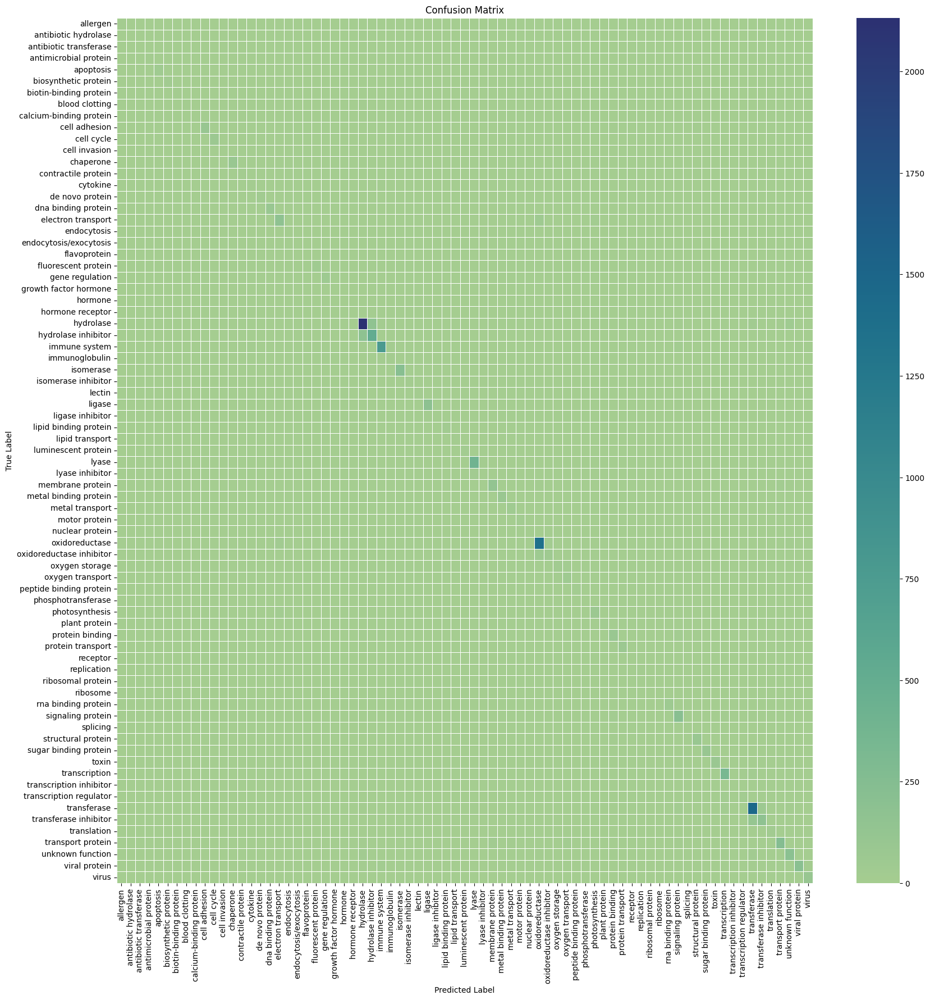

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_bert3 = confusion_matrix(targets, predicted)
sns.heatmap(cm_bert3, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels_dict.keys(), yticklabels=labels_dict.keys())
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

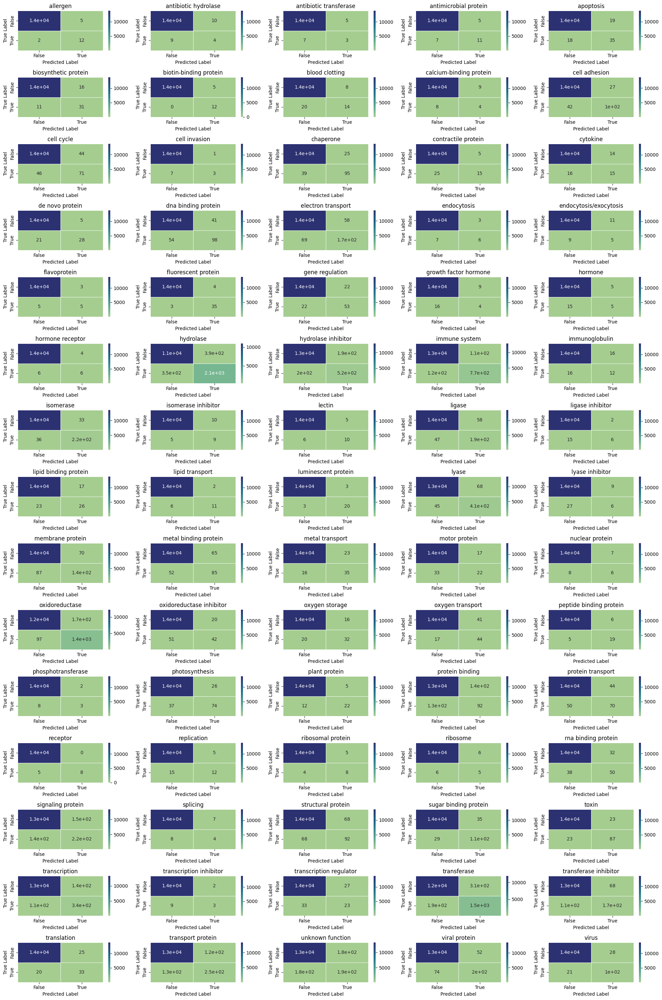

In [ ]:
multi_cm_bert3 = multilabel_confusion_matrix(targets, predicted, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])

# Plotting confusion matrix for each class
label = list(labels_dict.keys())
fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_bert3):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(label[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

In [ ]:
bert_df3 = df_test_unimers.copy()
bert_df3['prediction'] = predicted
bert_df3['predicted_class'] = bert_df3['prediction'].map(labels_dict_reverse)
bert_df3['actual_class'] = bert_df3['classes'].map(labels_dict_reverse)
bert_df3

,sequences,classes,prediction,predicted_class,actual_class
210736,I S E F D Y K D H D I D Y K D D D D K W I M S...,63,63,sugar binding protein,sugar binding protein
250005,N Y M G N P W T E Y M A K Y D I E E V H G S G...,11,11,cell invasion,cell invasion
319628,K V F G R C E L A A A M K R H G L D N Y R G Y...,26,26,hydrolase,hydrolase
100570,S I K R S K K N S L A L S L T A D Q M V S A L...,65,65,transcription,transcription
196468,K E P E K P I D R E K T C P L L L R V F T T N...,65,65,transcription,transcription
...,...,...,...,...,...
121259,M T Y K I G V V G D K D S V S P F R L F G F D...,26,26,hydrolase,hydrolase
309259,M T D R Y S F S L T T F S P S G K L G Q I D Y...,27,27,hydrolase inhibitor,hydrolase inhibitor
12521,M A A T E G V G E S A P G G E P G Q P E Q P P...,68,68,transferase,transferase
41212,Y E A S I L T H D S S I R Y L Q E I Y N S N N...,7,7,blood clotting,blood clotting


## Comparison of BERT Models

In [ ]:
models = ['BertForSeqClassification', 'DistilBert', 'ProtBert']
acc = [0.73,  0.73, 0.77]
f1 = [0.73, 0.72, 0.76]
macro_f1 = [0.61, 0.61, 0.61]

In [ ]:
matrics_dict = {'Accuracy': acc, 'F1-Score weighted': f1, 'F1-Score macro': macro_f1}  # 'Models': model,

model_df = pd.DataFrame(matrics_dict.values(), columns = models).T
model_df.columns = ['Accuracy', 'F1-score weighted', 'F1-score macro']
model_df = model_df.sort_values(by = ['F1-score macro'], ascending = False)   # sort value according to highest f1-score
model_df

,Accuracy,F1-score weighted,F1-score macro
BertForSeqClassification,0.73,0.73,0.61
DistilBert,0.73,0.72,0.61
ProtBert,0.77,0.76,0.61


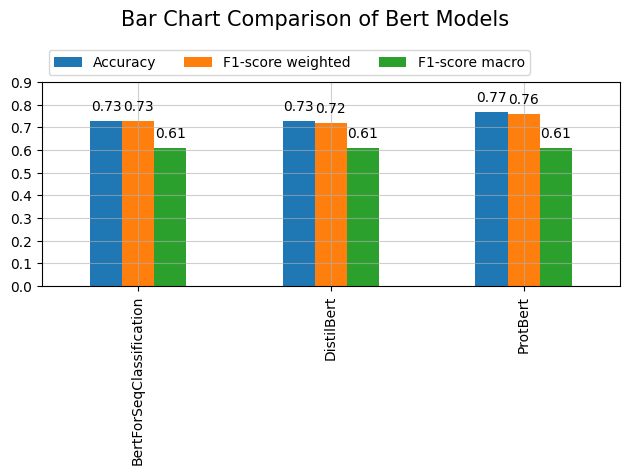

In [ ]:
# plt.figure(figsize = (10, 6))
ax = model_df.plot(kind = 'bar')
ax.legend(
    ncol=len(models),
    bbox_to_anchor=(0, 1),
    loc='lower left',
    prop={'size': 10}
)
for p in ax.patches:
    ax.annotate("%.2f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

plt.yticks(np.arange(0, 1, step=0.1))
plt.grid(alpha = 0.6)
plt.suptitle("Bar Chart Comparison of Bert Models",fontsize=15)
plt.tight_layout()
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/protein_seq_classification/pdb/comparison_models_bert.jpg', bbox_inches='tight')